**Аналитическая задача** -- по признаковому описанию построить портрет клиента, склонного к положительному отклику на рекламное предложение.

Предполагается, что получив такую оценку для некоторого множества клиентов, компания будет обращаться только к тем из них, которые склонны к отклику.

**Описание полей**

|Признак|Расшифровка|
|--:|:--|
| AGREEMENT_RK | уникальный идентификатор объекта в выборке |
| TARGET | целевая переменная:отклик на маркетинговую кампанию (1 - отклик был зарегистрирован, 0 - отклика не было) |
| AGE |	возраст клиента |
| SOCSTATUS_WORK_FL | социальный статус клиента относительно работы (1 - работает, 0 - не работает)|
| SOCSTATUS_PENS_FL | социальный статус клиента относительно пенсии (1 - пенсионер, 0 - не пенсионер)|
| GENDER | пол клиента |
| CHILD_TOTAL | количество детей клиента |
| DEPENDANTS | количество иждивенцев клиента
| EDUCATION | образование |
| MARITAL_STATUS | семейное положение |
| GEN_INDUSTRY | отрасль работы клиента |
| GEN_TITLE |	должность |
| ORG_TP_STATE |	форма собственности компании|
| ORG_TP_FCAPITAL |	отношение к иностранному капиталу|
| JOB_DIR |	направление деятельности внутри компании|
| FAMILY_INCOME |	семейный доход (несколько категорий)|
| PERSONAL_INCOME |	личный доход клиента (в рублях)|
| REG_ADDRESS_PROVINCE | область регистрации клиента|
| FACT_ADDRESS_PROVINCE | область фактического пребывания клиента |
| POSTAL_ADDRESS_PROVINCE |	почтовый адрес область|
| TP_PROVINCE |	область торговой точки, где клиент брал последний кредит|
| REGION_NM	| регион РФ |
| FL_PRESENCE_FL | наличие в собственности квартиры (1 - есть, 0 - нет)|
| OWN_AUTO | кол-во автомобилей в собственности|
| AUTO_RUS_FL | наличие в собственности автомобиля российского производства ( 1 - есть, 0 - нет)|
| HS_PRESENCE_FL |	наличие в собственности загородного дома (1 - есть, 0 - нет)|
| COT_PRESENCE_FL |	наличие в собственности котеджа (1 - есть, 0 - нет) |
| GAR_PRESENCE_FL |	наличие в собственности гаража (1 - есть, 0 - нет)|
| LAND_PRESENCE_FL | наличие в собственности земельного участка (1 - есть, 0 - нет)|
| FACT_LIVING_TERM | количество месяцев проживания по месту фактического пребывания |
| WORK_TIME | время работы на текущем месте (в месяцах) |
| CREDIT | сумма последнего кредита клиента (в рублях) |
| TERM | срок кредита, мес.|
| LOAN_NUM_PAYM | количество платежей, которые сделал клиент |
| LOAN_DLQ_NUM | количество просрочек, допущенных клиентом |
| LOAN_MAX_DLQ_AMT | максимальная сумма просрочки (в рублях) |
| DATE_CREDIT | дата взятия кредита |

**Примерный план по выполнению проекта**

Шаг 1. Загрузка данных;

Шаг 2. Первичная обработка данных (при необходимости):
- скорректировать заголовки;
- скорректировать типы признаков;
- проверить наличие дублирующихся записей;
- проверить наличие аномальных значений;
- восстановить пропущенные значения.

Шаг 3. Добавьте в таблицу следующие признаки:
- день недели, месяц и год взятия кредита;
- адрес регистрации и адрес фактического пребывания клиента совпадают (1 -- совпадает, 0 -- не совпадает);
- адрес фактического пребывания клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);
- адрес регистрации клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);
- почтовый, фактический и адрес регистрации совпадают (1 -- совпадают, 0 -- не совпадают);
- область регистрации, фактического пребывания, почтового адреса и область расположения торговой точки, где клиент брал кредит совпадают (1 -- совпадают, 0 -- не совпадают);

Шаг 4. Провести исследовательский анализ данных:
- исследовать динамику количества кредитов по годам, месяцам;
- исследовать числовые и категориальные признаки в разрезе целевого признака;
- сделать выводы о влиянии признаков на целевой признак.

### Загрузка библиотек

In [ ]:
# загрузка debug (https://zohaib.me/debugging-in-google-collab-notebook/)
# (use with %pdb on)
# ipdb.set_trace()

!pip install -Uqq ipdb
import ipdb

In [ ]:
# библиотеки для работы с таблицами и массивами
import pandas as pd
import numpy as np

# библиотеки для работы с графиками
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

#подключение методов для проверки гипотез о виде закона распределения,
from scipy.stats import shapiro
from scipy.stats import kstest
from scipy.stats import ks_2samp
from scipy.stats import anderson
from scipy.stats import jarque_bera
from sklearn.preprocessing import LabelEncoder
from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu

In [ ]:
# для подсчета значений нижнего и верхнего усов была предложена следующая функция
def calc_boxplot(df_col : pd.Series) -> tuple:

    """
    Функция для расчета значений нижнего и верхнего усов.
    На вход подается столбец датафрейма,
    на выходе кортеж: первый элемент -- нижний ус, второй элемент -- верхний ус
    """

    Q1, median, Q3 = np.percentile(np.asarray(df_col.dropna()), [25, 50, 75])
    IQR = Q3 - Q1
    loval = Q1 - 1.5 * IQR
    hival = Q3 + 1.5 * IQR
    wiskhi = np.compress(np.asarray(df_col.dropna()) <= hival, np.asarray(df_col.dropna()))
    wisklo = np.compress(np.asarray(df_col.dropna()) >= loval, np.asarray(df_col.dropna()))
    actual_hival = np.max(wiskhi)
    actual_loval = np.min(wisklo)
    return actual_loval, actual_hival #(нижний ус, верхний ус)

In [ ]:
# расчёт для биноминальных распределений
def test_z_criterion(col, goal, alpha):
    import scipy.stats as st
    import math
    gen_group_shape = df[col].value_counts()
    goal_group_shape = df.groupby(col)[goal].sum()
    p = goal_group_shape / gen_group_shape
    p_combined = goal_group_shape.sum() / gen_group_shape.sum()
    difference = p.iloc[0] - p.iloc[1]
    z_value = difference / math.sqrt(p_combined * (1 - p_combined) * (1/gen_group_shape.iloc[0] + 1/gen_group_shape.iloc[1]))
    distr = st.norm(0, 1)
    p_value = (1 - distr.cdf(abs(z_value))) * 2
    print('Результаты проверки гипотезы H_0 по z-критерию:')
    print('Уровень значимости alpha={:.2f}'.format(alpha))
    print('P-value: {:.2f}'.format(p_value))
    if p_value < alpha:
        print(f"""Отвергаем нулевую гипотезу: разница в долях
по признаку <<{col}>> статистически значима.""")
    else: print(f"""Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<{col}>> статистически незначима.""")
    print('------------------------------------------------------------')

In [ ]:
# изменения отображения формата float
pd.options.display.float_format = '{:.2f}'.format

### Шаг 1. Загрузка и просмотр дата-фрейма

In [ ]:
# загрузка и предварительный просмотр дата-фрейма
df = pd.read_csv('/content/dataset_target_company.csv')
display(df.head(5).T)

,0,1,2,3,4
AGREEMENT_RK,59910150,59910230,59910525,59910803,59911781
TARGET,0,0,0,0,0
AGE,49,32,52,39,30
SOCSTATUS_WORK_FL,1,1,1,1,1
SOCSTATUS_PENS_FL,0,0,0,0,0
GENDER,1,1,1,1,0
CHILD_TOTAL,2,3,4,1,0
DEPENDANTS,1,3,0,1,0
EDUCATION,Среднее специальное,Среднее,Неполное среднее,Высшее,Среднее
MARITAL_STATUS,Состою в браке,Состою в браке,Состою в браке,Состою в браке,Состою в браке


In [ ]:
# просмотр колличества строк и колонок (n_rows, n_columns)
df.shape

(15223, 37)

In [ ]:
# просмотр наименования колонок
display(df.columns)

Index(['AGREEMENT_RK', 'TARGET', 'AGE', 'SOCSTATUS_WORK_FL',
       'SOCSTATUS_PENS_FL', 'GENDER', 'CHILD_TOTAL', 'DEPENDANTS', 'EDUCATION',
       'MARITAL_STATUS', 'GEN_INDUSTRY', 'GEN_TITLE', 'ORG_TP_STATE',
       'ORG_TP_FCAPITAL', 'JOB_DIR', 'FAMILY_INCOME', 'PERSONAL_INCOME',
       'REG_ADDRESS_PROVINCE', 'FACT_ADDRESS_PROVINCE',
       'POSTAL_ADDRESS_PROVINCE', 'TP_PROVINCE', 'REGION_NM', 'FL_PRESENCE_FL',
       'OWN_AUTO', 'AUTO_RUS_FL', 'HS_PRESENCE_FL', 'COT_PRESENCE_FL',
       'GAR_PRESENCE_FL', 'LAND_PRESENCE_FL', 'CREDIT', 'TERM',
       'FACT_LIVING_TERM', 'WORK_TIME', 'LOAN_NUM_PAYM', 'LOAN_DLQ_NUM',
       'LOAN_MAX_DLQ_AMT', 'DATE_CREDIT'],
      dtype='object')

In [ ]:
# просмотр типов данных
display(df.dtypes)

# DATE_CREDIT содержит неккоретный тип данных (object -> datatime)

AGREEMENT_RK                 int64
TARGET                       int64
AGE                          int64
SOCSTATUS_WORK_FL            int64
SOCSTATUS_PENS_FL            int64
GENDER                       int64
CHILD_TOTAL                  int64
DEPENDANTS                   int64
EDUCATION                   object
MARITAL_STATUS              object
GEN_INDUSTRY                object
GEN_TITLE                   object
ORG_TP_STATE                object
ORG_TP_FCAPITAL             object
JOB_DIR                     object
FAMILY_INCOME               object
PERSONAL_INCOME            float64
REG_ADDRESS_PROVINCE        object
FACT_ADDRESS_PROVINCE       object
POSTAL_ADDRESS_PROVINCE     object
TP_PROVINCE                 object
REGION_NM                   object
FL_PRESENCE_FL               int64
OWN_AUTO                     int64
AUTO_RUS_FL                  int64
HS_PRESENCE_FL               int64
COT_PRESENCE_FL              int64
GAR_PRESENCE_FL              int64
LAND_PRESENCE_FL    

In [ ]:
# просмотр уникальных значений
df.nunique()

AGREEMENT_RK               15223
TARGET                         2
AGE                           47
SOCSTATUS_WORK_FL              2
SOCSTATUS_PENS_FL              2
GENDER                         2
CHILD_TOTAL                   10
DEPENDANTS                     8
EDUCATION                      7
MARITAL_STATUS                 5
GEN_INDUSTRY                  31
GEN_TITLE                     12
ORG_TP_STATE                   5
ORG_TP_FCAPITAL                2
JOB_DIR                       10
FAMILY_INCOME                  5
PERSONAL_INCOME              274
REG_ADDRESS_PROVINCE          81
FACT_ADDRESS_PROVINCE         81
POSTAL_ADDRESS_PROVINCE       80
TP_PROVINCE                   70
REGION_NM                     11
FL_PRESENCE_FL                 2
OWN_AUTO                       3
AUTO_RUS_FL                    2
HS_PRESENCE_FL                 2
COT_PRESENCE_FL                2
GAR_PRESENCE_FL                2
LAND_PRESENCE_FL               2
CREDIT                      8029
TERM      

### Шаг 2. Первичная обработка данных:

- скорректировать заголовки;
- скорректировать типы признаков;
- проверить наличие дублирующихся записей;
- проверить наличие аномальных значений;
- восстановить пропущенные значения

#### 1. Корректировка заголовков

In [ ]:
# приводит к нижнему реестру для удобства работы
df.columns = df.columns.str.lower()
display(df.columns)

Index(['agreement_rk', 'target', 'age', 'socstatus_work_fl',
       'socstatus_pens_fl', 'gender', 'child_total', 'dependants', 'education',
       'marital_status', 'gen_industry', 'gen_title', 'org_tp_state',
       'org_tp_fcapital', 'job_dir', 'family_income', 'personal_income',
       'reg_address_province', 'fact_address_province',
       'postal_address_province', 'tp_province', 'region_nm', 'fl_presence_fl',
       'own_auto', 'auto_rus_fl', 'hs_presence_fl', 'cot_presence_fl',
       'gar_presence_fl', 'land_presence_fl', 'credit', 'term',
       'fact_living_term', 'work_time', 'loan_num_paym', 'loan_dlq_num',
       'loan_max_dlq_amt', 'date_credit'],
      dtype='object')

#### 2. Корректировка типов данных

In [ ]:
# корректировка данных для даты
df.date_credit = pd.to_datetime(df.date_credit)

# проверка
print("Тип данных для {date_credit} теперь содержит - ", df.date_credit.dtypes)

Тип данных для {date_credit} теперь содержит -  datetime64[ns]


#### 3. Проверка наличия дублирующих значений

In [ ]:
# удаление столбца agreement_rk
df.drop(columns='agreement_rk', inplace=True)

# проверка дублей
print("Количество дублей равно = ", df.duplicated().sum())

Количество дублей равно =  0


#### 4. Поиск отрицательных значений в данных

In [ ]:
# поиск отрицательных значений в данных
def print_negative_values_count(df):
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numeric_cols:
        print(f"Отрицательные значения в {col}: {len(df[df[col] < 0])}")

print_negative_values_count(df)


# создаю переменную которой присваиваю метод select_dtypes, чтобы выбрать только числовые столбцы (для int и float). Затем получаем название столбцов с помощью columnns
# в этой строке кода мы выводим информацию о количестве отрицательных значений в каждом столбце.
# мы используем фигурные скобки {} и префикс f перед строкой, чтобы вставить значение переменной col в строку.
# затем мы используем фильтрацию DataFrame df[df[col] < 0], чтобы выбрать только строки, в которых значения столбца col меньше нуля
# мы используем функцию len для подсчета количества строк, удовлетворяющих условию, и выводим это значение вместе с информацией о столбце.

Отрицательные значения в target: 0
Отрицательные значения в age: 0
Отрицательные значения в socstatus_work_fl: 0
Отрицательные значения в socstatus_pens_fl: 0
Отрицательные значения в gender: 0
Отрицательные значения в child_total: 0
Отрицательные значения в dependants: 0
Отрицательные значения в personal_income: 0
Отрицательные значения в fl_presence_fl: 0
Отрицательные значения в own_auto: 0
Отрицательные значения в auto_rus_fl: 0
Отрицательные значения в hs_presence_fl: 0
Отрицательные значения в cot_presence_fl: 0
Отрицательные значения в gar_presence_fl: 0
Отрицательные значения в land_presence_fl: 0
Отрицательные значения в credit: 0
Отрицательные значения в term: 0
Отрицательные значения в fact_living_term: 1
Отрицательные значения в work_time: 0
Отрицательные значения в loan_num_paym: 0
Отрицательные значения в loan_dlq_num: 0
Отрицательные значения в loan_max_dlq_amt: 0


In [ ]:
# возьмёт строки с отрицательными значениями в fact_living_term (количество месяцев проживания по месту фактического пребывания)
negative_fact_living_term_rows = df[df['fact_living_term'] < 0]

# вывод для более подробного анализа
display(negative_fact_living_term_rows)

,target,age,socstatus_work_fl,socstatus_pens_fl,gender,child_total,dependants,education,marital_status,gen_industry,...,gar_presence_fl,land_presence_fl,credit,term,fact_living_term,work_time,loan_num_paym,loan_dlq_num,loan_max_dlq_amt,date_credit
6246,0,56,1,0,1,0,0,Высшее,Состою в браке,Строительство,...,0,0,98136.00,24,-26,288.00,4,0,0.00,2018-07-25 13:34:03


In [ ]:
# решаем, что это была ошибка ввода и вместо -26, мы присваиваем абсолютное значение
df.loc[df['fact_living_term'] < 0, 'fact_living_term'] = df.loc[df['fact_living_term'] < 0, 'fact_living_term'].abs()

In [ ]:
# проверяем
print_negative_values_count(df)

Отрицательные значения в target: 0
Отрицательные значения в age: 0
Отрицательные значения в socstatus_work_fl: 0
Отрицательные значения в socstatus_pens_fl: 0
Отрицательные значения в gender: 0
Отрицательные значения в child_total: 0
Отрицательные значения в dependants: 0
Отрицательные значения в personal_income: 0
Отрицательные значения в fl_presence_fl: 0
Отрицательные значения в own_auto: 0
Отрицательные значения в auto_rus_fl: 0
Отрицательные значения в hs_presence_fl: 0
Отрицательные значения в cot_presence_fl: 0
Отрицательные значения в gar_presence_fl: 0
Отрицательные значения в land_presence_fl: 0
Отрицательные значения в credit: 0
Отрицательные значения в term: 0
Отрицательные значения в fact_living_term: 0
Отрицательные значения в work_time: 0
Отрицательные значения в loan_num_paym: 0
Отрицательные значения в loan_dlq_num: 0
Отрицательные значения в loan_max_dlq_amt: 0


#### 5. Поиск и обработка аномалий

##### 5.1. Разделение на категории

In [ ]:
# смотрим название столбцов
display(df.columns)

Index(['target', 'age', 'socstatus_work_fl', 'socstatus_pens_fl', 'gender',
       'child_total', 'dependants', 'education', 'marital_status',
       'gen_industry', 'gen_title', 'org_tp_state', 'org_tp_fcapital',
       'job_dir', 'family_income', 'personal_income', 'reg_address_province',
       'fact_address_province', 'postal_address_province', 'tp_province',
       'region_nm', 'fl_presence_fl', 'own_auto', 'auto_rus_fl',
       'hs_presence_fl', 'cot_presence_fl', 'gar_presence_fl',
       'land_presence_fl', 'credit', 'term', 'fact_living_term', 'work_time',
       'loan_num_paym', 'loan_dlq_num', 'loan_max_dlq_amt', 'date_credit'],
      dtype='object')

In [ ]:
# функция для обработки значений и присвоения их к категориальным, числовым и бинарным

def categorize_features(df):
    numeric_features = []
    categorical_features = []
    binary_features = []

    for column in df.columns:
        unique_values = df[column].nunique()

        if unique_values == 2: # если два уникальных значения
            binary_features.append(column) # считается бинарным
        elif df[column].dtype in ['int64', 'float64']: # если соответствует типу float и int
            numeric_features.append(column) # то числовой
        elif df[column].dtype == 'object': # если object
            categorical_features.append(column) # записываем в категориальный

    return {
        'Numeric Features': numeric_features,
        'Categorical Features': categorical_features,
        'Binary Features': binary_features
    }

result = categorize_features(df)

print("Numeric Features:", result['Numeric Features'])
print("Categorical Features:", result['Categorical Features'])
print("Binary Features:", result['Binary Features'])

# сначала создаются три пустых списка
# затем происходит итерация по всем столбцам DataFrame
# задаем метод nunique, который возвращает количество уникальных значений в столбце.
# результат операций вернется в качестве словаря

Numeric Features: ['age', 'child_total', 'dependants', 'personal_income', 'own_auto', 'credit', 'term', 'fact_living_term', 'work_time', 'loan_num_paym', 'loan_dlq_num', 'loan_max_dlq_amt']
Categorical Features: ['education', 'marital_status', 'gen_industry', 'gen_title', 'org_tp_state', 'job_dir', 'family_income', 'reg_address_province', 'fact_address_province', 'postal_address_province', 'tp_province', 'region_nm']
Binary Features: ['target', 'socstatus_work_fl', 'socstatus_pens_fl', 'gender', 'org_tp_fcapital', 'fl_presence_fl', 'auto_rus_fl', 'hs_presence_fl', 'cot_presence_fl', 'gar_presence_fl', 'land_presence_fl']


##### 5.2 Заметки для числовых признаков


К числовым признакам мы отнесли:

|Признак|Расшифровка|
|--:|:--|
| PERSONAL_INCOME | личный доход клиента (в рублях)|
| FACT_LIVING_TERM | количество месяцев проживания по месту фактического пребывания |
| WORK_TIME | время работы на текущем месте (в месяцах) |
| CREDIT | сумма последнего кредита клиента (в рублях) |
| TERM | срок кредита, мес.|
| LOAN_NUM_PAYM | количество платежей, которые сделал клиент |
| LOAN_DLQ_NUM | количество просрочек, допущенных клиентом |
| LOAN_MAX_DLQ_AMT | максимальная сумма просрочки (в рублях) |


In [ ]:
# создаём переменную с выбранными значениями
select_value_columns = ['personal_income', 'fact_living_term', 'work_time', 'credit',
                        'term', 'loan_num_paym', 'loan_dlq_num', 'loan_max_dlq_amt']

In [ ]:
# просмотр значений
df_select_value = df[select_value_columns]
display(df_select_value.head(5))

,personal_income,fact_living_term,work_time,credit,term,loan_num_paym,loan_dlq_num,loan_max_dlq_amt
0,5000.00,220,18.00,8000.00,6,6,2,1580.00
1,12000.00,137,97.00,21650.00,6,6,1,4020.00
2,9000.00,251,84.00,33126.00,12,11,0,0.00
3,25000.00,36,168.00,8491.82,6,6,3,1590.00
4,12000.00,83,101.00,21990.00,12,16,2,2230.00


In [ ]:
# ознакамливаемся с данными
select_value_columns_description = df[select_value_columns]\
                    .describe(percentiles=[0.01,0.05,0.25,0.50,0.75,0.95,0.99])

select_value_columns_description.T

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
personal_income,15223.00,13853.84,9015.47,24.00,4300.00,5000.00,8000.00,12000.00,17000.00,30000.00,45000.00,250000.00
fact_living_term,15223.00,3039.34,262455.44,0.00,1.00,7.00,41.00,108.00,204.00,341.00,444.00,28101997.00
work_time,13855.00,292.21,24364.83,1.00,3.00,6.00,24.00,48.00,110.00,288.00,420.00,2867959.00
credit,15223.00,14667.96,12147.87,2000.00,2498.22,3500.00,6500.00,11550.00,19170.00,33800.00,70036.66,119700.00
term,15223.00,8.10,4.09,3.00,3.00,3.00,6.00,6.00,10.00,12.00,24.00,36.00
loan_num_paym,15223.00,7.88,7.96,1.00,1.00,2.00,4.00,5.00,8.00,24.00,41.00,114.00
loan_dlq_num,15223.00,0.20,0.69,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00,13.00
loan_max_dlq_amt,15223.00,243.02,836.10,0.00,0.00,0.00,0.00,0.00,0.00,1900.00,3780.00,28012.20


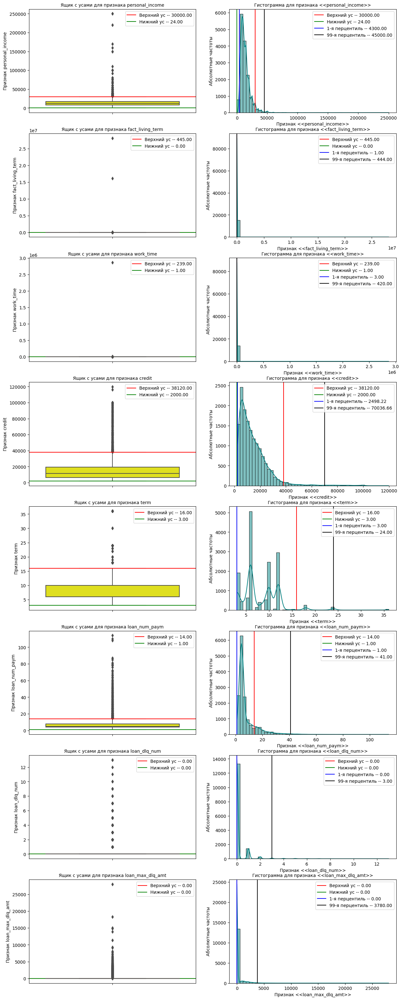

In [ ]:
# рисование ящика с усами и гистограммы для каждого признака
plt.subplots(nrows=len(select_value_columns), #определяем кол-во строк. len(df.columns) - вернет количество столбцов в df.
             ncols=2, # кол-во столбцов будет равняться двум
             figsize=(15, 5*len(select_value_columns))) # размер фигуры - ширина и высота

for index, col in enumerate(select_value_columns, start=1):

    # Ящик с усами
    plt.subplot(len(select_value_columns), 2, 2*index-1)
    #plt.subplot(len(select_value_columns), 2, index*2-1) #Эта строка создает первый подграфик внутри сетки. 2*index+1 вычисляет номер текущего подграфика в сетке.
    sns.boxplot(data=df,
                y=col,
                color='yellow')

    actual_loval, actual_hival = calc_boxplot(df[col]) # расчёт значения для нижнего и верхнего уса. Функция cal_boxplot определена у меня в начале кода
    plt.axhline(actual_hival,
            color='red',
            label=f'Верхний ус -- {actual_hival:.2f}') # добавляет горизонтальную линию (красного цвета) на графике, верхний ус
    plt.axhline(actual_loval,
            color='green',
            label=f'Нижний ус -- {actual_loval:.2f}')  # аналогично горизонтальная линия (зелёного цвета) - нижний ус
    plt.title(f"Ящик с усами для признака {(col)}", fontsize=10) # это заголовок, отображает имя текущего столбца(признака)
    plt.ylabel(f'Признак {col}', fontsize=10) # подпись к вертекальной оси, он нужен для того, чтобы отобразить признак col
    plt.legend() # добавляет легенду на график


    # Гистограмма
    plt.subplot(len(select_value_columns), 2, index*2) # здесь создается второй подграфик в сетке с тем же колличеством строк, что и количество столбцов в DataFrame и двумя столбцами
    #plt.subplot(len(select_value_columns), 2, 2*index-1)

    sns.histplot(data=df,
                 x=col,
                 bins=50,
                 kde=True,
                 color='teal')
    plt.title(f'Гистограмма для признака <<{(col)}>>', fontsize=10) # заголовок графика, устанавливается с указанием имени текущего столбца
    plt.xlabel(f'Признак <<{(col)}>>', fontsize=10) # подпись к горизонтальной оси, указывает, что это представляет собой признак (столбец) col
    plt.ylabel('Абсолютные частоты', fontsize=10) # Подпись к вертекальной оси, устанавливается для обозначения, что это абсолютные частоты в гистограмме
    plt.axvline(actual_hival, # здесь мы добавляет вертекальную линию, красного цвета, на гистограмму, представляющее верхний "ус" из графика ящика с усами, включая метку с его значением
                color='red',
                label=f'Верхний ус -- {actual_hival:.2f}')
    plt.axvline(actual_loval, # аналогично для вертикальной линии, зелёного цвета,  для нижнего уса с меткой
                color='green',
                label=f'Нижний ус -- {actual_loval:.2f}')
    per_1 = np.nanpercentile(df[col], 1) # здесь расчитываются значения 1-го и 99-го перцентилей для столбца кол в df
    per_99 = np.nanpercentile(df[col], 99) # здесь расчитываются значения 1-го и 99-го перцентилей для столбца кол в df
    plt.axvline(per_1, # создаем вертекальную линию на графике. plt.axvline - это функция библиотеки Matplotlib
                color='blue',
                label=f'1-я перцентиль -- {per_1:.2f}')  # label - параметр, используется для задания метки (подписи) элемента на графике.
    plt.axvline(per_99,
                color='black',
                label=f'99-я перцентиль -- {per_99:.2f}')
    plt.legend()

Наблюдения.


- Первоначально список к числовым признакам были представлены: `['age','child_total', 'dependants', 'personal_income', 'own_auto', 'fact_living_term', 'work_time', 'credit','term',  'loan_num_paym', 'loan_dlq_num','loan_max_dlq_amt']`. Но исходя из графиков было решение изменить некоторые признаки на категориальные
- `'age', 'child_total', 'dependants', 'own_auto' ` - стали категориальными признаками, на это указывали гистограммы.
<br>
- personal_income - 1 - 99%
- fact_living_tern - 1 - 99%
- work_time - нижний ус - 99%
- credit - нижний ус - 99%
- tern - 1 - 99%
- loan_num_paym - 1 - 99%
- loan_dlq_max - 1 - 99%
- loan_max_dlq_amt - 1 -99 %

In [ ]:
# создание фильтров
anomals_personal_income = df.personal_income.between(4300,45000)
anomals_fact_living_term = df.fact_living_term.between(1,444)
anomals_work_time = df.work_time.between(1,420)
anomals_credit = df.credit.between(2000,70036.66)
anomals_term = df.term.between(3,24)
anomals_loan_num_paym = df.loan_num_paym.between(1,41)
anomals_loan_dlq_num = df.loan_dlq_num.between(0,3)
anomals_loan_max_dlq_amt = df.loan_max_dlq_amt.between(0,3780)

# фильтр для удаления
anomals_resolt = (1 - df.loc[anomals_personal_income &
            anomals_fact_living_term &
            anomals_work_time &
            anomals_credit &
            anomals_term &
            anomals_loan_num_paym &
            anomals_loan_dlq_num &
            anomals_loan_max_dlq_amt].shape[0] / df.shape[0])*100

# выводим результат
print(f"Процент потерь данных: {anomals_resolt:.2f}%")

Процент потерь данных: 15.10%


In [ ]:
# смотрим старый датафрейм
df.shape

(15223, 36)

In [ ]:
# присваиваем значения без аномалий
df = df.loc[anomals_personal_income &
            anomals_fact_living_term &
            anomals_work_time &
            anomals_credit &
            anomals_term &
            anomals_loan_num_paym &
            anomals_loan_dlq_num &
            anomals_loan_max_dlq_amt ]

In [ ]:
# новый датафрейм
df.shape

(12924, 36)

Другой способ для самопроверки (обработки аномалий - не использовать)



In [ ]:
# Определяем границы для удаления аномалий (указанные числа) для каждого столбца
lower_bound_work_time = 1
lower_bound_credit = 2000


# Фильтруем данные для каждого столбца
filtered_data = df[
    (df['personal_income'] >= df['personal_income'].quantile(0.01)) & (df['personal_income'] <= df['personal_income'].quantile(0.99)) &
    (df['fact_living_term'] >= df['fact_living_term'].quantile(0.01)) & (df['fact_living_term'] <= df['fact_living_term'].quantile(0.99)) &
    (df['work_time'] >= lower_bound_work_time) & (df['work_time'] <=  df['work_time'].quantile(0.99)) &
    (df['credit'] >= lower_bound_credit) & (df['credit'] <= df['credit'].quantile(0.99)) &
    (df['term'] >= df['term'].quantile(0.01)) & (df['term'] <= df['term'].quantile(0.99)) &
    (df['loan_num_paym'] >= df['loan_num_paym'].quantile(0.01)) & (df['loan_num_paym'] <= df['loan_num_paym'].quantile(0.99)) &
    (df['loan_dlq_num'] >= df['loan_dlq_num'].quantile(0.01)) & (df['loan_dlq_num'] <= df['loan_dlq_num'].quantile(0.99)) &
    (df['loan_max_dlq_amt'] >= df['loan_max_dlq_amt'].quantile(0.01)) & (df['loan_max_dlq_amt'] <= df['loan_max_dlq_amt'].quantile(0.99))
]

# Посчитаем процент потерь данных
percentage_loss = (1 - len(filtered_data) / len(df)) * 100

# Выводим результат
print(f"Процент потерь данных: {percentage_loss:.2f}%")

Процент потерь данных: 8.82%


##### 5.3 Заметки для категориальных признаков

Категориальные

|Признак|Расшифровка|
|--:|:--|
| AGE | возраст клиента |
| CHILD_TOTAL | количество детей клиента |
| DEPENDANTS | количество иждивенцев клиента
| OWN_AUTO | кол-во автомобилей в собственности|
| EDUCATION | образование |
| GEN_INDUSTRY | отрасль работы клиента |
| GEN_TITLE | должность |
| ORG_TP_STATE |  форма собственности компании|
| JOB_DIR | направление деятельности внутри компании|
| FAMILY_INCOME | семейный доход (несколько категорий)|
| REG_ADDRESS_PROVINCE | область регистрации клиента|
| FACT_ADDRESS_PROVINCE | область фактического пребывания клиента |
| POSTAL_ADDRESS_PROVINCE | почтовый адрес область|
| TP_PROVINCE | область торговой точки, где клиент брал последний кредит|
| REGION_NM | регион РФ |
| DATE_CREDIT | дата взятия кредита |




In [ ]:
# создание фильтра для категориальных значений
select_categor_columns = ['age', 'child_total', 'dependants','marital_status',
                          'own_auto','education','gen_industry','gen_title',
                          'org_tp_state','job_dir','family_income',
                          'reg_address_province','fact_address_province',
                          'postal_address_province','tp_province','region_nm']

In [ ]:
# поиск и обработка аномальных значений категориных признаков
for col in select_categor_columns:
    print(f"Значения признака {col}")
    print(df[col].value_counts())
    print('-'*30)

Значения признака age
27    468
26    459
31    433
33    431
34    430
24    424
30    419
35    413
25    410
32    410
29    403
38    399
28    394
37    390
39    386
40    376
23    371
42    347
36    347
45    333
41    331
44    329
48    315
49    312
43    305
50    304
51    304
47    297
22    286
46    276
52    273
53    272
54    218
55    214
56    186
58    146
57    140
59     96
60     81
61     59
62     47
63     30
64     30
21     13
65     10
66      6
67      1
Name: age, dtype: int64
------------------------------
Значения признака child_total
1     4560
0     4145
2     3476
3      605
4       98
5       30
6        7
7        2
10       1
Name: child_total, dtype: int64
------------------------------
Значения признака dependants
0    6464
1    4185
2    2011
3     217
4      38
5       4
6       4
7       1
Name: dependants, dtype: int64
------------------------------
Значения признака marital_status
Состою в браке        8012
Не состоял в браке    3165
Раз

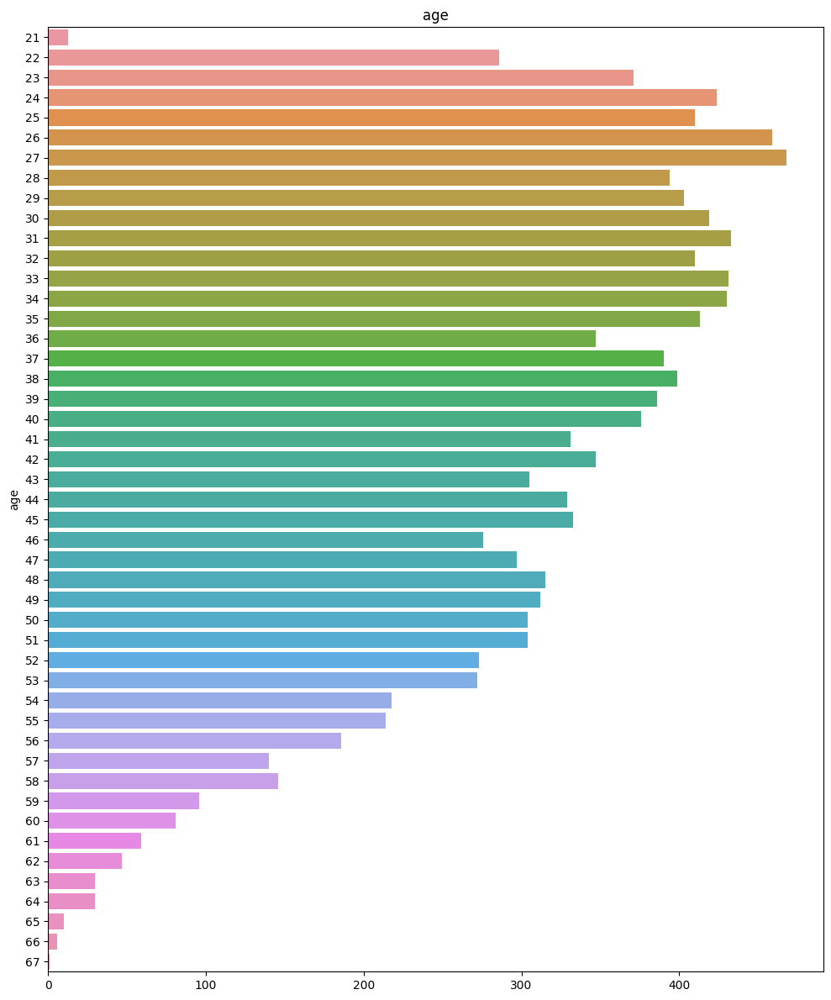

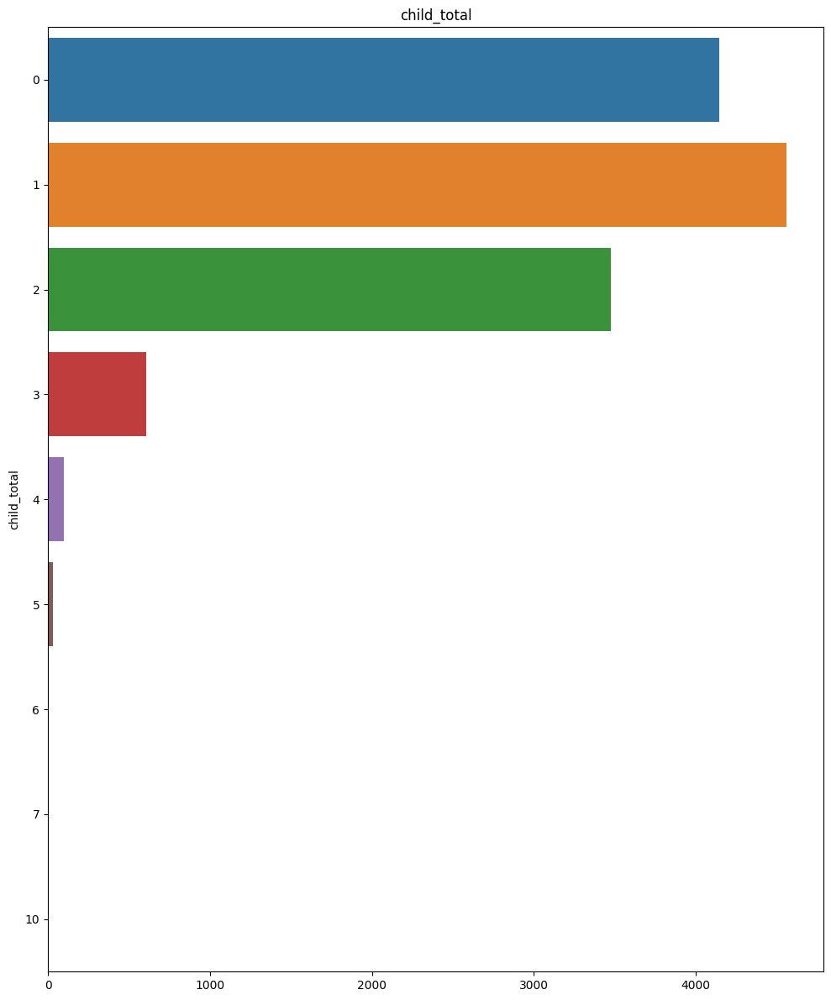

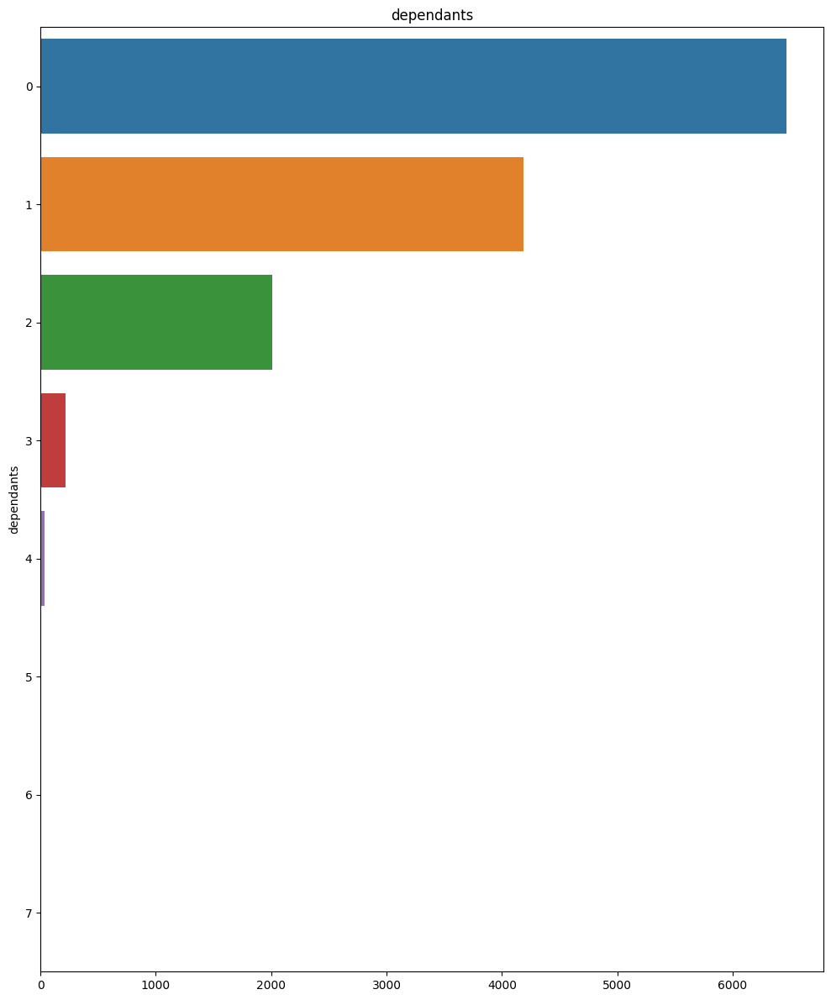

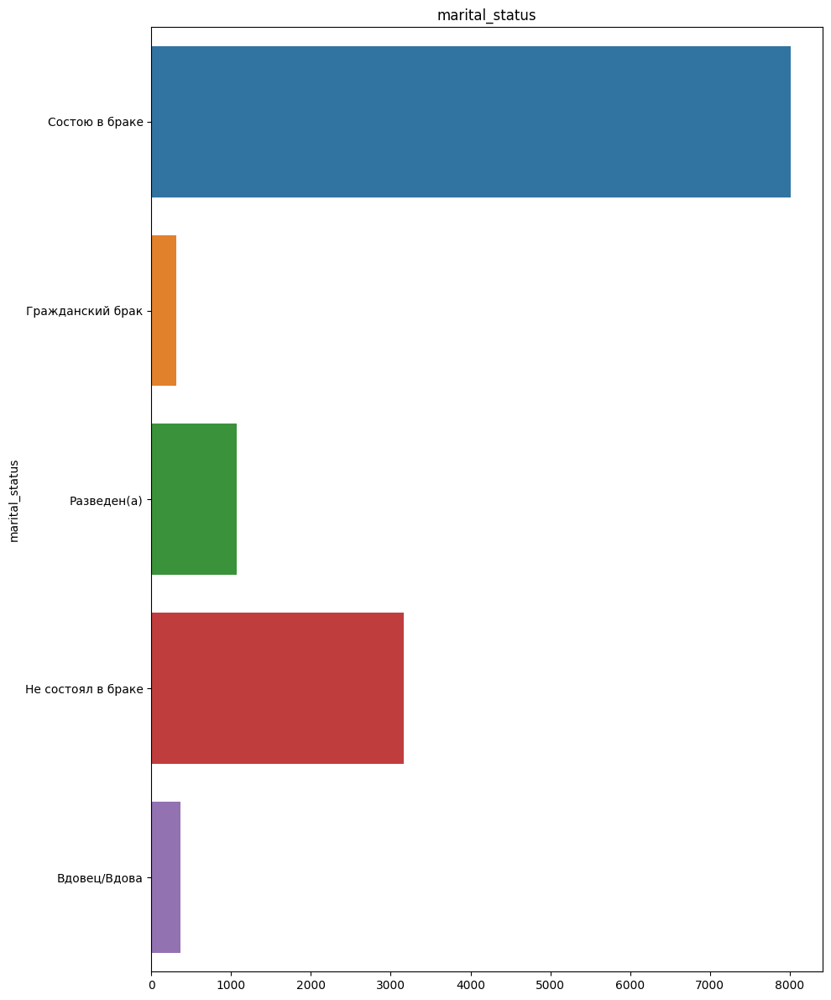

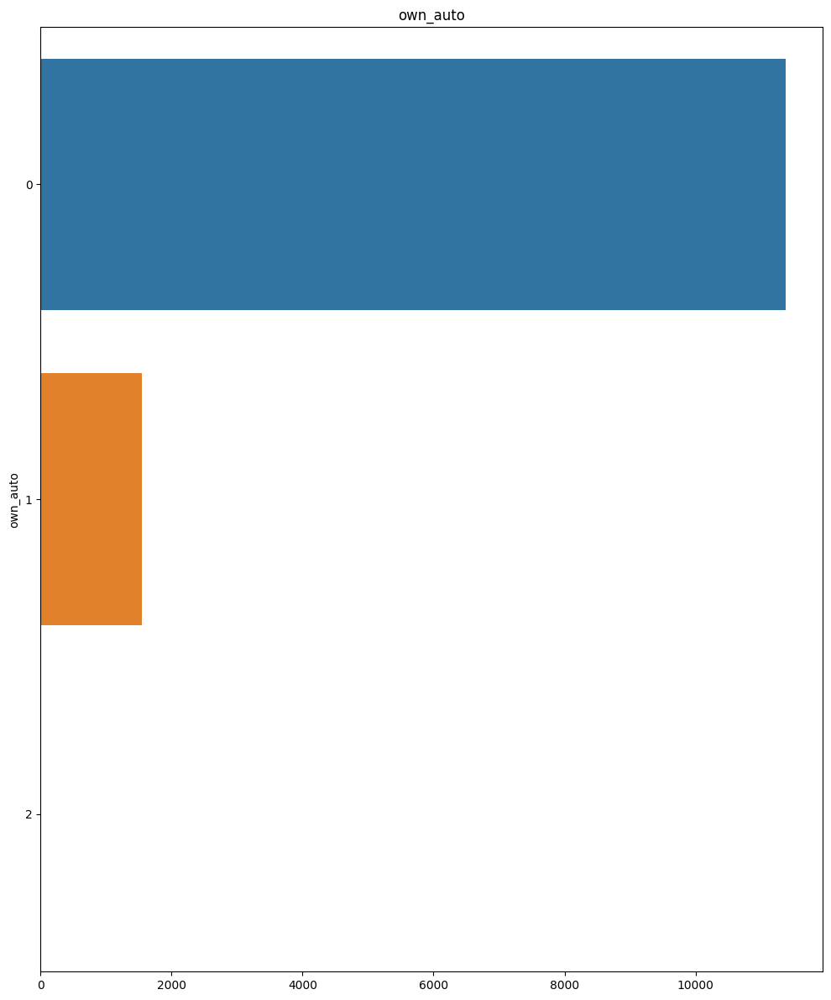

...

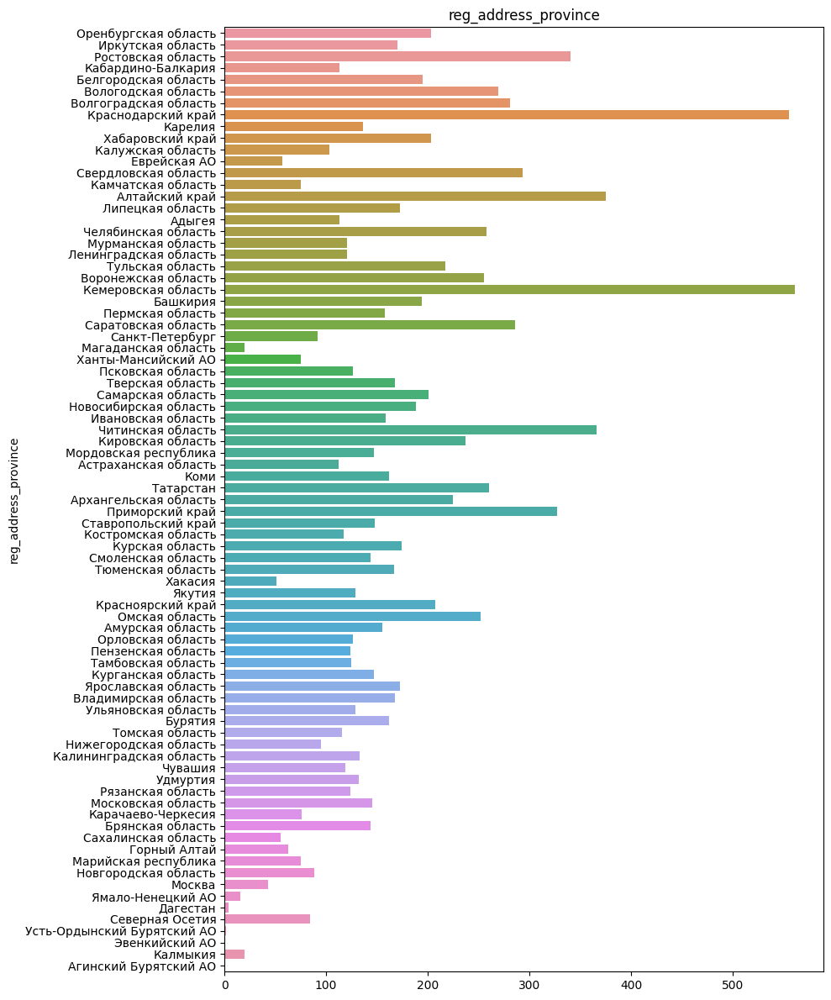

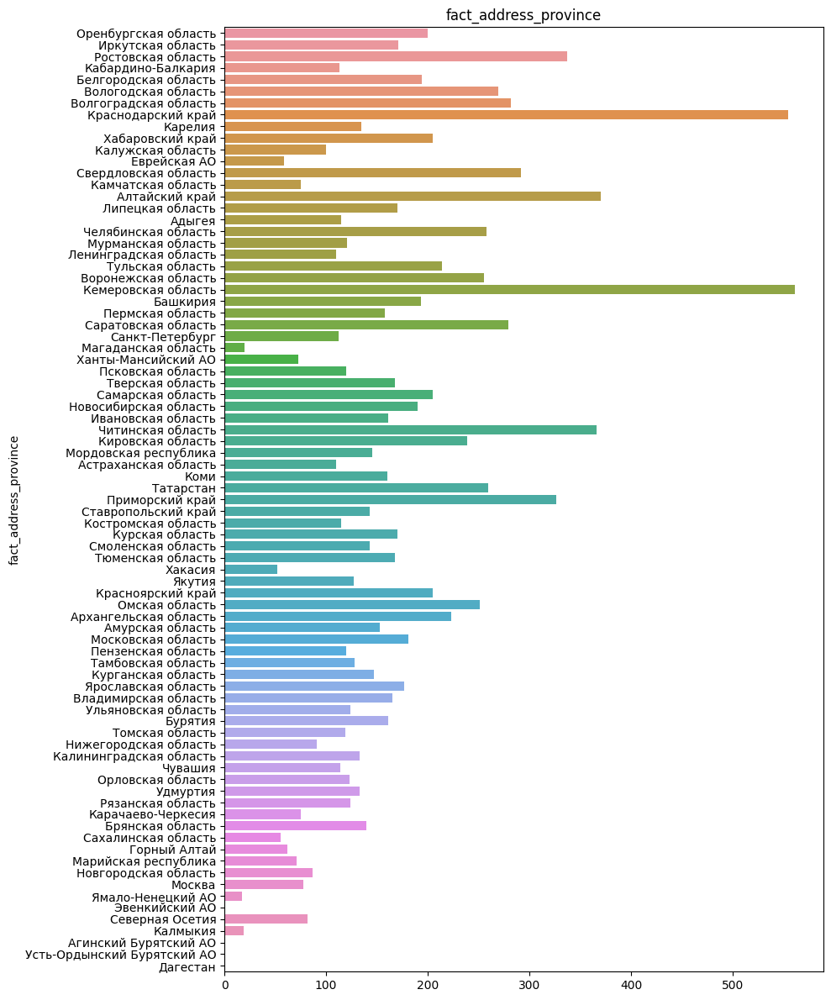

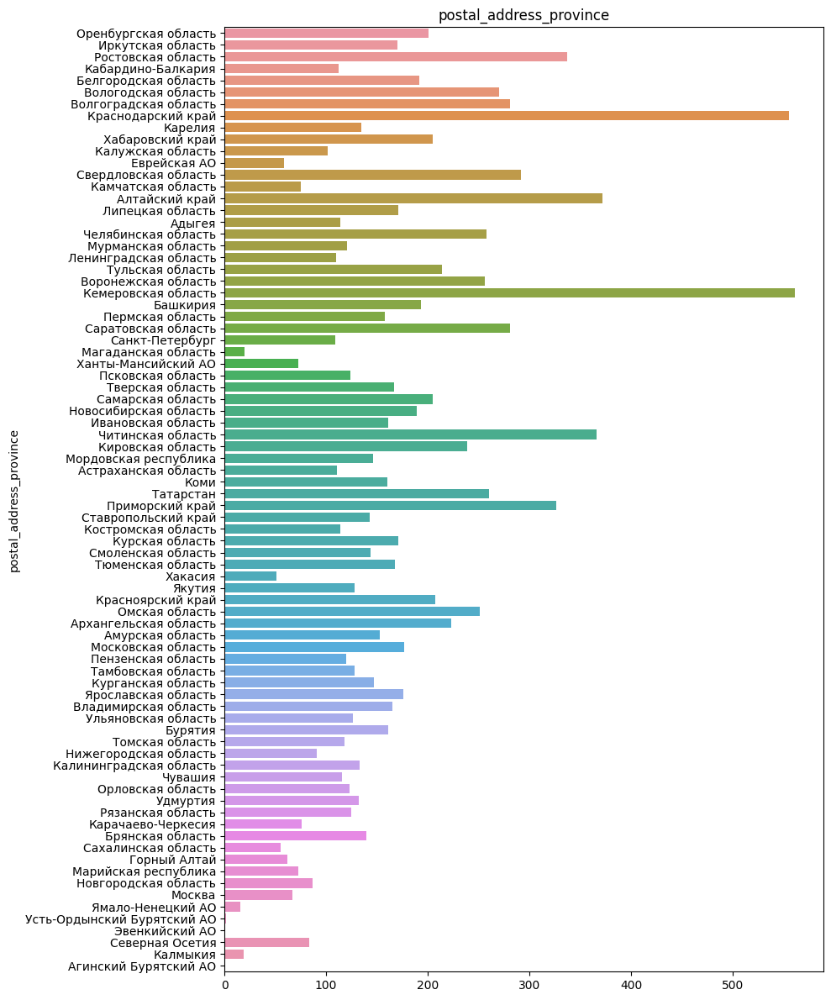

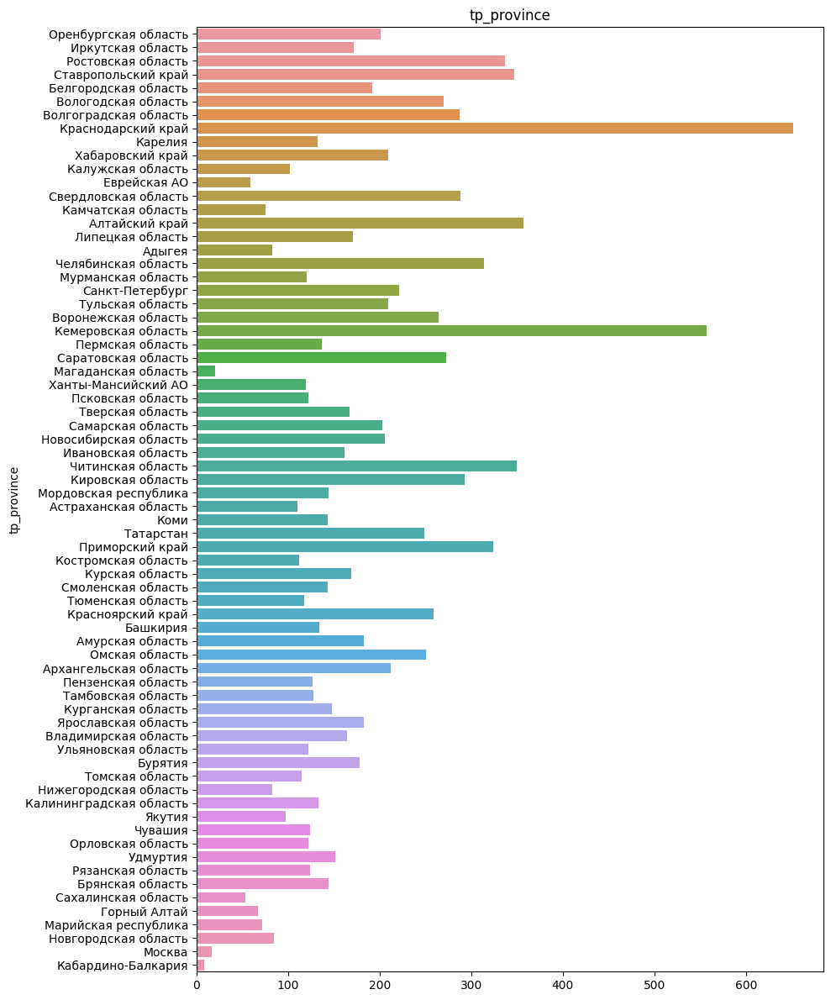

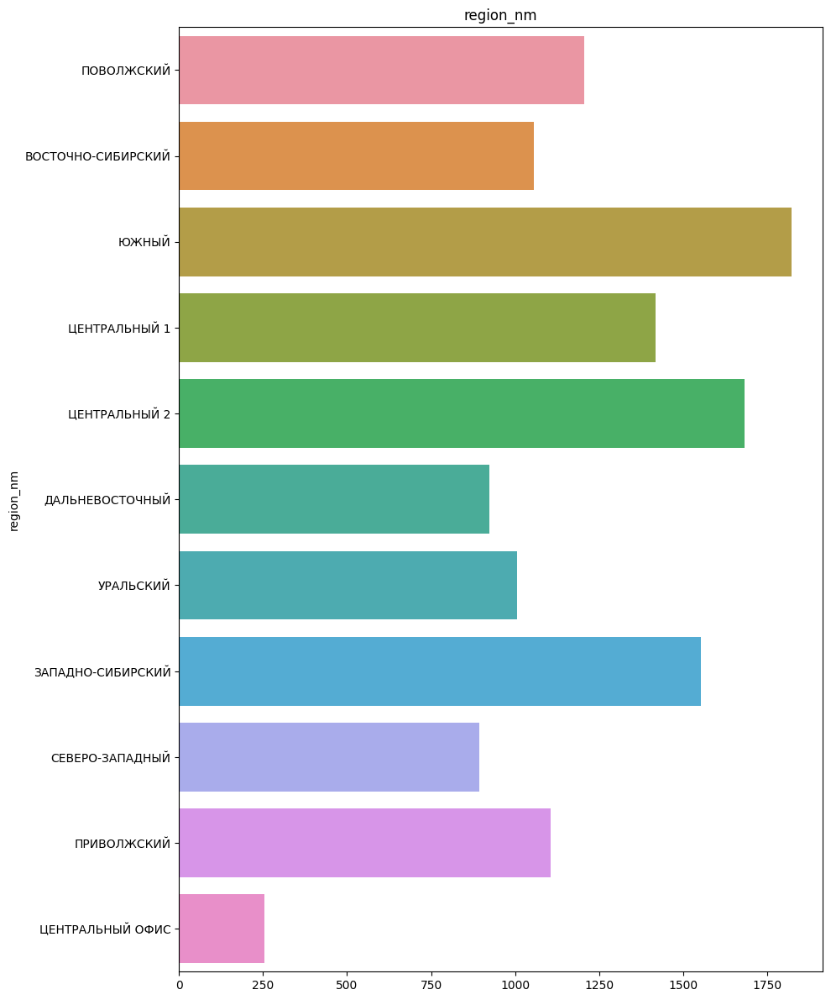

In [ ]:
#  отдельные столбчатые диаграммы для каждого категориального признака
for i, column in enumerate(select_categor_columns, 1):
    plt.figure(figsize=(10, 12))
    sns.countplot(y=column, data=df)
    plt.title(column)
    plt.xlabel('')

    plt.tight_layout()
    plt.show()

**Заметки о категориальных признаках:**

<br>

В целом, мы решили ничего не удалять и не править.
<br>
Но мы решили посмотреть эти категории по отношению к `target`

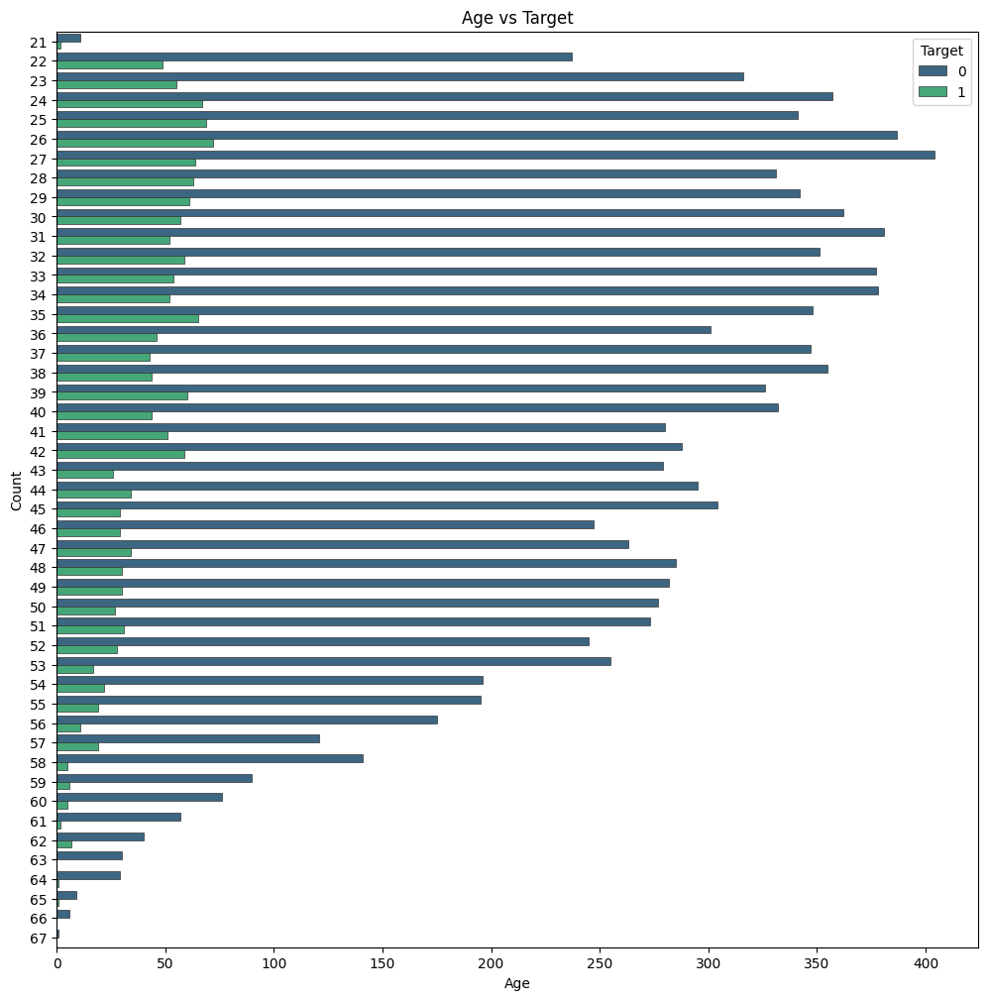

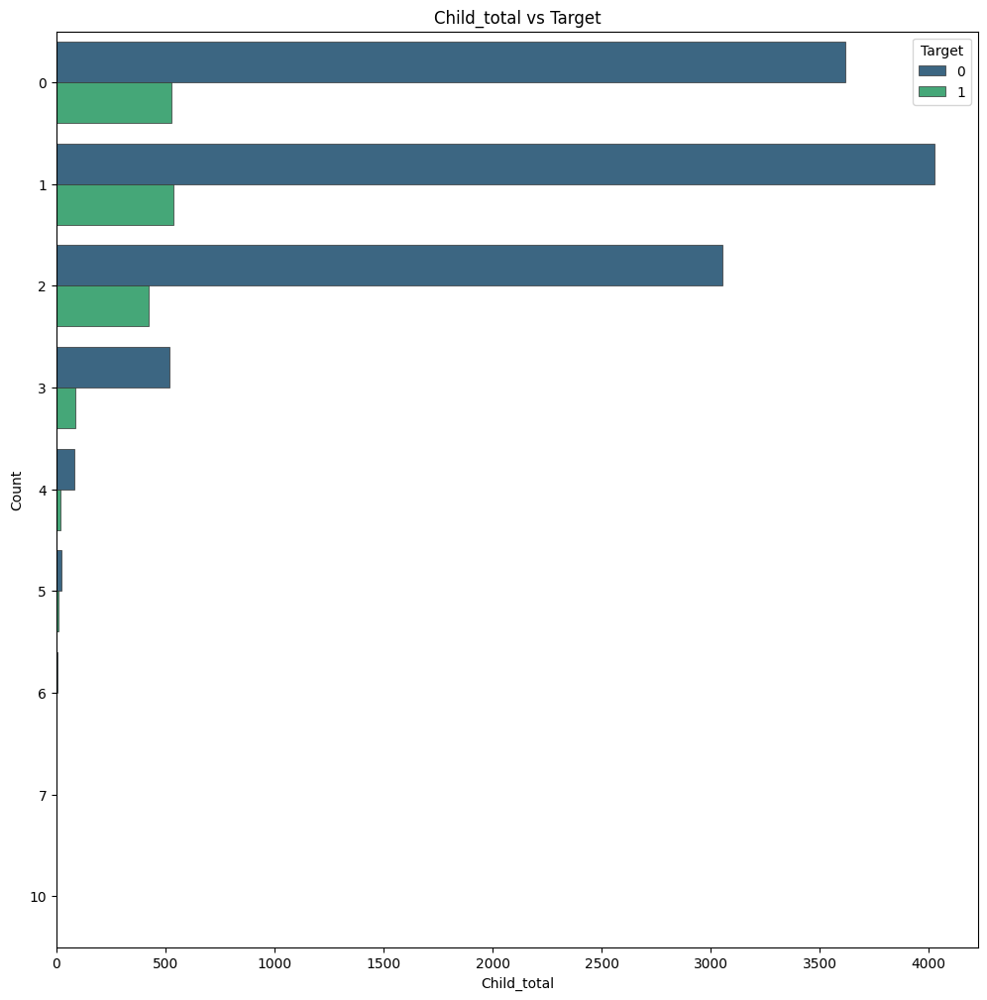

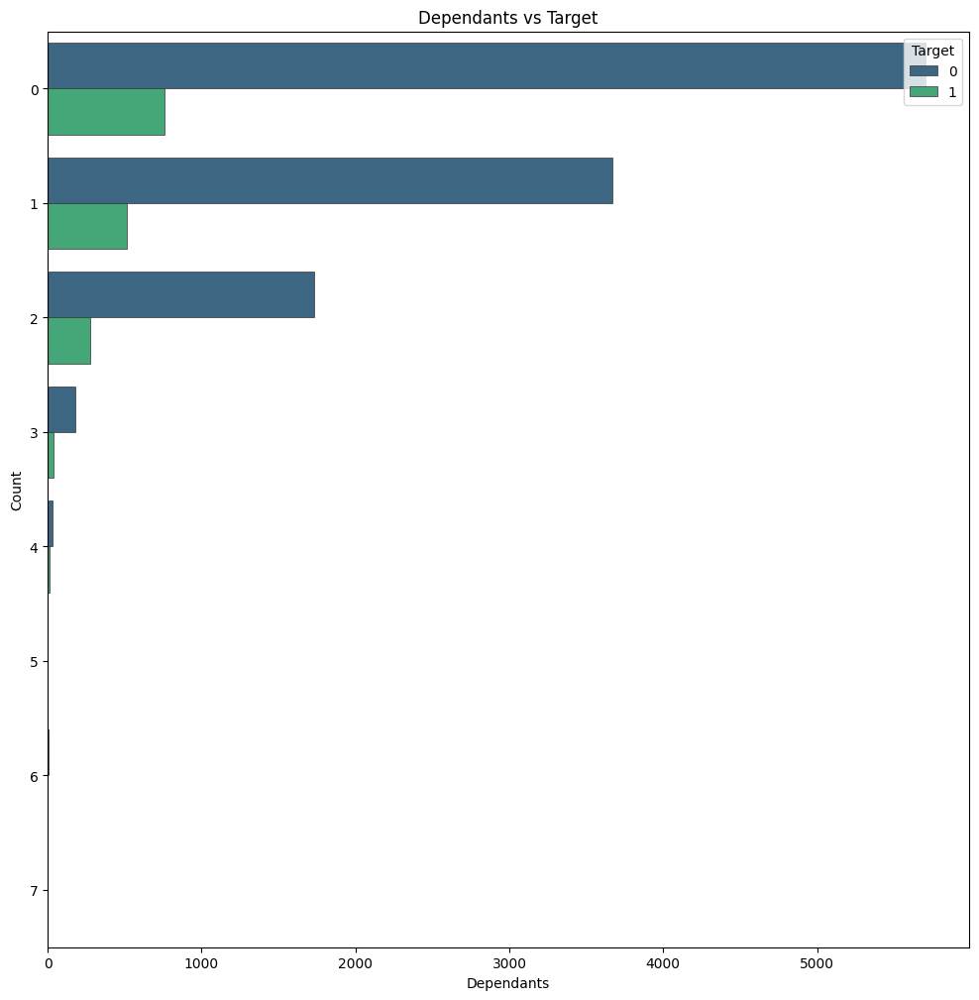

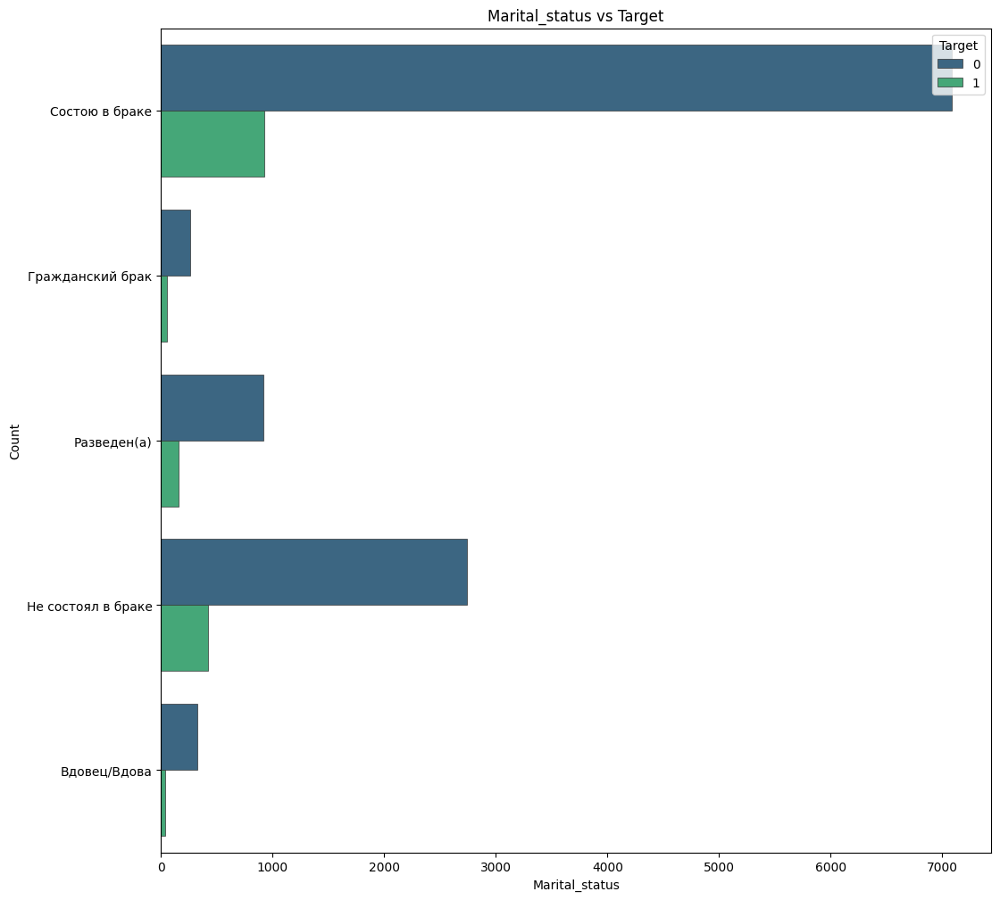

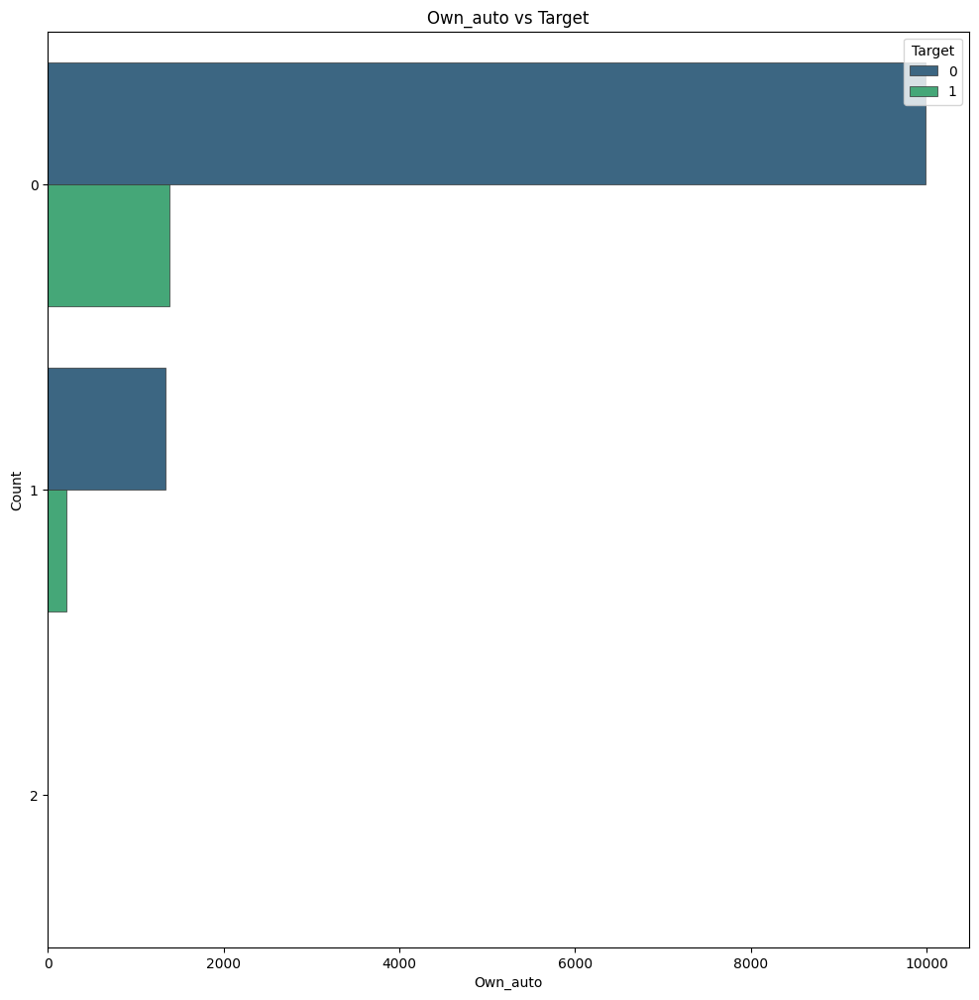

...

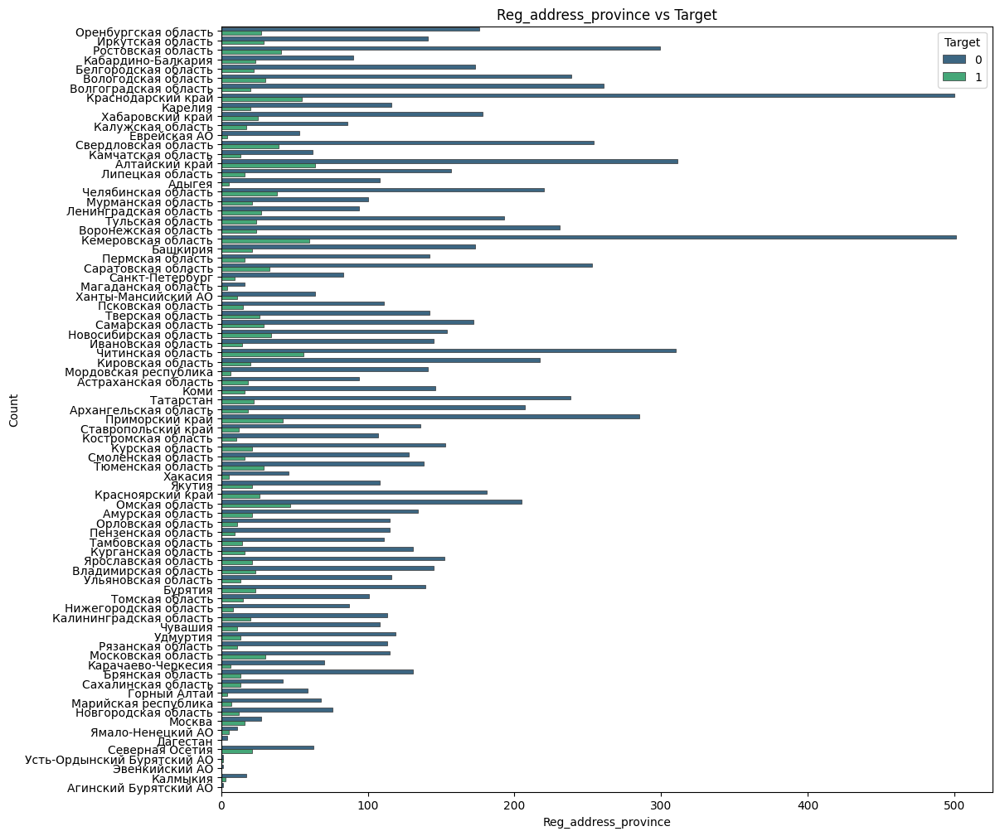

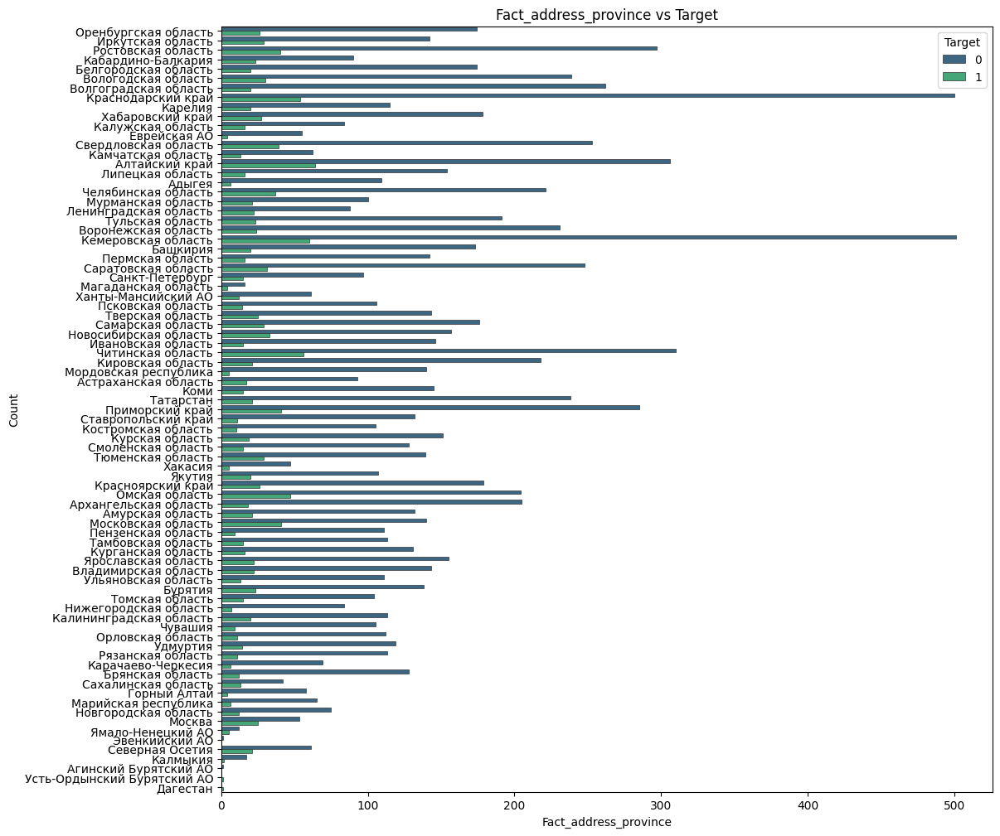

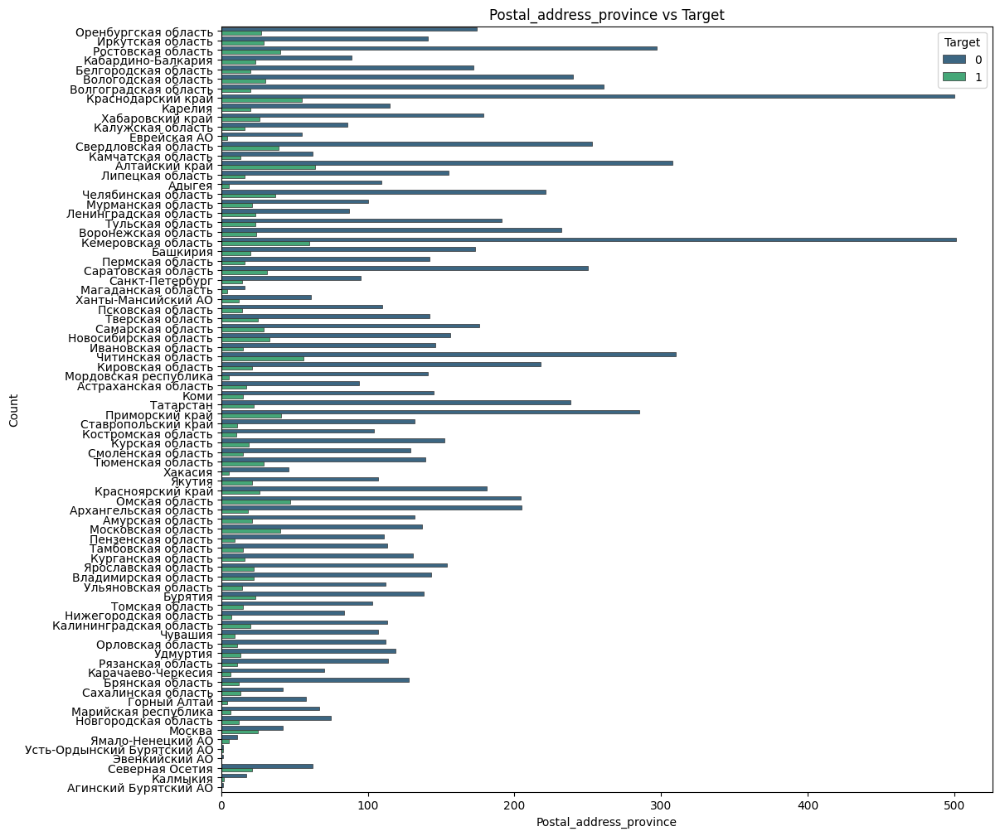

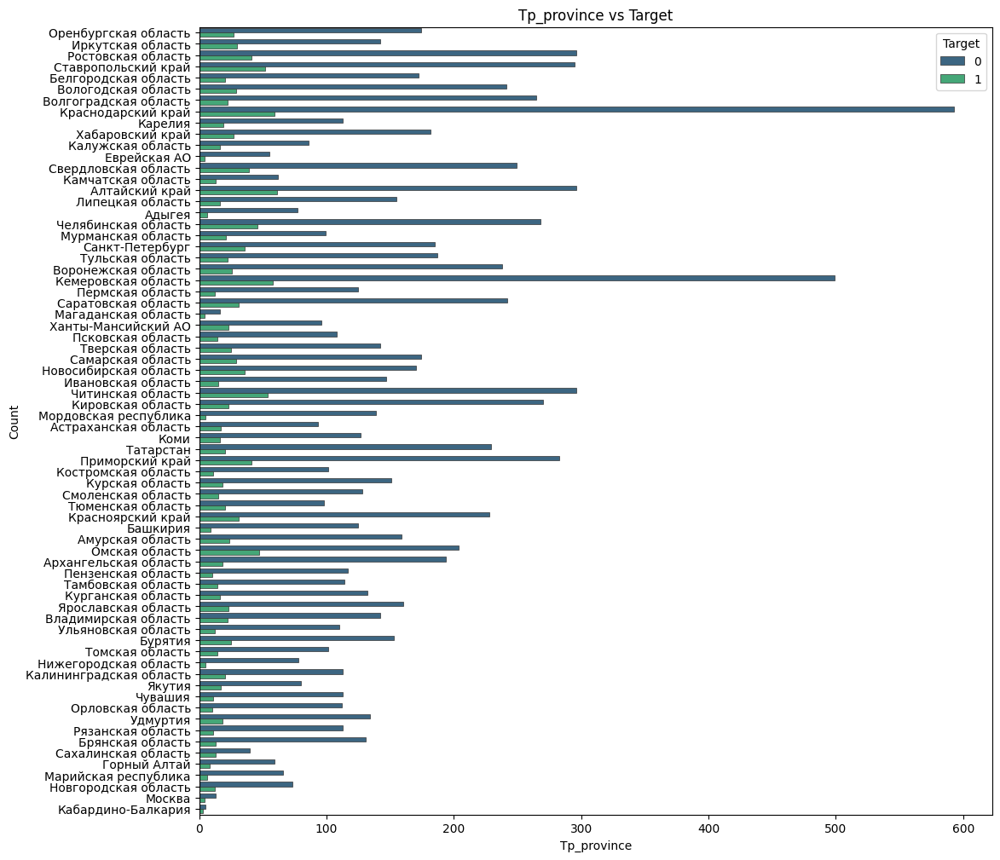

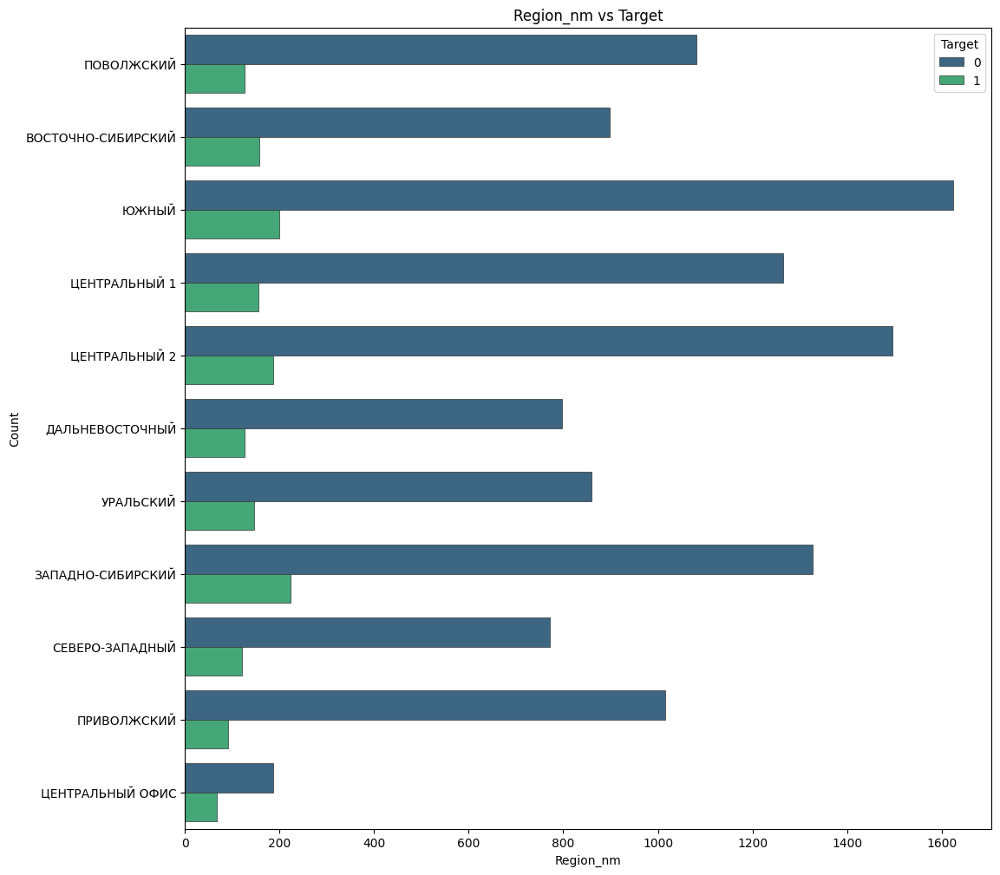

In [ ]:
# Создание поднабора данных для визуализации для абслютных величин
selected_data_cat = df[select_categor_columns + ['target']]

# Построение столбчатых диаграмм для каждого категориального признака
for column in select_categor_columns:
    plt.figure(figsize=(12, 12))
    sns.countplot(y=column, hue='target', data=selected_data_cat, palette='viridis',
                  edgecolor='0.2', linewidth=0.5)
    plt.title(f'{column.capitalize()} vs Target')
    plt.xlabel(column.capitalize())
    plt.ylabel('Count')
    plt.legend(title='Target', loc='upper right')
    plt.show()

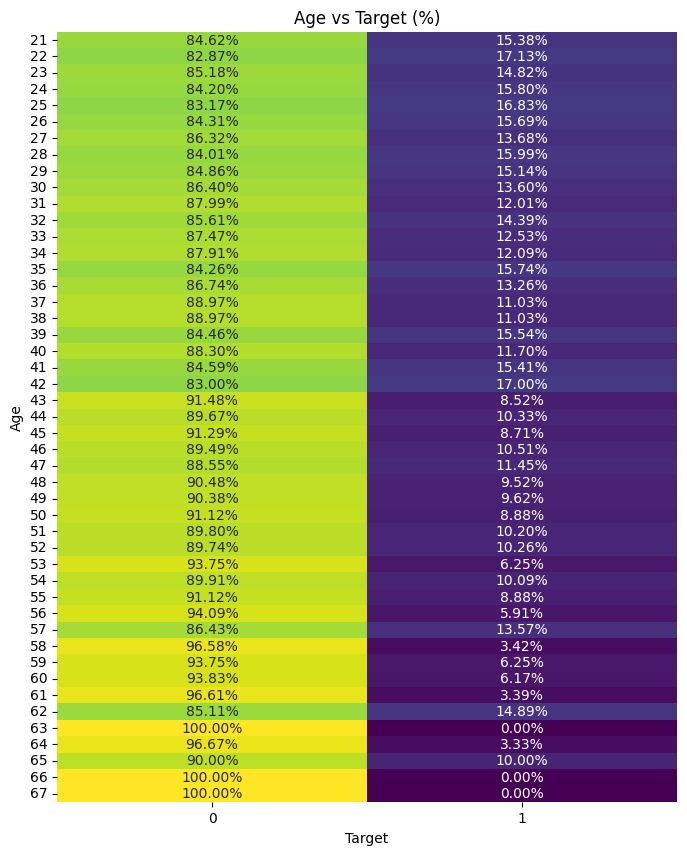

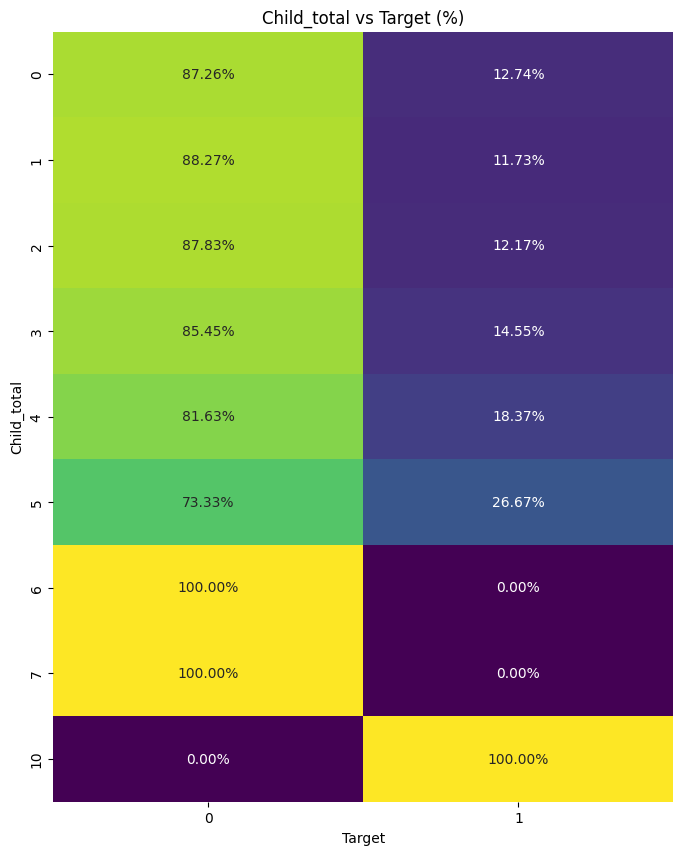

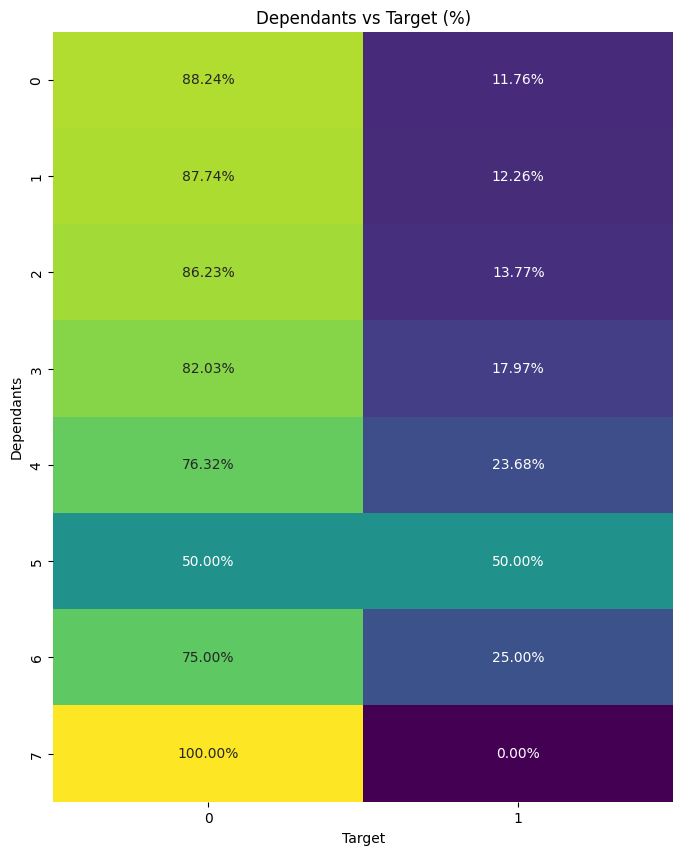

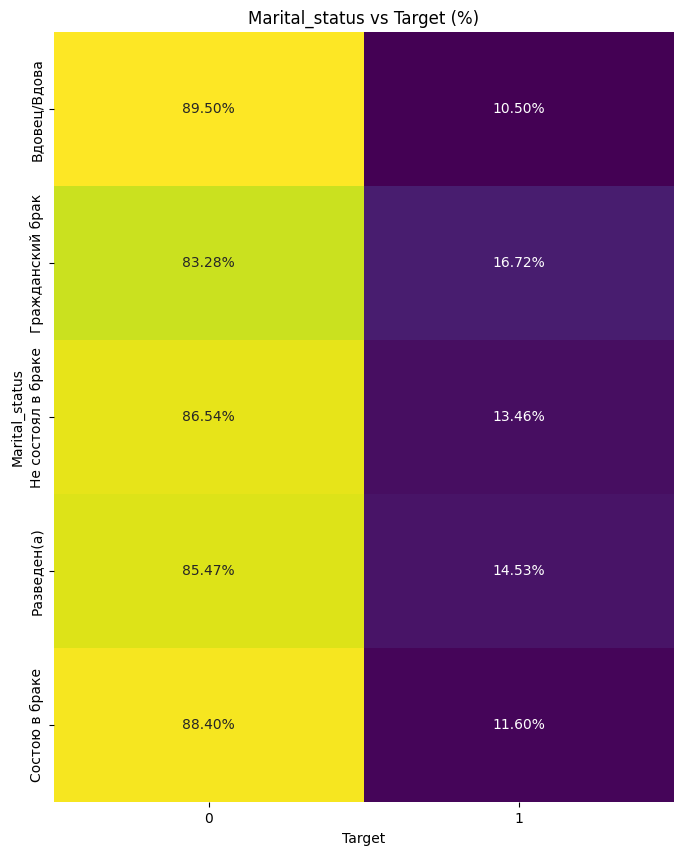

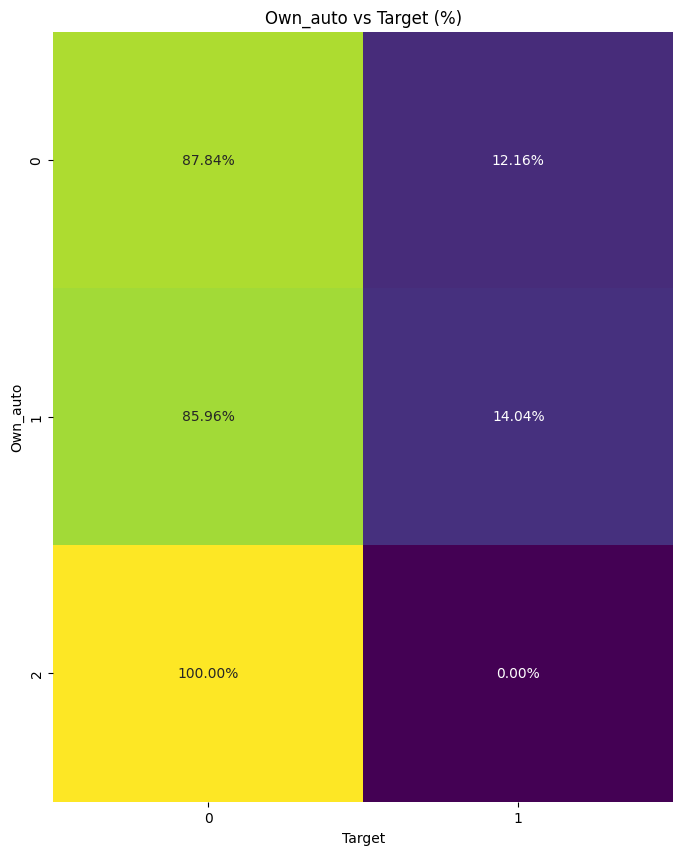

...

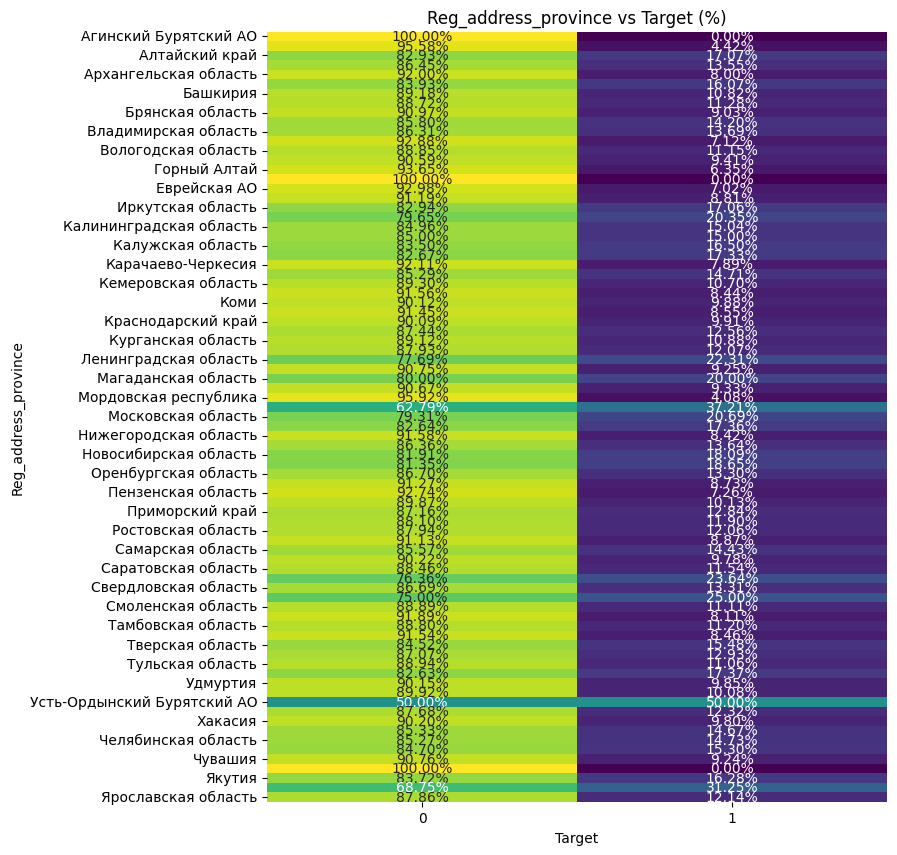

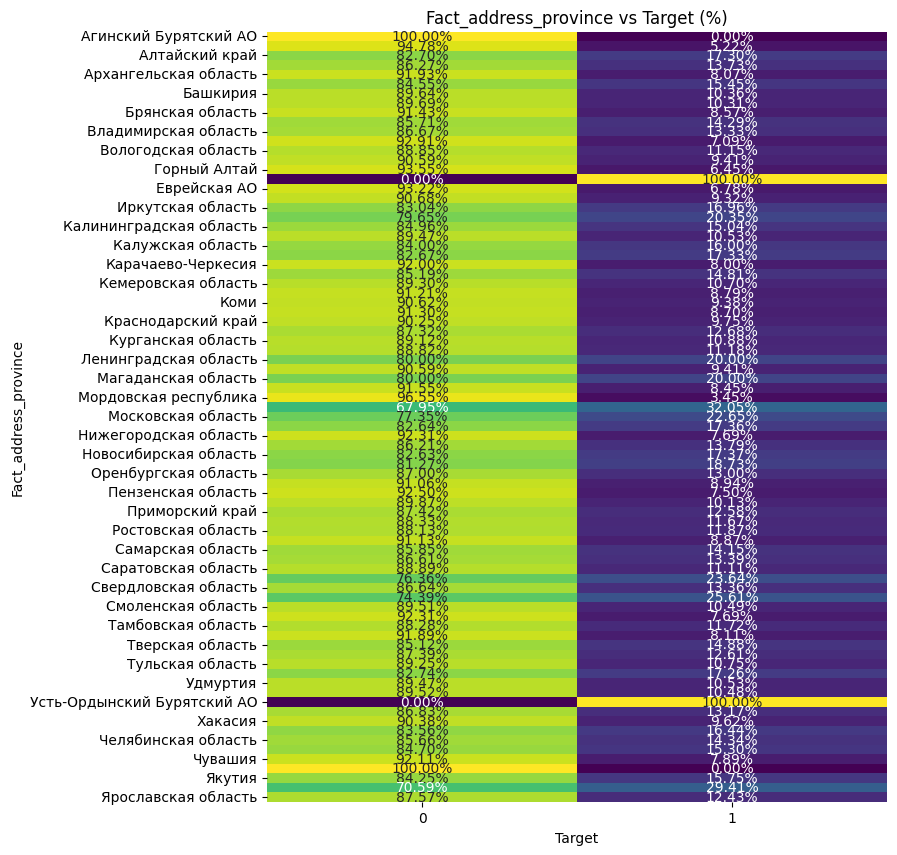

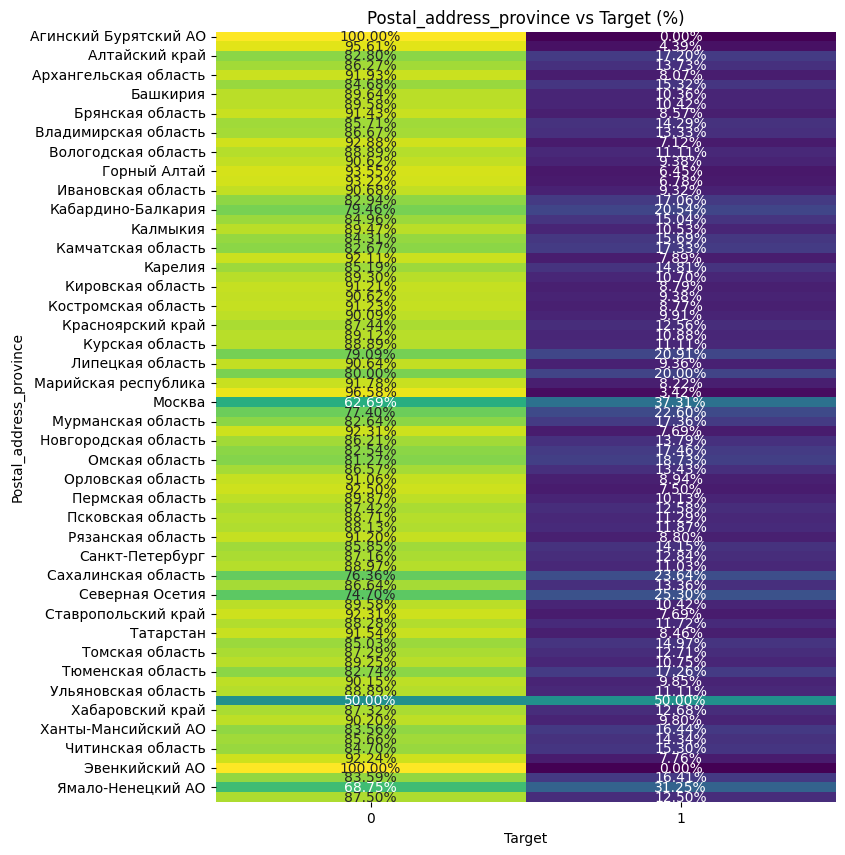

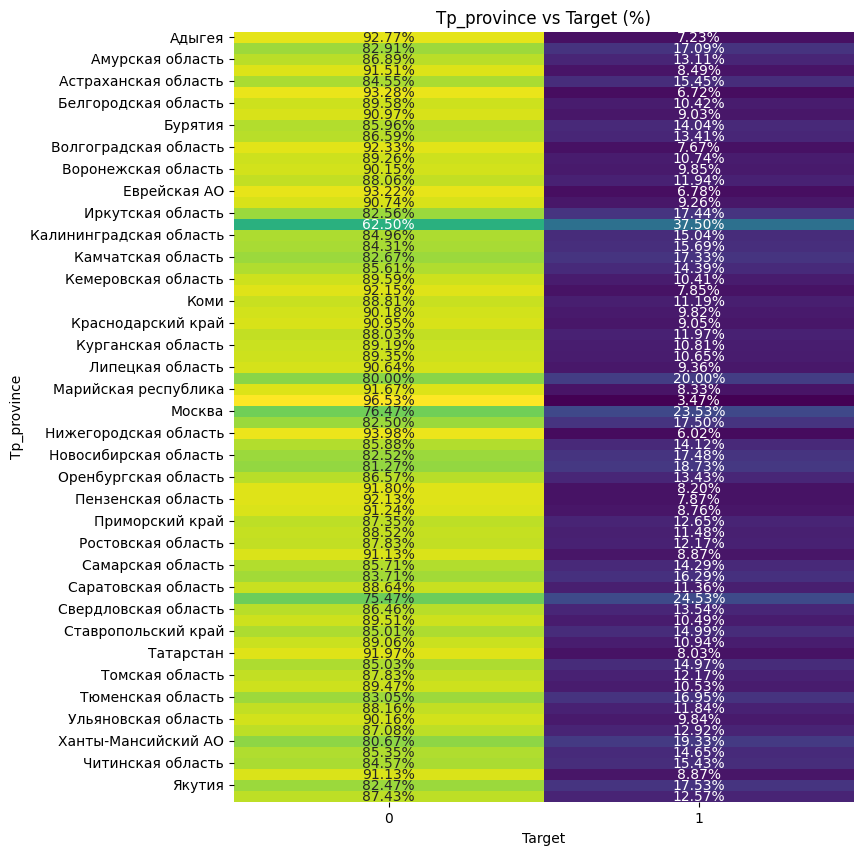

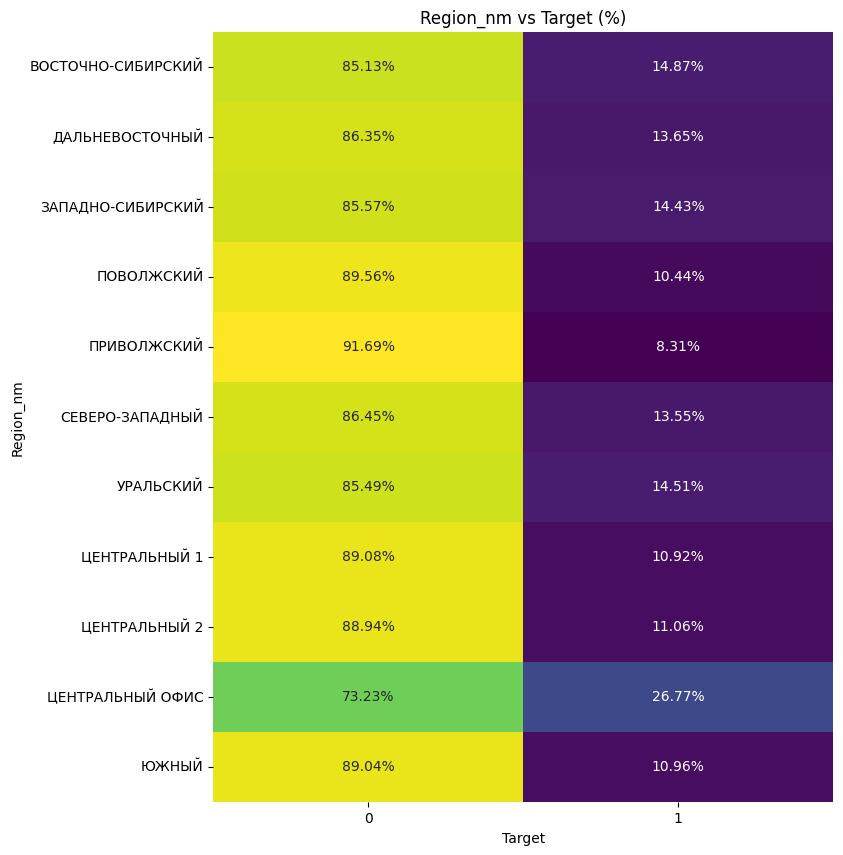

In [ ]:
# создание поднабора данных для визуализации в процентном соотношении (нам просто интересны цифры)
selected_data_cat = df[select_categor_columns + ['target']]

# построение диаграмм в процентном соотношении для каждого категориального признака
for column in select_categor_columns:
    # создание сводной таблицы с процентным соотношением
    cross_tab = pd.crosstab(selected_data_cat[column], selected_data_cat['target'], normalize='index')

    # построение диаграммы в процентном соотношении
    plt.figure(figsize=(8, 10))
    sns.heatmap(cross_tab, annot=True, cmap='viridis', fmt='.2%', cbar=False)
    plt.title(f'{column.capitalize()} vs Target (%)')
    plt.xlabel('Target')
    plt.ylabel(column.capitalize())
    plt.show()

##### 5.4 Заметки для бинарных признаков

Бинарные

|Признак|Расшифровка|
|--:|:--|
| TARGET | целевая переменная:отклик на маркетинговую кампанию (1 - отклик был зарегистрирован, 0 - отклика не было) |
| SOCSTATUS_WORK_FL | социальный статус клиента относительно работы (1 - работает, 0 - не работает)|
| SOCSTATUS_PENS_FL | социальный статус клиента относительно пенсии (1 - пенсионер, 0 - не пенсионер)|
| GENDER | пол клиента |
| MARITAL_STATUS | семейное положение |
| ORG_TP_FCAPITAL | отношение к иностранному капиталу|
| FL_PRESENCE_FL | наличие в собственности квартиры (1 - есть, 0 - нет)|
| AUTO_RUS_FL | наличие в собственности автомобиля российского производства ( 1 - есть, 0 - нет)|
| HS_PRESENCE_FL |  наличие в собственности загородного дома (1 - есть, 0 - нет)|
| COT_PRESENCE_FL | наличие в собственности котеджа (1 - есть, 0 - нет) |
| GAR_PRESENCE_FL | наличие в собственности гаража (1 - есть, 0 - нет)|
| LAND_PRESENCE_FL | наличие в собственности земельного участка (1 - есть, 0 - нет)|


In [ ]:
# создание фильтра для категориальных значений
select_binar_columns = ['target','socstatus_work_fl','socstatus_pens_fl',
                        'gender','org_tp_fcapital','fl_presence_fl',
                        'auto_rus_fl','hs_presence_fl','cot_presence_fl',
                        'gar_presence_fl','land_presence_fl']

In [ ]:
# проверка уникальных значений
for column in select_binar_columns:
    unique_values = df[column].unique()
    print(f"Уникальные значения для {column}: {unique_values}")

Уникальные значения для target: [0 1]
Уникальные значения для socstatus_work_fl: [1 0]
Уникальные значения для socstatus_pens_fl: [0 1]
Уникальные значения для gender: [1 0]
Уникальные значения для org_tp_fcapital: ['Без участия' 'С участием']
Уникальные значения для fl_presence_fl: [0 1]
Уникальные значения для auto_rus_fl: [0 1]
Уникальные значения для hs_presence_fl: [0 1]
Уникальные значения для cot_presence_fl: [0 1]
Уникальные значения для gar_presence_fl: [0 1]
Уникальные значения для land_presence_fl: [0 1]


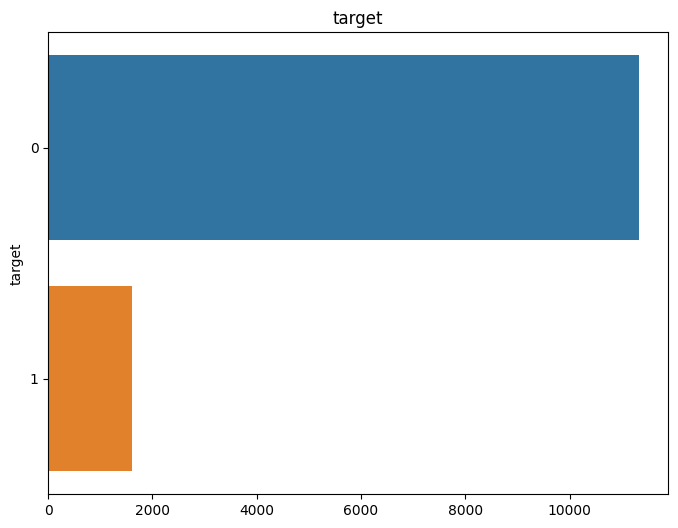

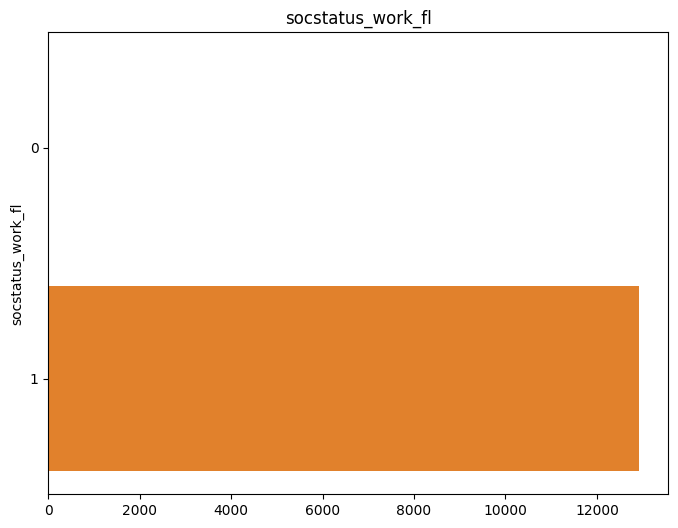

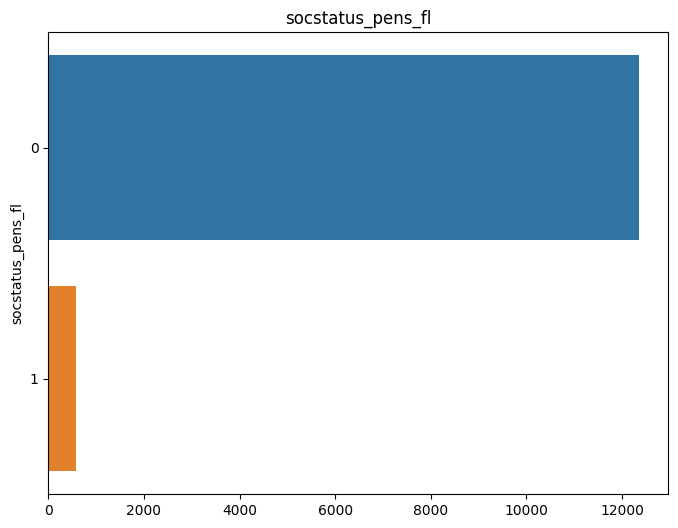

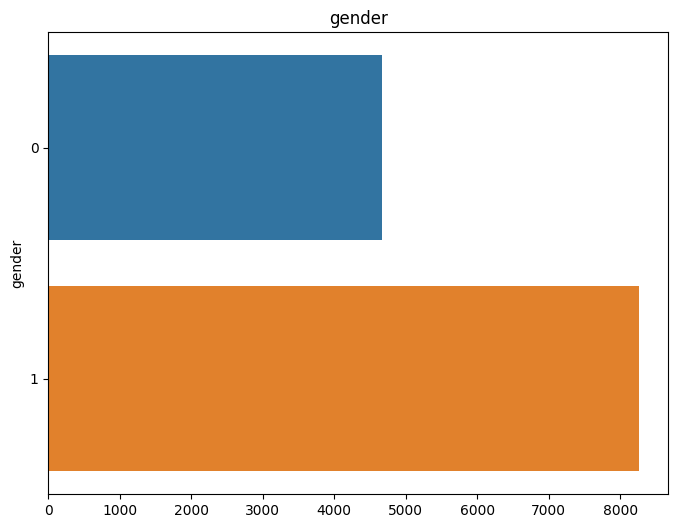

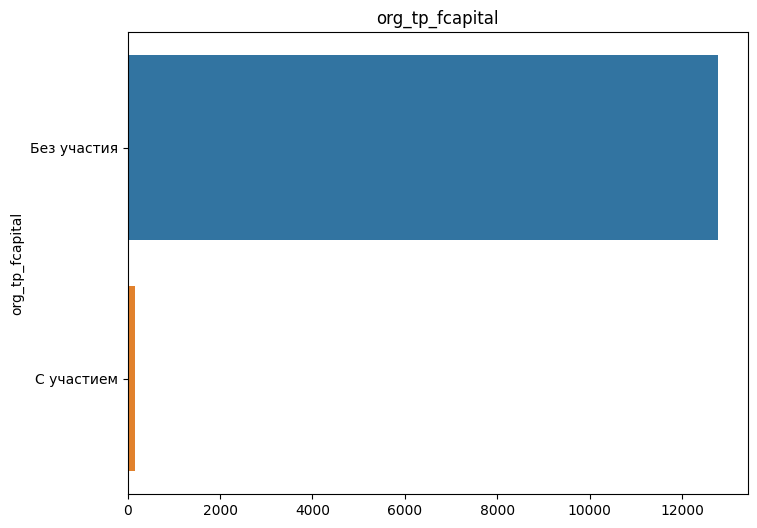

...

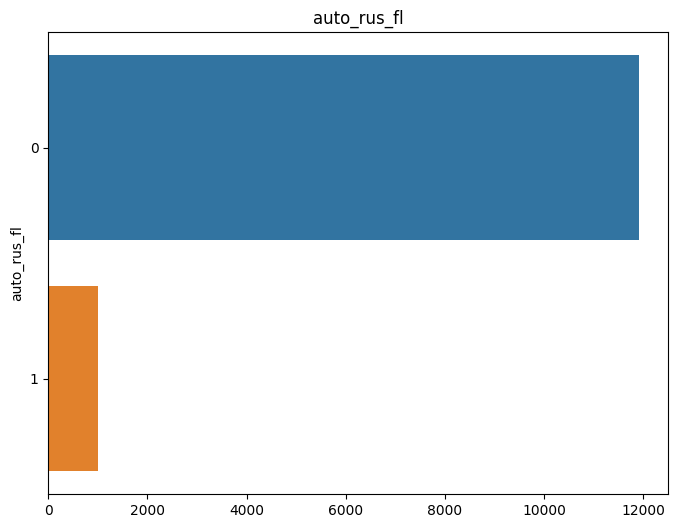

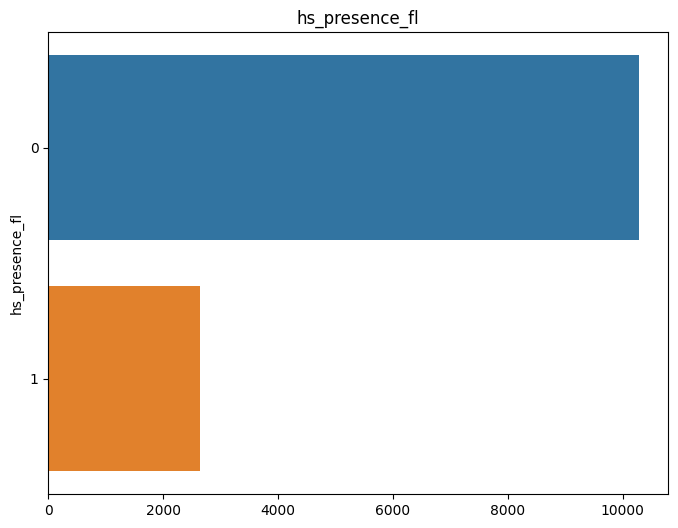

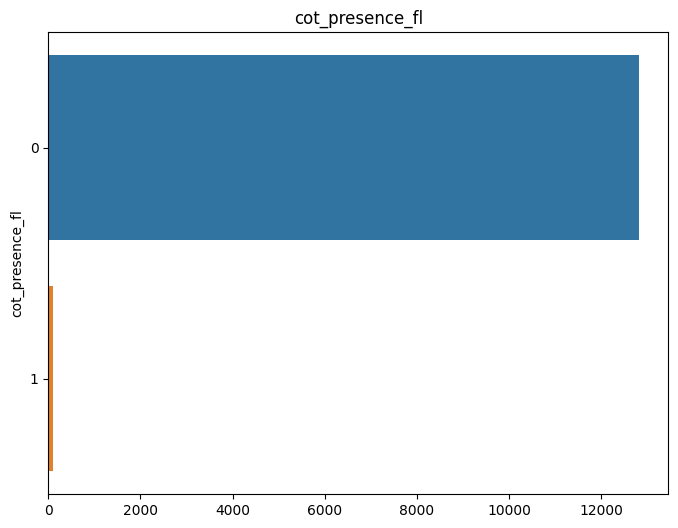

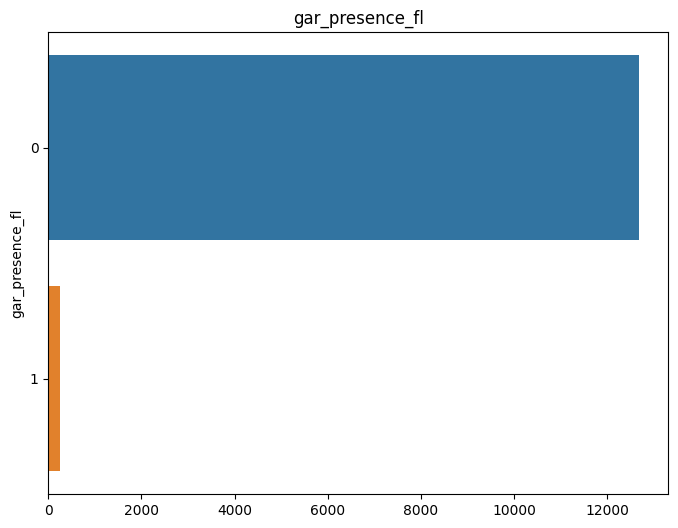

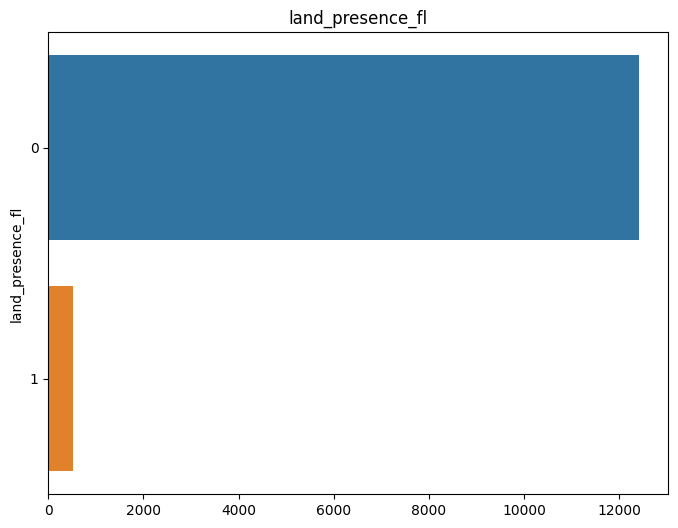

In [ ]:
# создаём отдельные столбчатые диаграммы для каждого бинарного признака
for column in select_binar_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(y=column, data=df)
    plt.title(column)
    plt.xlabel('')
    plt.show()

**Заметки о бинарных признаках:**

<br>

В целом, мы решили ничего не удалять и не править.
<br>
Но мы решили посмотреть эти категории по отношению к `target`

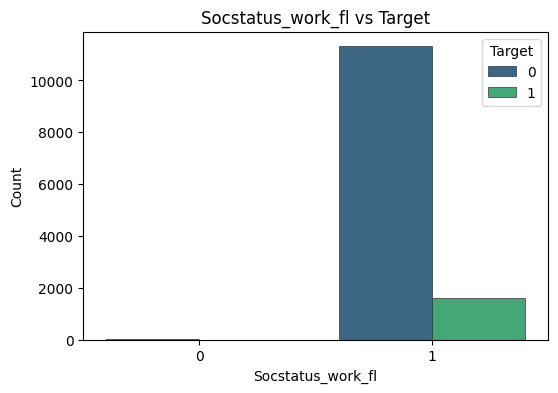

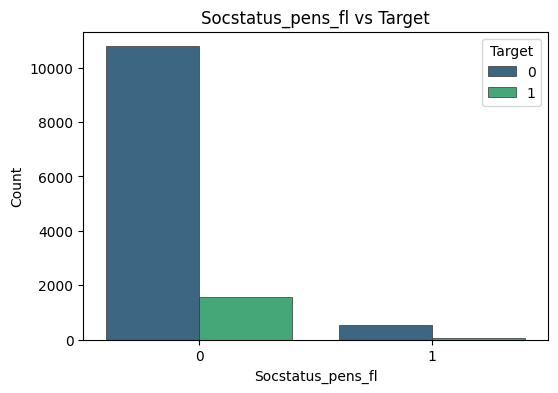

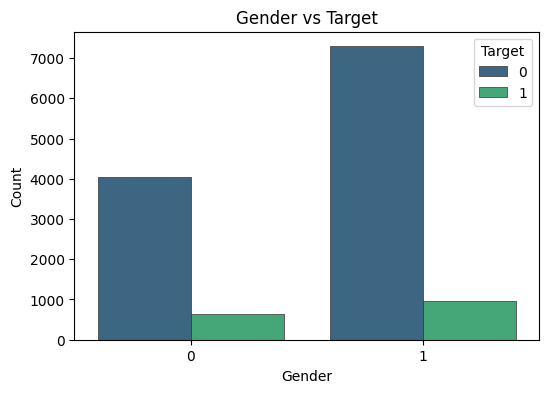

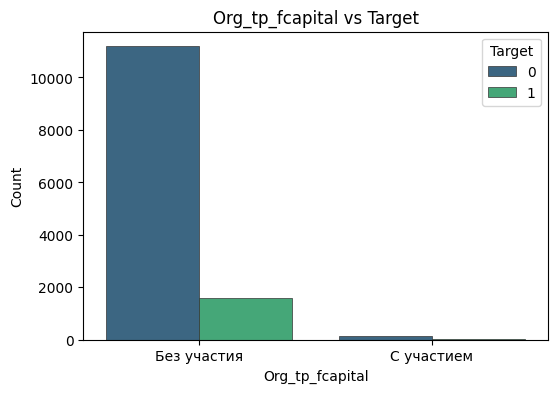

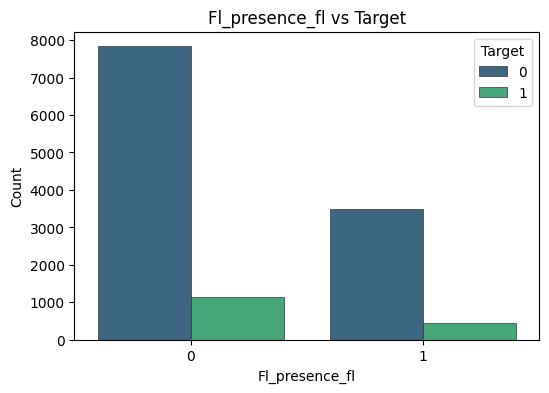

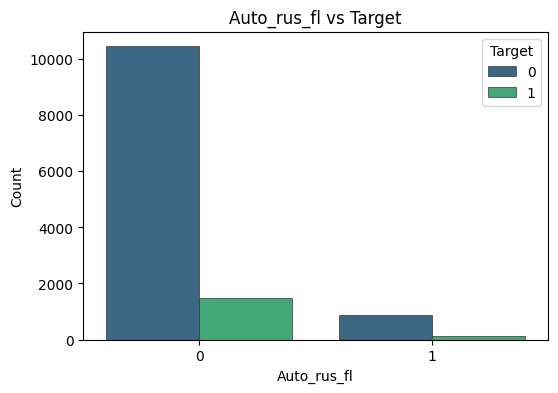

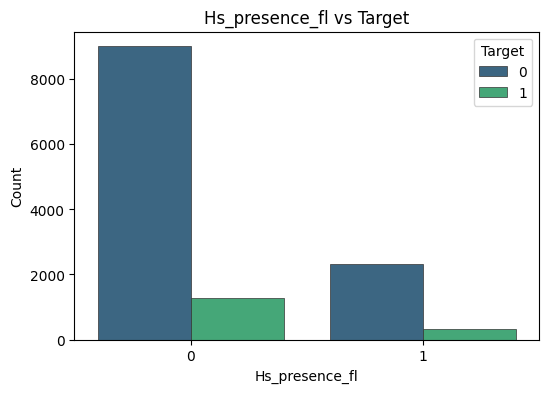

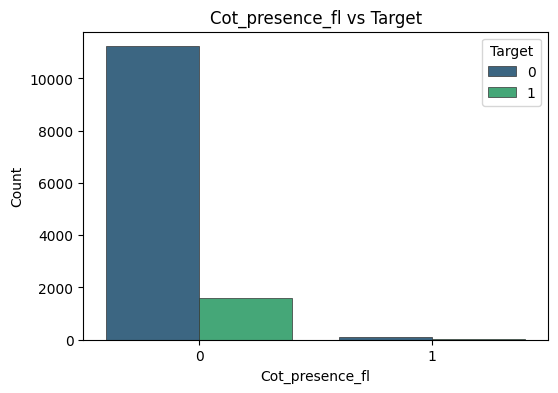

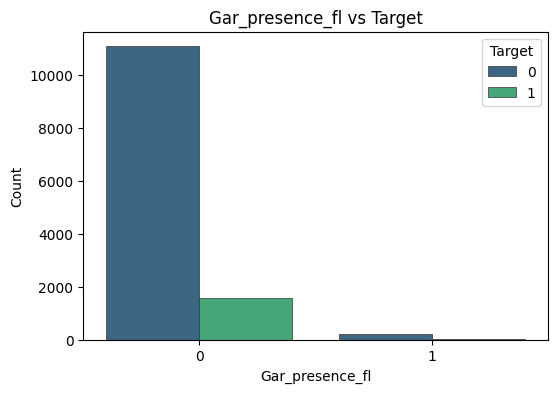

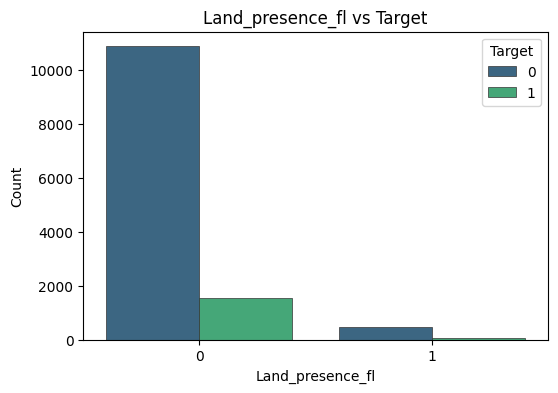

In [ ]:
# создание поднабора данных для визуализации
selected_data_bin = df[select_binar_columns]

# построение столбчатых диаграмм для каждого бинарного признака
for column in select_binar_columns[1:]:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=column, hue='target', data=selected_data_bin, palette='viridis',
                  edgecolor='0.2', linewidth=0.5)
    plt.title(f'{column.capitalize()} vs Target')
    plt.xlabel(column.capitalize())
    plt.ylabel('Count')
    plt.legend(title='Target', loc='upper right')
    plt.show()

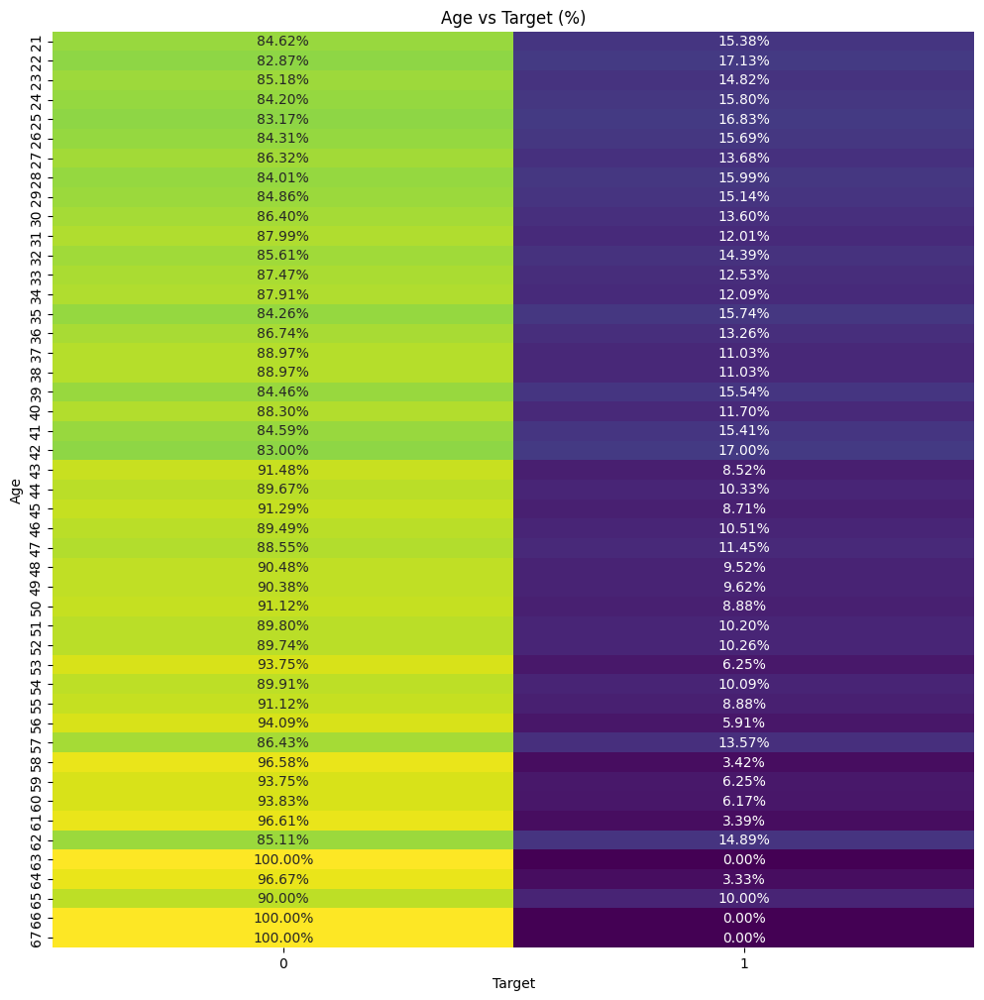

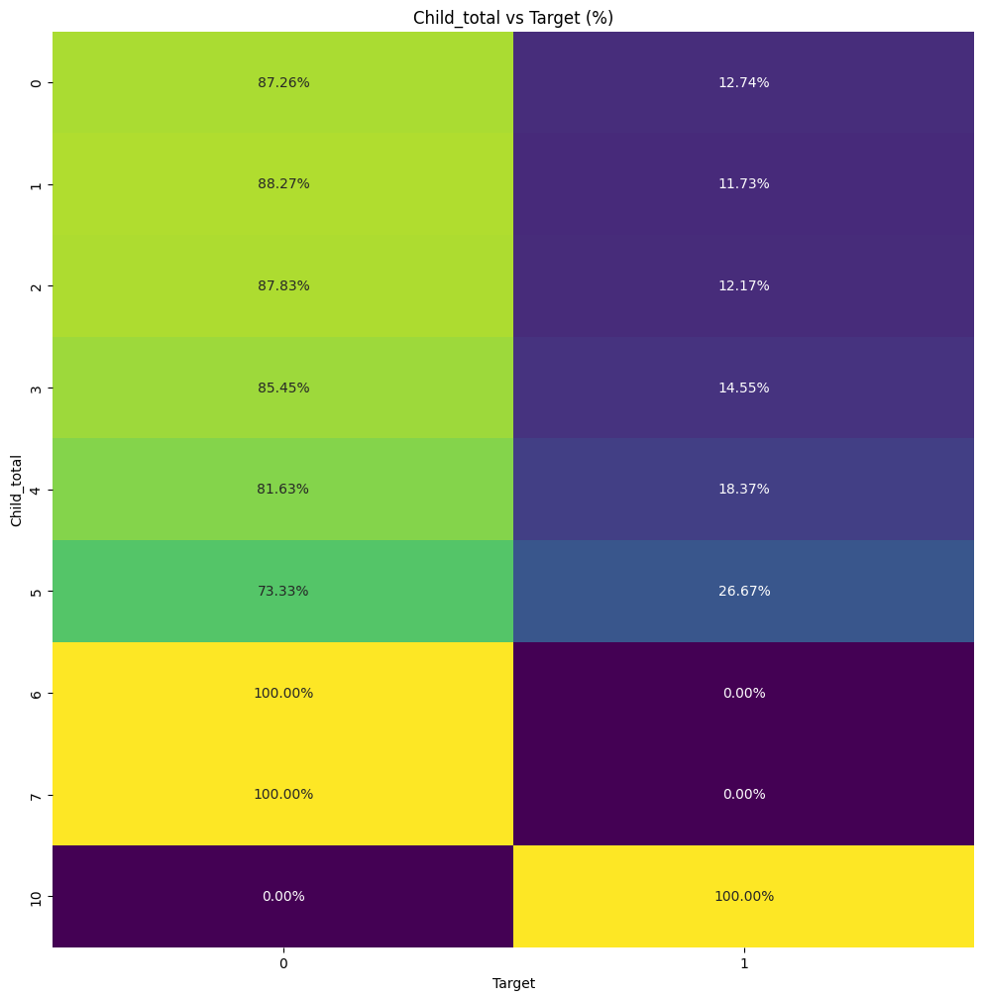

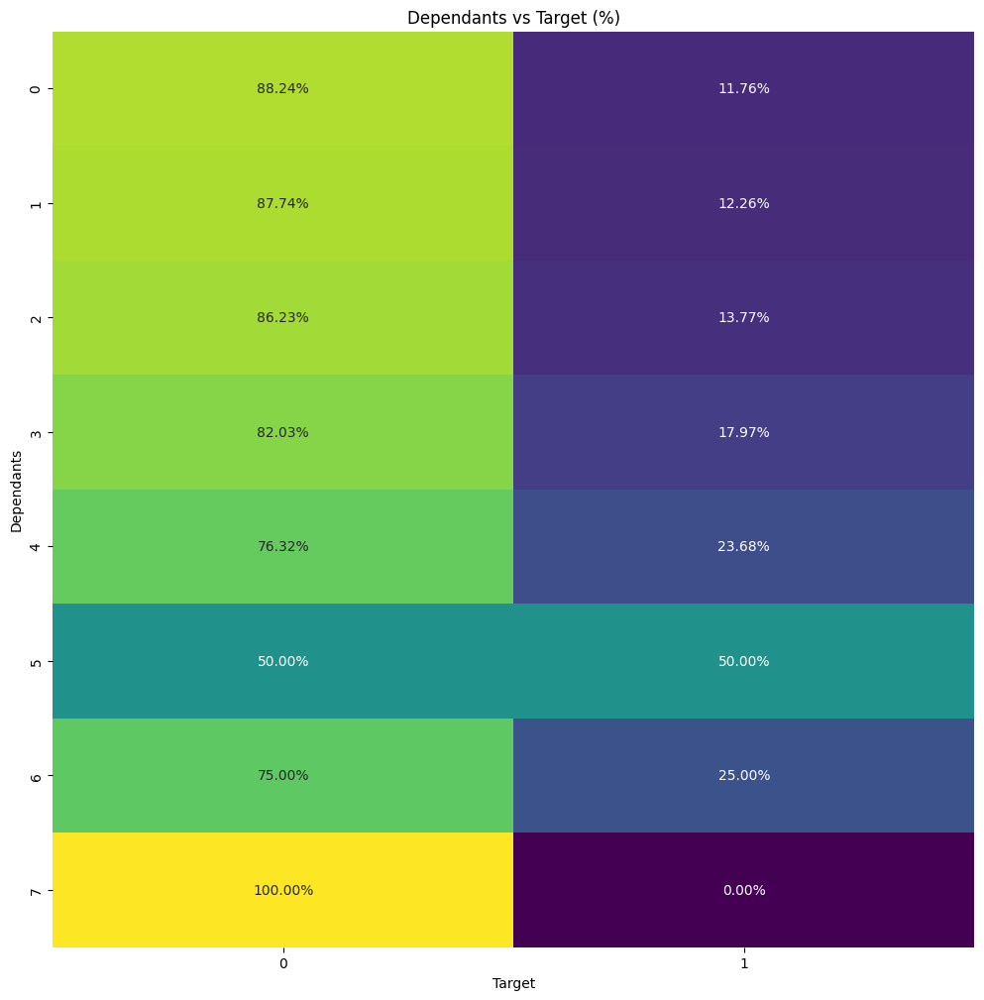

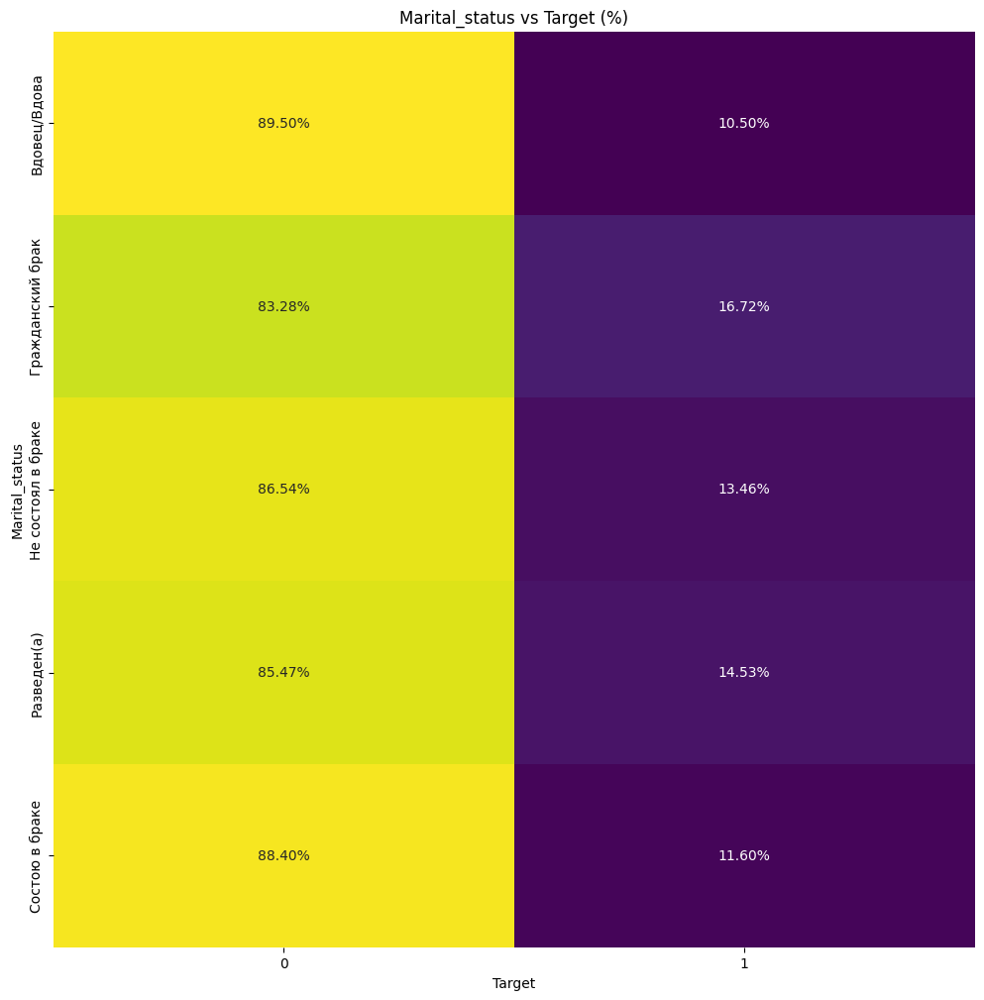

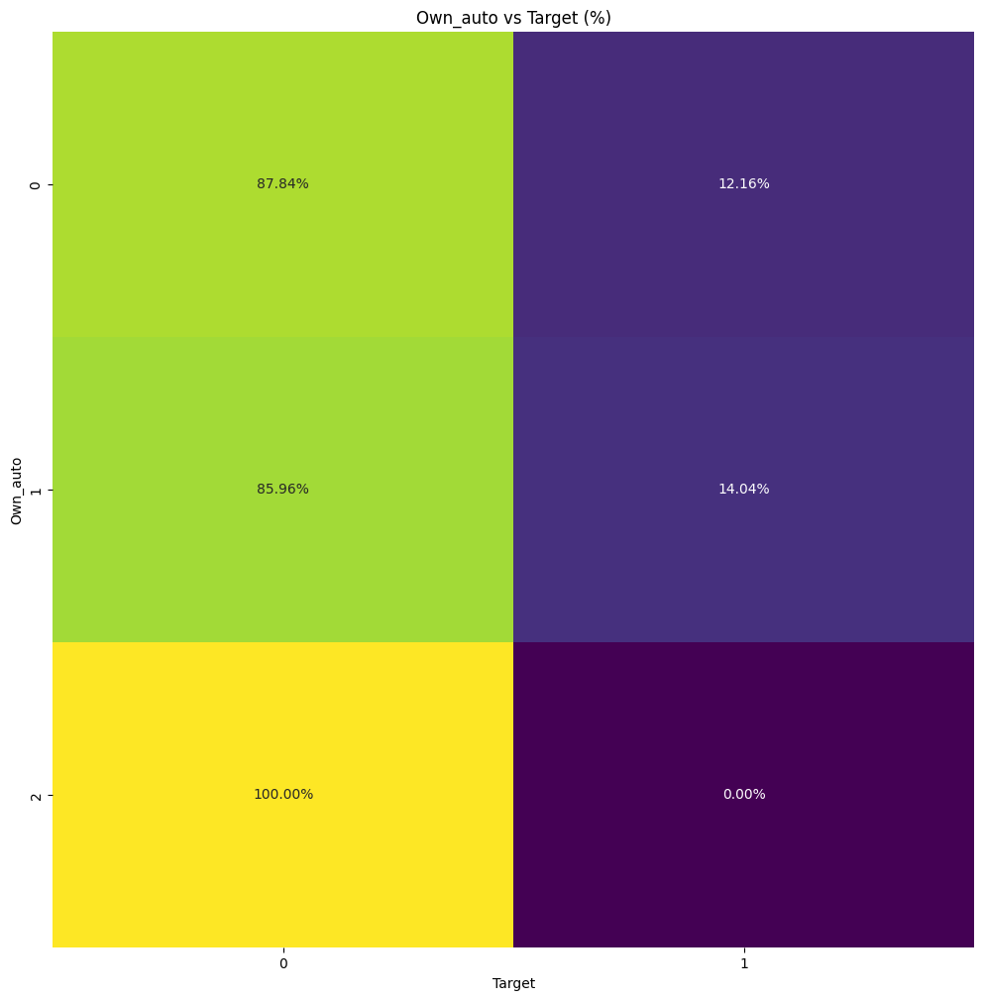

...

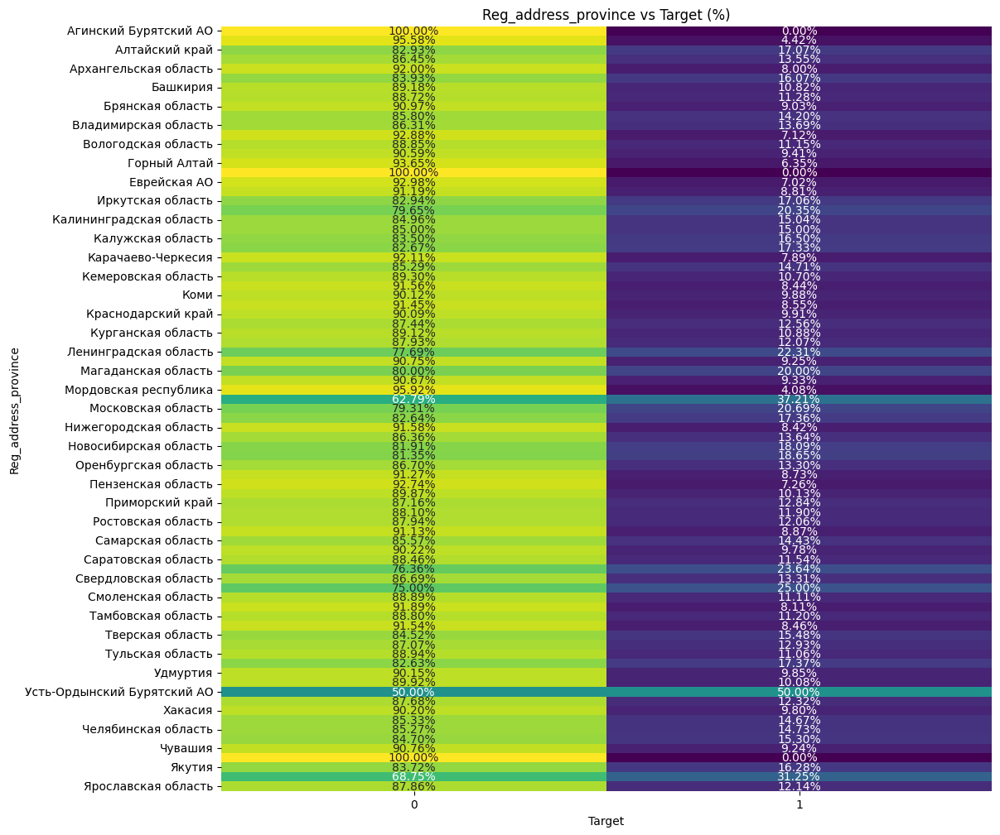

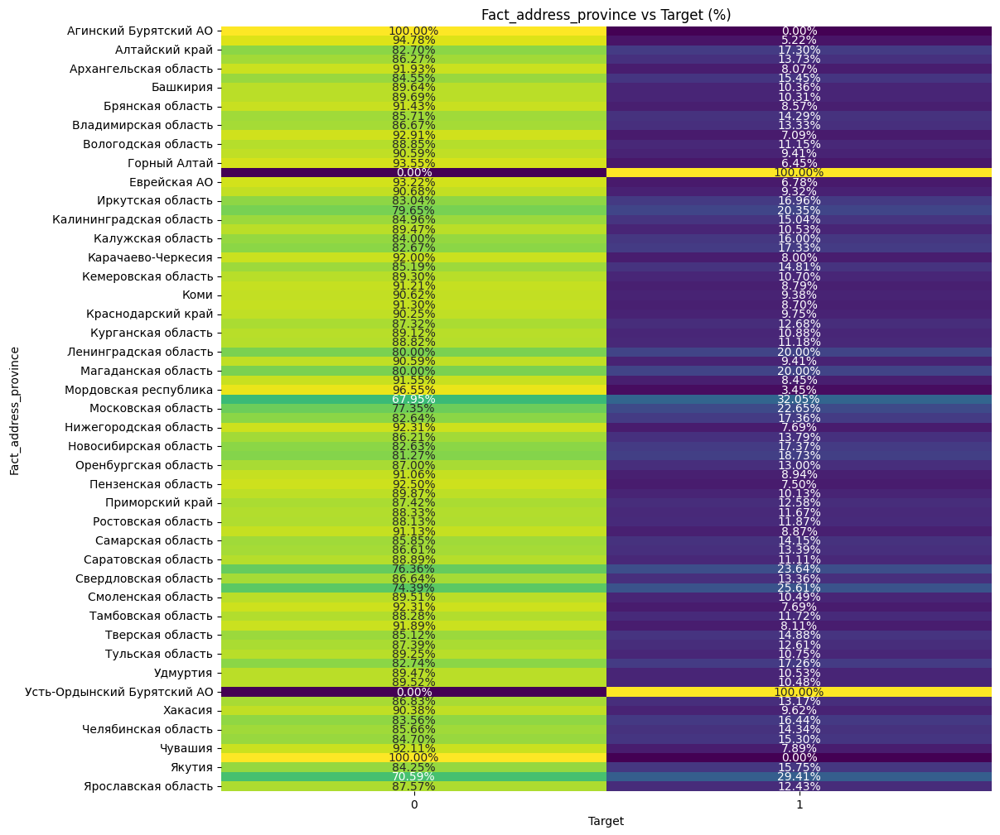

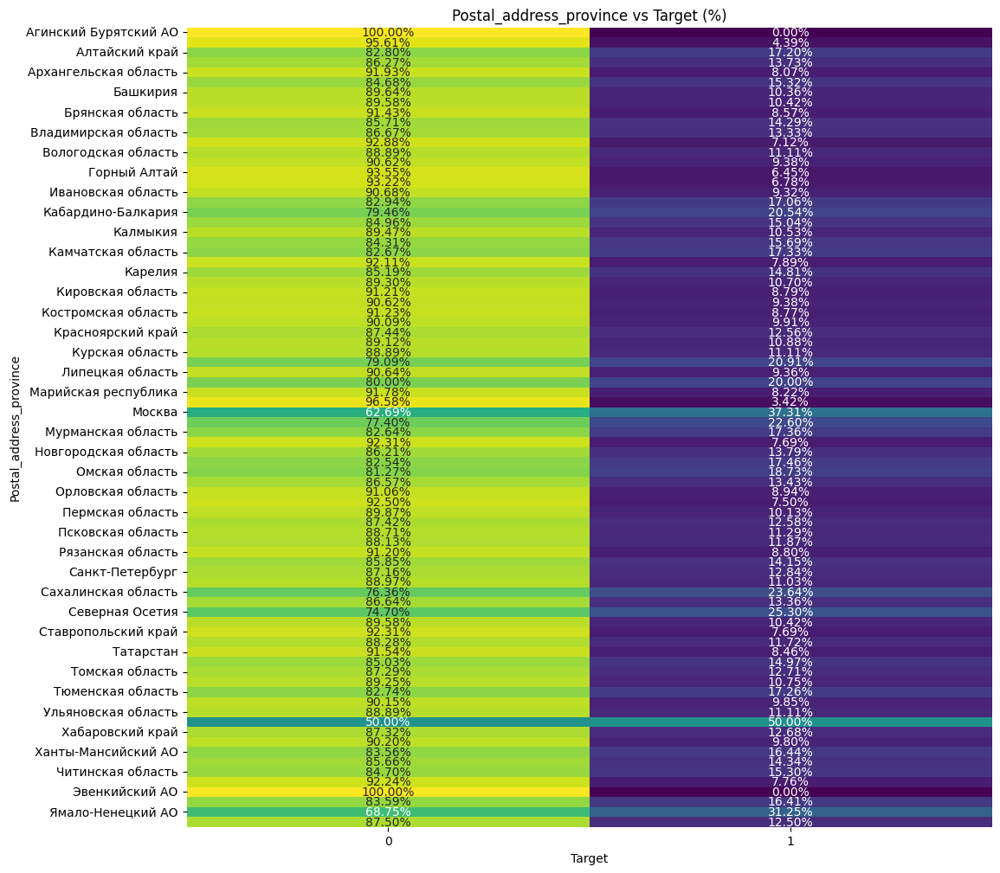

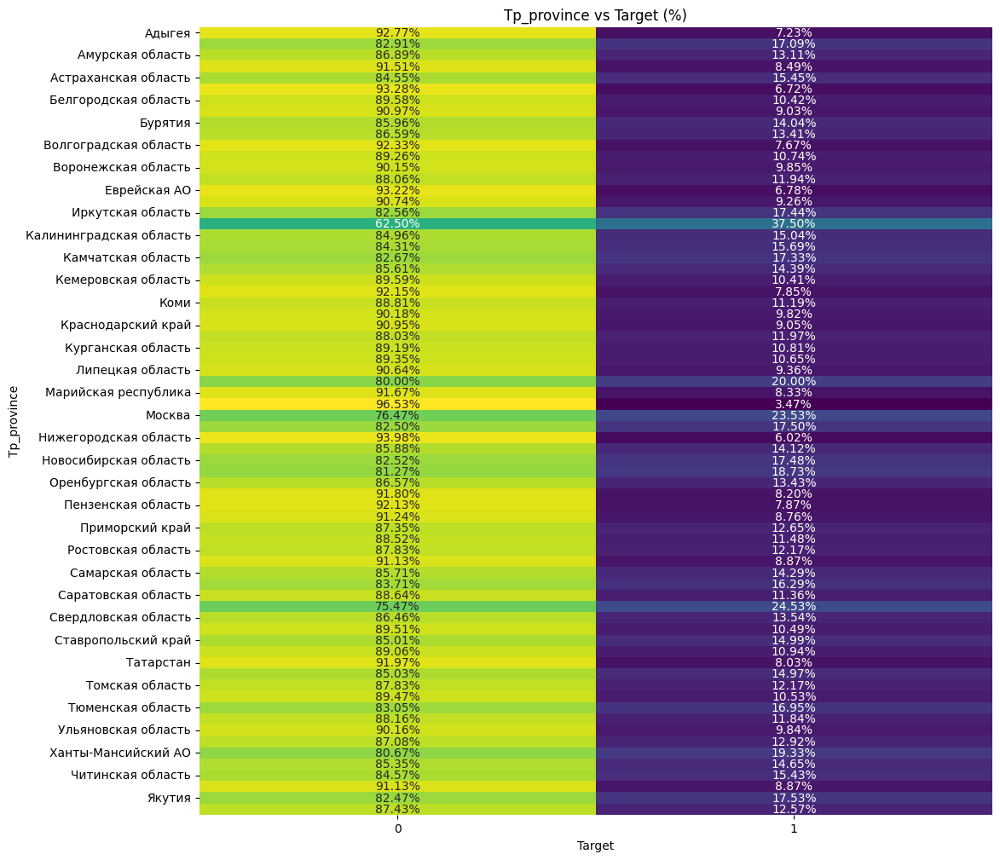

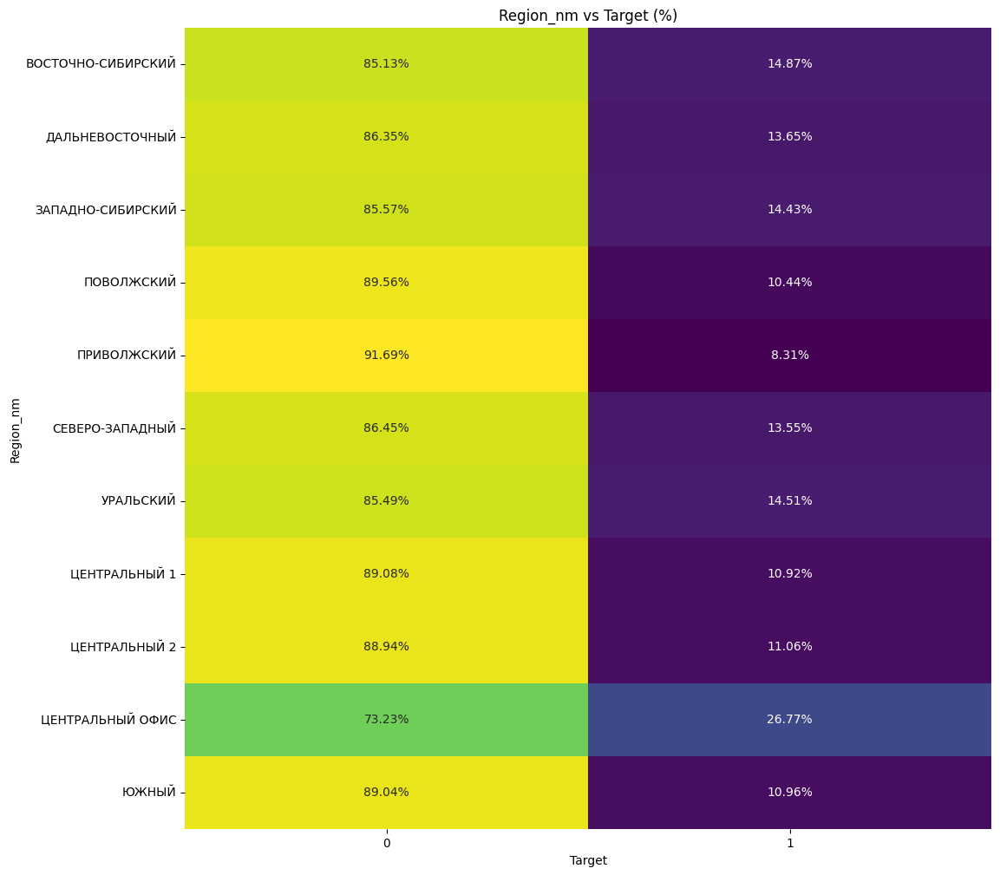

In [ ]:
# создание поднабора данных для визуализации (нам просто интересны цифры)
selected_data_bin = df[select_binar_columns]

# построение диаграмм в процентном соотношении для каждого категориального признака
for column in select_categor_columns:
    # создание сводной таблицы с процентным соотношением
    cross_tab = pd.crosstab(selected_data_cat[column], selected_data_cat['target'], normalize='index')

    # построение диаграммы в процентном соотношении
    plt.figure(figsize=(12, 12))
    sns.heatmap(cross_tab, annot=True, cmap='viridis', fmt='.2%', cbar=False)
    plt.title(f'{column.capitalize()} vs Target (%)')
    plt.xlabel('Target')
    plt.ylabel(column.capitalize())
    plt.show()

#### 6. Обработка пропусков

In [ ]:
# Проверка пропусков в DataFrame
missing_values = df.isnull().sum()

# Вывод количества пропусков по каждому столбцу
print(missing_values)

target                       0
age                          0
socstatus_work_fl            0
socstatus_pens_fl            0
gender                       0
child_total                  0
dependants                   0
education                    0
marital_status               0
gen_industry                 0
gen_title                    0
org_tp_state                 0
org_tp_fcapital              0
job_dir                      0
family_income                0
personal_income              0
reg_address_province         0
fact_address_province        0
postal_address_province      0
tp_province                256
region_nm                    1
fl_presence_fl               0
own_auto                     0
auto_rus_fl                  0
hs_presence_fl               0
cot_presence_fl              0
gar_presence_fl              0
land_presence_fl             0
credit                       0
term                         0
fact_living_term             0
work_time                    0
loan_num

<Axes: >

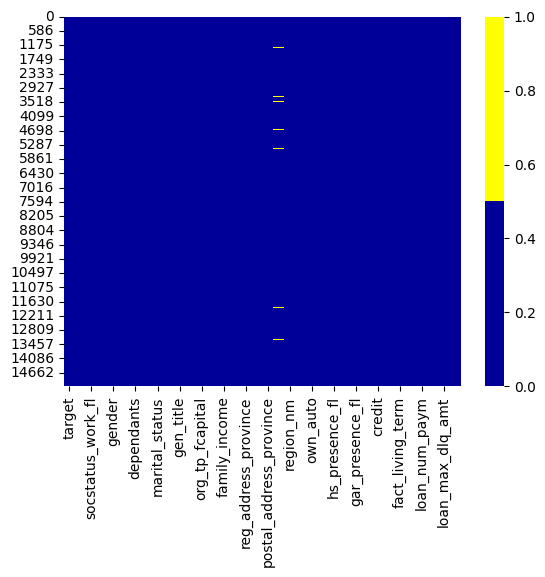

In [ ]:
cols = df.columns # первые 30 колонок
# определяем цвета

# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00']
sns.heatmap(df[cols].isnull(), cmap=sns.color_palette(colours))

In [ ]:
# смотрим процент пропусков
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

target - 0%
age - 0%
socstatus_work_fl - 0%
socstatus_pens_fl - 0%
gender - 0%
child_total - 0%
dependants - 0%
education - 0%
marital_status - 0%
gen_industry - 0%
gen_title - 0%
org_tp_state - 0%
org_tp_fcapital - 0%
job_dir - 0%
family_income - 0%
personal_income - 0%
reg_address_province - 0%
fact_address_province - 0%
postal_address_province - 0%
tp_province - 2%
region_nm - 0%
fl_presence_fl - 0%
own_auto - 0%
auto_rus_fl - 0%
hs_presence_fl - 0%
cot_presence_fl - 0%
gar_presence_fl - 0%
land_presence_fl - 0%
credit - 0%
term - 0%
fact_living_term - 0%
work_time - 0%
loan_num_paym - 0%
loan_dlq_num - 0%
loan_max_dlq_amt - 0%
date_credit - 0%


In [ ]:
# # Перед удалением
# total_rows_before = df.shape[0]
# total_columns = df.shape[1]

# # Удаление строк с пропущенными значениями
# df_cleaned = df.dropna()

# # После удаления
# total_rows_after = df_cleaned.shape[0]

# # Рассчитываем процент потери
# percent_loss = ((total_rows_before - total_rows_after) / total_rows_before) * 100

# print(f"Изначальное количество строк: {total_rows_before}")
# print(f"Количество строк после удаления пропусков: {total_rows_after}")
# print(f"Процент потери данных: {percent_loss:.2f}%")

In [ ]:
# Заполнение пропущенных значений в категориальных признаках модой
# df[select_categor_columns] = df[select_categor_columns].fillna(df[select_categor_columns].mode().iloc[0])

# Заполнение пропущенных значений в числовых признаках средним значением
# df[select_value_columns] = df[select_value_columns].fillna(df[select_value_columns].mean())

# Заполнение пропущенных значений в бинарных признаках модой
# df[select_binar_columns] = df[select_binar_columns].fillna(df[select_binar_columns].mode().iloc[0])

Мы решаем просто удалить строки, так как процент потерь не такой большой

In [ ]:
# Первоначальный процент потерь данных
initial_loss_percentage = (1 - len(df.dropna()) / len(df)) * 100

# Удаление строк с пропущенными значениями
df.dropna(inplace=True)

# Процент потерь данных после удаления
final_loss_percentage = 0

# Вывод результатов
print(f"Исходный процент потерь данных: {initial_loss_percentage:.2f}%")

Исходный процент потерь данных: 1.99%


In [ ]:
# Проверка пропусков в DataFrame
missing_values = df.isnull().sum()

# Вывод количества пропусков по каждому столбцу
print(missing_values)

target                     0
age                        0
socstatus_work_fl          0
socstatus_pens_fl          0
gender                     0
child_total                0
dependants                 0
education                  0
marital_status             0
gen_industry               0
gen_title                  0
org_tp_state               0
org_tp_fcapital            0
job_dir                    0
family_income              0
personal_income            0
reg_address_province       0
fact_address_province      0
postal_address_province    0
tp_province                0
region_nm                  0
fl_presence_fl             0
own_auto                   0
auto_rus_fl                0
hs_presence_fl             0
cot_presence_fl            0
gar_presence_fl            0
land_presence_fl           0
credit                     0
term                       0
fact_living_term           0
work_time                  0
loan_num_paym              0
loan_dlq_num               0
loan_max_dlq_a

### Шаг 3. Добавьте в таблицу следующие признаки:
- день недели, месяц и год взятия кредита;
- адрес регистрации и адрес фактического пребывания клиента совпадают (1 -- совпадает, 0 -- не совпадает);
- адрес фактического пребывания клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);
- адрес регистрации клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);
- почтовый, фактический и адрес регистрации совпадают (1 -- совпадают, 0 -- не совпадают);
- область регистрации, фактического пребывания, почтового адреса и область расположения торговой точки, где клиент брал кредит совпадают (1 -- совпадают, 0 -- не совпадают);

#### 1. день недели, месяц и год взятия кредита;

In [ ]:
# добавим день недели, месяц и год
df['credit_day_of_week'] = df['date_credit'].dt.dayofweek  # 0 - понедельник, 1 - вторник, ..., 6 - воскресенье
df['credit_month'] = df['date_credit'].dt.month
df['credit_year'] = df['date_credit'].dt.year

df.head(5).T

,0,2,3,4,5
target,0,0,0,0,0
age,49,52,39,30,29
socstatus_work_fl,1,1,1,1,1
socstatus_pens_fl,0,0,0,0,0
gender,1,1,1,0,0
child_total,2,4,1,0,0
dependants,1,0,1,0,0
education,Среднее специальное,Неполное среднее,Высшее,Среднее,Среднее
marital_status,Состою в браке,Состою в браке,Состою в браке,Состою в браке,Гражданский брак
gen_industry,Торговля,Информационные технологии,Образование,Государственная служба,Торговля


#### 2. адрес регистрации и адрес фактического пребывания клиента совпадают (1 -- совпадает, 0 -- не совпадает);

In [ ]:
# приводим к общему стандарту reg_address_province - адресс регистрации
df['reg_address_province'] = df['reg_address_province'].str.lower()
df['reg_address_province'] = df['reg_address_province'].str.strip()
df['reg_address_province'] = df['reg_address_province'].str.replace('\\.', '')
df['reg_address_province'] = df['reg_address_province'].str.replace('\\bstreet\\b', 'st')
df['reg_address_province'] = df['reg_address_province'].str.replace('\\bapartment\\b', 'apt')
df['reg_address_province'] = df['reg_address_province'].str.replace('\\bav\\b', 'ave')

<ipython-input-121-17fccce56edb>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df['reg_address_province'] = df['reg_address_province'].str.replace('\\.', '')
<ipython-input-121-17fccce56edb>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['reg_address_province'] = df['reg_address_province'].str.replace('\\bstreet\\b', 'st')
<ipython-input-121-17fccce56edb>:6: FutureWarning: The default value of regex will change from True to False in a future version.
  df['reg_address_province'] = df['reg_address_province'].str.replace('\\bapartment\\b', 'apt')
<ipython-input-121-17fccce56edb>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  df['reg_address_province'] = df['reg_address_province'].str.replace('\\bav\\b', 'ave')


In [ ]:
# приводим к общему стандарту fact_address_province - адресс фактического пребывания
df['fact_address_province'] = df['fact_address_province'].str.lower()
df['fact_address_province'] = df['fact_address_province'].str.strip()
df['fact_address_province'] = df['fact_address_province'].str.replace('\\.', '')
df['fact_address_province'] = df['fact_address_province'].str.replace('\\bstreet\\b', 'st')
df['fact_address_province'] = df['fact_address_province'].str.replace('\\bapartment\\b', 'apt')
df['fact_address_province'] = df['fact_address_province'].str.replace('\\bav\\b', 'ave')

<ipython-input-122-14c043c96844>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df['fact_address_province'] = df['fact_address_province'].str.replace('\\.', '')
<ipython-input-122-14c043c96844>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['fact_address_province'] = df['fact_address_province'].str.replace('\\bstreet\\b', 'st')
<ipython-input-122-14c043c96844>:6: FutureWarning: The default value of regex will change from True to False in a future version.
  df['fact_address_province'] = df['fact_address_province'].str.replace('\\bapartment\\b', 'apt')
<ipython-input-122-14c043c96844>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  df['fact_address_province'] = df['fact_address_province'].str.replace('\\bav\\b', 'ave')


In [ ]:
# приводим к общему стандарту postal_address_province - почтовый адресс
df['postal_address_province'] = df['postal_address_province'].str.lower()
df['postal_address_province'] = df['postal_address_province'].str.strip()
df['postal_address_province'] = df['postal_address_province'].str.replace('\\.', '')
df['postal_address_province'] = df['postal_address_province'].str.replace('\\bstreet\\b', 'st')
df['postal_address_province'] = df['postal_address_province'].str.replace('\\bapartment\\b', 'apt')
df['postal_address_province'] = df['postal_address_province'].str.replace('\\bav\\b', 'ave')

<ipython-input-123-71aae20740ad>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df['postal_address_province'] = df['postal_address_province'].str.replace('\\.', '')
<ipython-input-123-71aae20740ad>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['postal_address_province'] = df['postal_address_province'].str.replace('\\bstreet\\b', 'st')
<ipython-input-123-71aae20740ad>:6: FutureWarning: The default value of regex will change from True to False in a future version.
  df['postal_address_province'] = df['postal_address_province'].str.replace('\\bapartment\\b', 'apt')
<ipython-input-123-71aae20740ad>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  df['postal_address_province'] = df['postal_address_province'].str.replace('\\bav\\b', 'ave')


In [ ]:
# приводим к общему стандарту postal_address_province - область торговой точки, где клиент брал последний кредит
df['tp_province'] = df['tp_province'].str.lower()
df['tp_province'] = df['tp_province'].str.strip()
df['tp_province'] = df['tp_province'].str.replace('\\.', '')
df['tp_province'] = df['tp_province'].str.replace('\\bstreet\\b', 'st')
df['tp_province'] = df['tp_province'].str.replace('\\bapartment\\b', 'apt')
df['tp_province'] = df['tp_province'].str.replace('\\bav\\b', 'ave')

<ipython-input-124-847f67dd2969>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df['tp_province'] = df['tp_province'].str.replace('\\.', '')
<ipython-input-124-847f67dd2969>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['tp_province'] = df['tp_province'].str.replace('\\bstreet\\b', 'st')
<ipython-input-124-847f67dd2969>:6: FutureWarning: The default value of regex will change from True to False in a future version.
  df['tp_province'] = df['tp_province'].str.replace('\\bapartment\\b', 'apt')
<ipython-input-124-847f67dd2969>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  df['tp_province'] = df['tp_province'].str.replace('\\bav\\b', 'ave')


In [ ]:
# добавляем новый столбец add_addresses_reg_fact
df['add_addresses_reg_fact'] = (df['reg_address_province'] == df['fact_address_province']).astype(int)

#### 3. адрес фактического пребывания клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);

In [ ]:
# добавляем новый столбец add_address_fact_postal
df['add_address_fact_postal'] = (df['fact_address_province'] == df['postal_address_province']).astype(int)

#### 4. адрес регистрации клиента и его почтовый адрес совпадают(1 -- совпадает, 0 -- не совпадает);

In [ ]:
# добавляем новый столбец add_address_reg_postal
df['add_address_reg_postal'] = (df['reg_address_province'] == df['postal_address_province']).astype(int)

#### 5. почтовый, фактический и адрес регистрации совпадают (1 -- совпадают, 0 -- не совпадают);

In [ ]:
# добавляем новый столбец add_adress_postal_fact_province
df['add_adress_postal_fact_province'] = (
    (df['reg_address_province'] == df['fact_address_province']) &
    (df['reg_address_province'] == df['postal_address_province']) &
    (df['fact_address_province'] == df['postal_address_province'])).astype(int)

#### 6. область регистрации, фактического пребывания, почтового адреса и область расположения торговой точки, где клиент брал кредит совпадают (1 -- совпадают, 0 -- не совпадают);

In [ ]:
# добавляем новый столбец add_adress_province_fact_postal_tp
df['add_adress_province_fact_postal_tp'] = (
    (df['reg_address_province'] == df['fact_address_province']) &
    (df['reg_address_province'] == df['postal_address_province']) &
    (df['reg_address_province'] == df['tp_province']) &
    (df['fact_address_province'] == df['postal_address_province'])).astype(int)

In [ ]:
# проверка наших данных
df.head(5).T

,0,2,3,4,5
target,0,0,0,0,0
age,49,52,39,30,29
socstatus_work_fl,1,1,1,1,1
socstatus_pens_fl,0,0,0,0,0
gender,1,1,1,0,0
child_total,2,4,1,0,0
dependants,1,0,1,0,0
education,Среднее специальное,Неполное среднее,Высшее,Среднее,Среднее
marital_status,Состою в браке,Состою в браке,Состою в браке,Состою в браке,Гражданский брак
gen_industry,Торговля,Информационные технологии,Образование,Государственная служба,Торговля


### Шаг 4. Провести исследовательский анализ данных:

- исследовать динамику количества кредитов по годам, месяцам;
- исследовать числовые и категориальные признаки в разрезе целевого признака;
- сделать выводы о влиянии признаков на целевой признак.

#### 1. исследовать динамику количества кредитов по годам, месяцам;

##### динамика по годам

In [ ]:
# посмотрим сколько у нас есть уникальных значений с помощью value.counts()
years = df.credit_year.value_counts()
print(years)

2017    1887
2021    1866
2016    1833
2020    1817
2019    1773
2018    1758
2015    1733
Name: credit_year, dtype: int64


In [ ]:
years_dict = sorted(dict(years).items())
print(years_dict)

# dict(years) - Преобразует объект years (результат метода value_counts()) в словарь, где ключами являются уникальные значения из столбца "credit_year", а значениями - количество раз, которое каждое уникальное значение встречается в столбце.
# items() - Возвращает список кортежей, где каждый кортеж содержит ключ и значение из словаря. В данном случае, каждый кортеж будет содержать уникальное значение из столбца "credit_year" и количество раз, которое это значение встречается.
# sorted() - Сортирует список кортежей в порядке возрастания. По умолчанию, сортировка происходит по первому элементу кортежа, то есть по уникальным значениям из столбца "credit_year".

[(2015, 1733), (2016, 1833), (2017, 1887), (2018, 1758), (2019, 1773), (2020, 1817), (2021, 1866)]


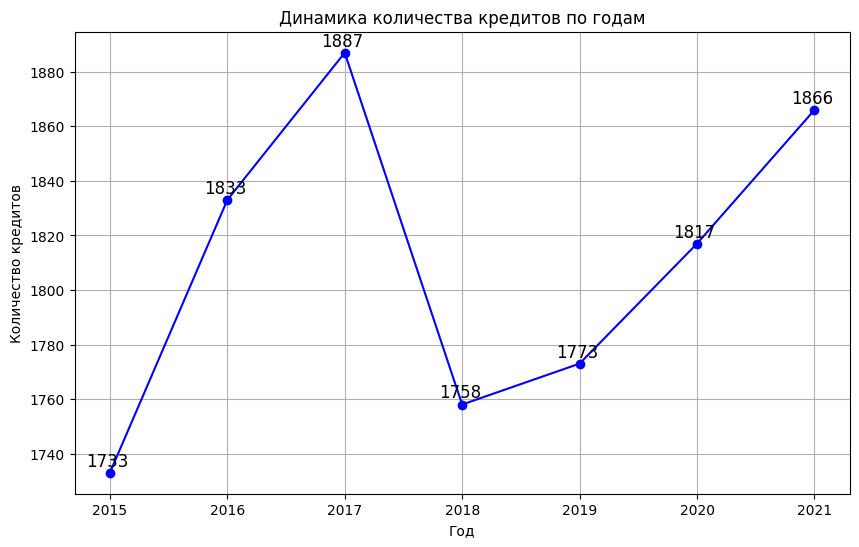

In [ ]:
# здесь происходит распаковка данных из словаря years_dict в два списка years и credit_counts.
years, credit_counts = zip(*years_dict)

# построение линейного графика
plt.figure(figsize=(10, 6)) # создается новая фигура для графика с указанным размером.
plt.plot(years, credit_counts, marker='o', linestyle='-', color='b')

# линейный график, где по оси X отображаются года, а по оси Y - количество кредитов.
# marker='o' добавляет круглые маркеры,
# linestyle='-' определяет способ соединения точек, а color='b' устанавливает синий цвет линии.

# цикл добавляет метки с кол-во кредитов над каждым маркером
for year, credit_count in zip(years, credit_counts):
    plt.text(year - 0.2, credit_count + 1, str(credit_count), ha='left', va='bottom', fontsize=12, color='black')

# Добавление заголовка и меток осей
plt.title('Динамика количества кредитов по годам')
plt.xlabel('Год')
plt.ylabel('Количество кредитов')

# Отображение графика
plt.grid(True) # сетка, сеточка.
plt.show()


**📉 Вывод из графика**

1. Больше всего кредитов брали в 2017 году
2. Меньше всего кредитов было взято 2015 году
3. 2018 и 2019 года имеют не большие показатели по кредитам, однако уровень колличества кредитов был восстановлен к 2021 году
4. 2016 и 2020 год имеют средние показатели колличества кредитов.



##### динамика по месяцам и годам

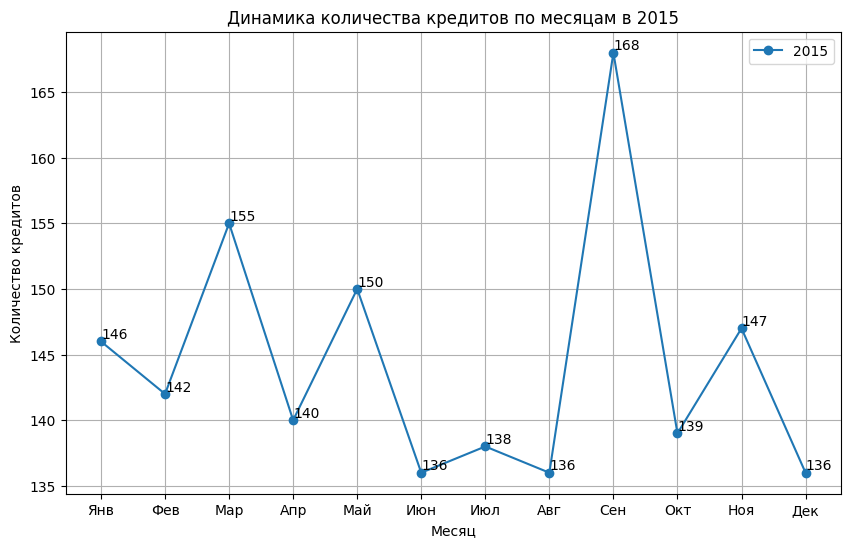

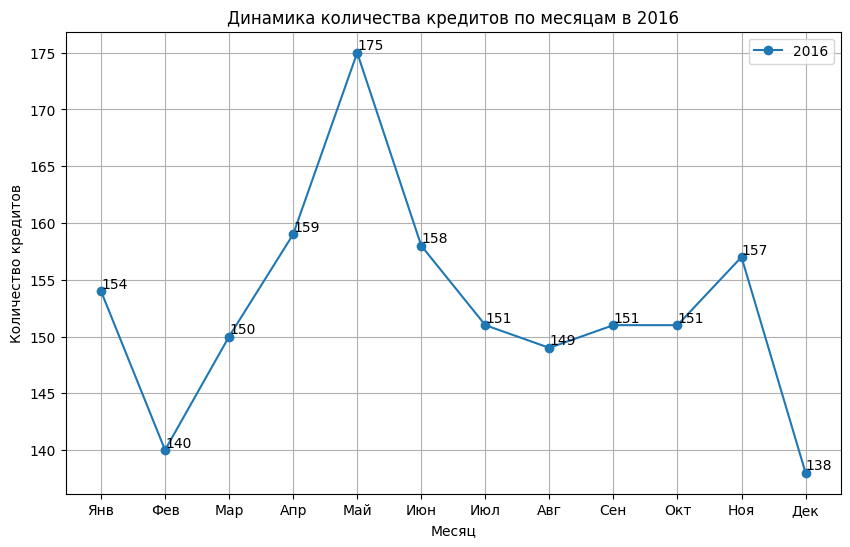

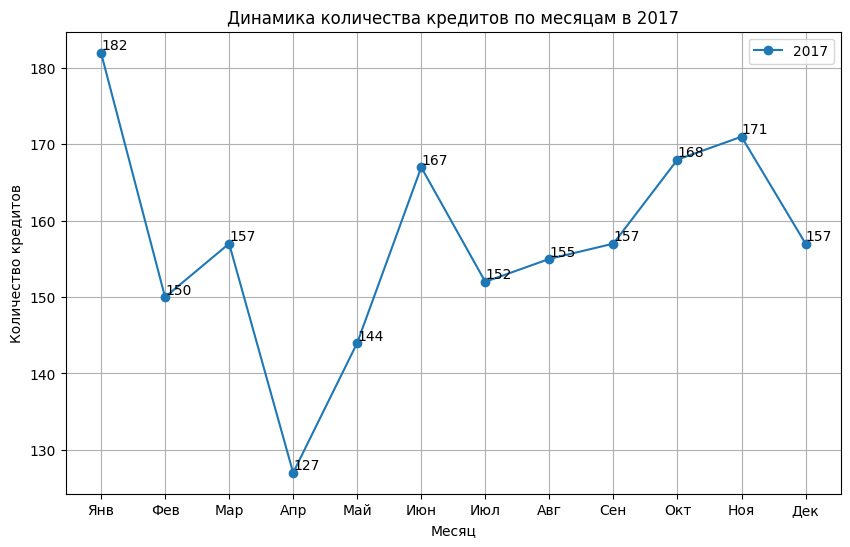

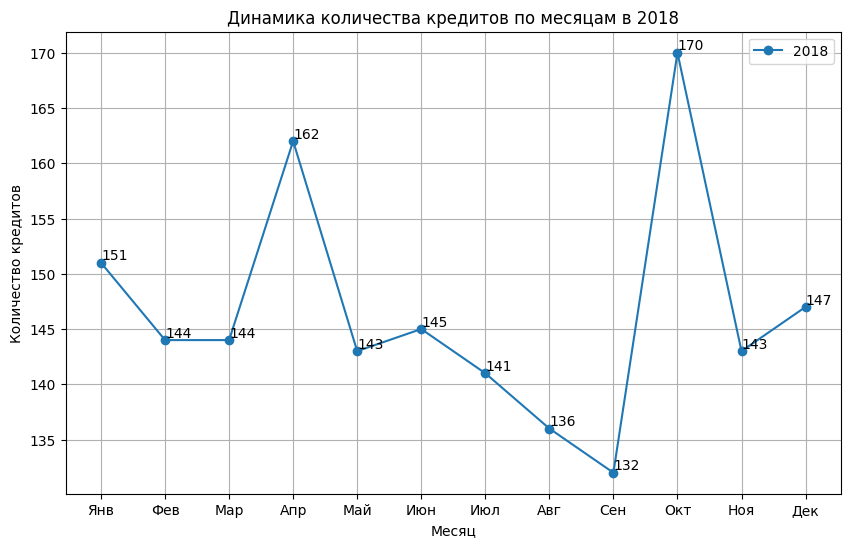

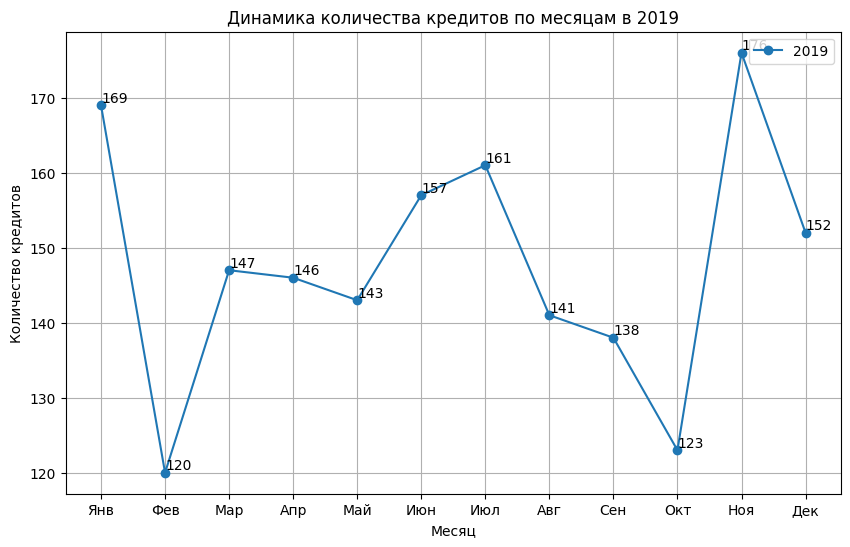

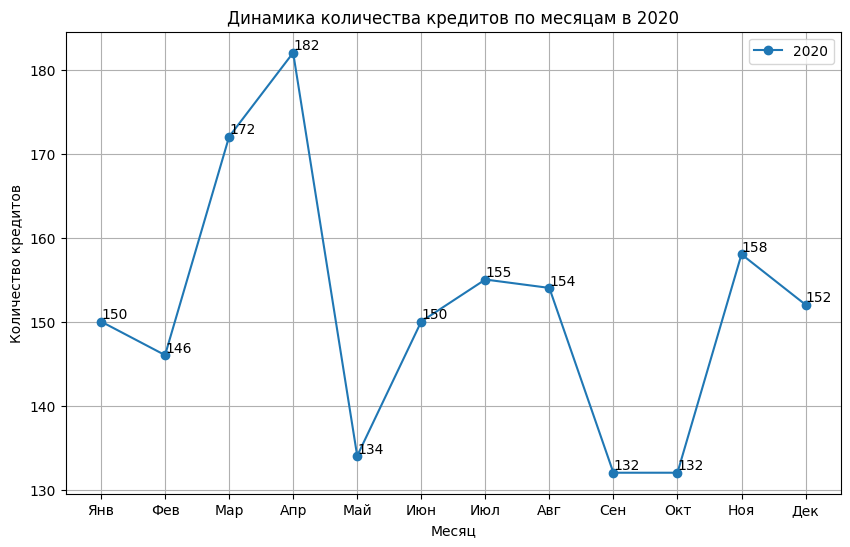

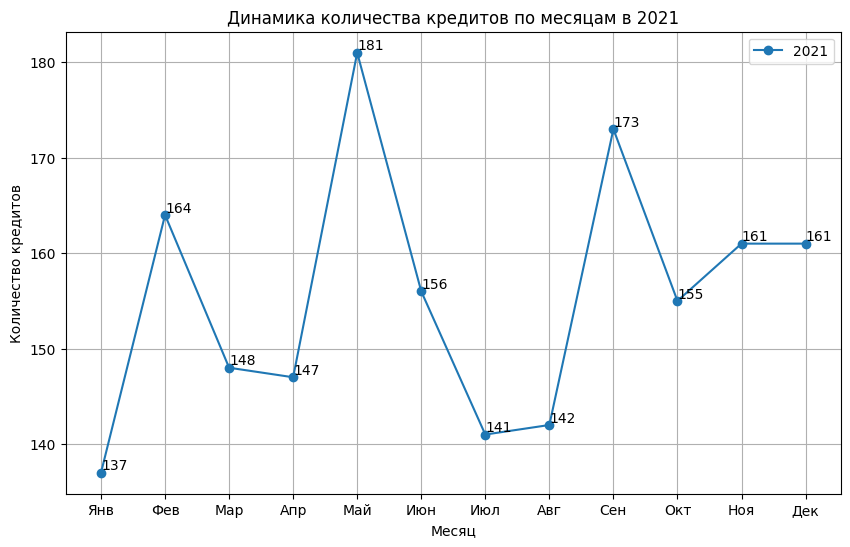

In [ ]:
# группировка по годам и месяцам. size() подсчитывает количество записей в каждой группе.
months_dict = df.groupby(['credit_year', 'credit_month']).size().reset_index(name='credit_count')
# тут мы сохраняем результаты в новом DataFrame months_dict с колонками 'credit_year', 'credit_month' и 'credit_count'.


# Начинается цикл по каждому уникальному году.
unique_years = sorted(df['credit_year'].unique()) # cоздается список уникальных годов из исходных данных.

for year in unique_years:
    data_year = months_dict[months_dict['credit_year'] == year] # cоздается DataFrame data_year, содержащий данные только для текущего года.


    # Построение графика
    plt.figure(figsize=(10, 6)) # создается новая фигура для графика с размерами 10 на 6 дюймов.
    plt.plot(data_year['credit_month'], data_year['credit_count'], marker='o', linestyle='-', label=str(year))
    # cтроится линейный график для текущего года. Месяцы на оси X, количество кредитов на оси Y. Круглые маркеры и подпись линии помогают визуализации.

    # Добавление меток и заголовка
    plt.title(f'Динамика количества кредитов по месяцам в {year}')
    plt.xlabel('Месяц')
    plt.ylabel('Количество кредитов')
    plt.xticks(range(1, 13), ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн', 'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек'])
    plt.legend()

    # Добавление меток для каждого маркера
    for i, txt in enumerate(data_year['credit_count']):
        plt.text(data_year['credit_month'].iloc[i], txt, str(txt), ha='left', va='bottom', fontsize=10, color='black')


    # Отображение графика
    plt.grid(True)
    plt.show()

**📉 Вывод из графика**
1. 2015 год:
- пик: сентябрь
- спад: июнь, август и декабрь

<br>

2. 2016 год -
- пик -май
- спад - февраль, декабрь

<br>

3. 2017 го
- пик: январь
- спад: апрель

<br>

4. 2018 год:
- пик - октябрь
- спад: сентябрь

<br>

5. 2019 год
- пик: январь, ноябрь
- спад: февраль

<br>

6. 2020 год:
- пик: апрель
- спад: май, сентябрь, октябрь

<br>

7. 2021 год
- пик: май
- спад: январь

<br>

**Общий вывод**: мы не видим зависимостей у наших клиентов брать кредит по месяцам. Какой-либо корреляции не наблюдается.

#### 2. исследовать числовые и категориальные признаки в разрезе целевого признака;

##### 2.1 Выделить числовые (непрерывные) признаки в разрезе целого признака.

In [ ]:
# Разделение данных на две группы
target_1 = df[df['target'] == 1]
target_0 = df[df['target'] == 0]

In [ ]:
# формирование числовых признаков
select_numeric_columns = ['age','personal_income', 'fact_living_term',
                          'work_time', 'credit','term', 'loan_num_paym',
                          'loan_dlq_num', 'loan_max_dlq_amt']

###### Построение гистограмм плотности (здесь просто гистограмма, больше ничего)

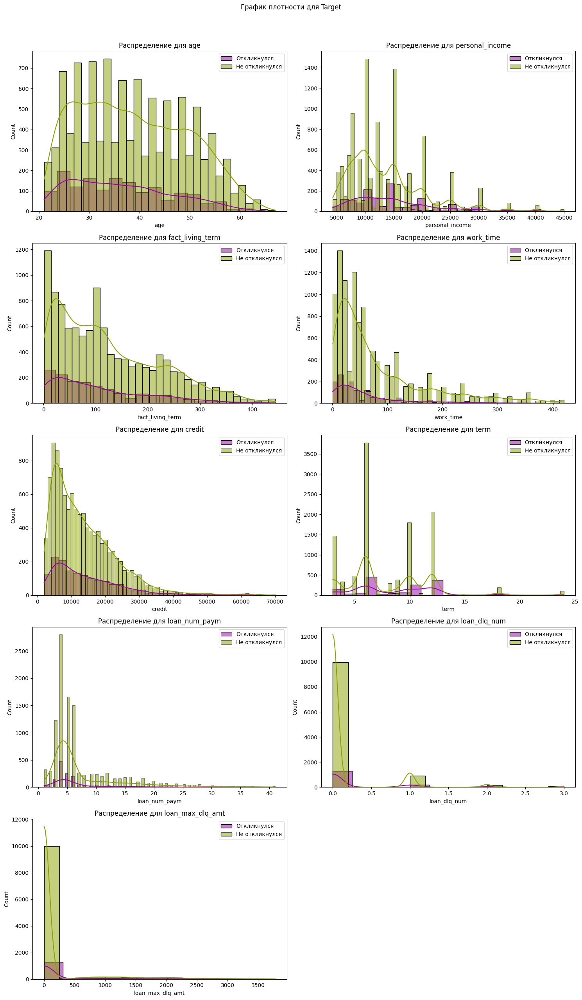

In [ ]:
# сайт для подбора цвета
# https://colorscheme.ru/


# сравнение распределений по всем числовым признакам в сетке (буду ли я использовать гистограммы? ... конечно же нет =)
num_features_per_row = 2
num_rows = ceil(len(select_numeric_columns) / num_features_per_row)
# этот код также правильно определит количество строк в сетке, используя операцию целочисленного деления и сложение с вычетом единицы.
# если кратко - меняй 2 на 3, будет делаться сетка из 3х графиков
# не помню откуда взял

# общая сетка
fig, axes = plt.subplots(num_rows, num_features_per_row, figsize=(15, 5 * num_rows))
fig.suptitle('График плотности для Target', y=1.02)

# делаем цикл для графиков
for i, feature in enumerate(select_numeric_columns):
    ax = axes[i // num_features_per_row, i % num_features_per_row]
    sns.histplot(df[df['target'] == 1][feature], kde=True, color='#9702A7', label='Откликнулся', ax=ax)
    sns.histplot(df[df['target'] == 0][feature], kde=True, color='#8BA100', label='Не откликнулся', ax=ax)
    ax.set_title(f'Распределение для {feature}')
    ax.legend()

# эта строка делает пустой график, если он нужен
for i in range(len(select_numeric_columns), num_rows * num_features_per_row):
    fig.delaxes(axes.flatten()[i])

# пояснение для этого куска кода
# 1й фрагмент кода создает последовательность числе, начиная с индекса = длине списка
# и заканчивая значением num_rows * num_features_per_row - 1
# это нужно для итерации по доп, пустым графикам, в случае
# если количество признаков не является точным кратным num_features_per_row
# и требуется доп графики для корректного отображения
# 2й фрагмент удаляет доп. пустые графики в случае, если кол. числовых признаков
# не является кратным num_features_per_row
# axes.flatten()[i] обращается к одномерному массиву всех подграфиков в сетке
# fig.delaxes() используется для удаления указанного подграфика

plt.tight_layout()
plt.show()


###### Просмотр посредством тепловой карты

<ipython-input-138-62291330893c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(df.corr(), annot=True, cmap="viridis", fmt=".2f", linewidths=.5)


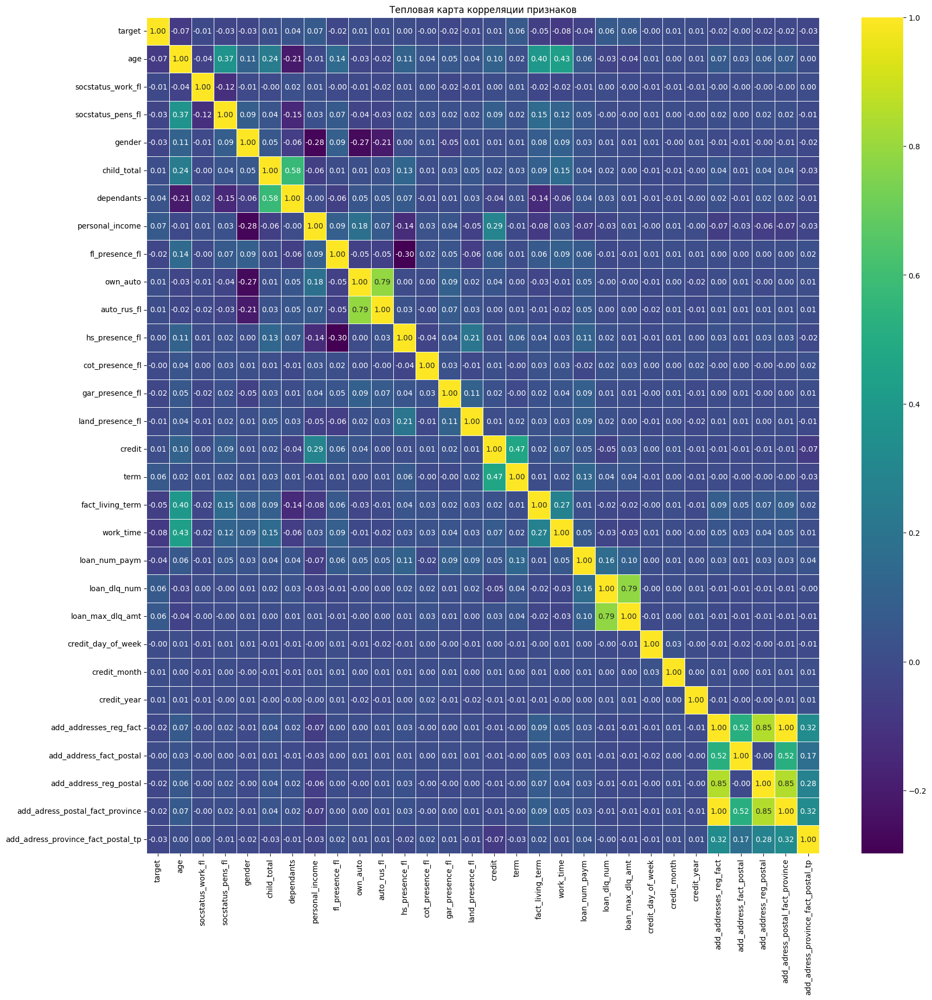

In [ ]:
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(df.corr(), annot=True, cmap="viridis", fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции признаков')
plt.show()

Проверим наши соображения ещё раз:

In [ ]:
# коэффициенты корреляции

for col in select_numeric_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

df.corr()

<ipython-input-139-b51f91e5901c>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,target,age,socstatus_work_fl,socstatus_pens_fl,gender,child_total,dependants,personal_income,fl_presence_fl,own_auto,...,loan_dlq_num,loan_max_dlq_amt,credit_day_of_week,credit_month,credit_year,add_addresses_reg_fact,add_address_fact_postal,add_address_reg_postal,add_adress_postal_fact_province,add_adress_province_fact_postal_tp
target,1.00,-0.07,-0.01,-0.03,-0.03,0.01,0.04,0.06,-0.02,0.01,...,0.06,0.06,-0.00,0.01,0.01,-0.02,-0.00,-0.02,-0.02,-0.03
age,-0.07,1.00,-0.04,0.37,0.11,0.24,-0.21,-0.02,0.14,-0.03,...,-0.03,-0.04,0.01,0.00,0.01,0.07,0.03,0.06,0.07,0.00
socstatus_work_fl,-0.01,-0.04,1.00,-0.12,-0.01,-0.00,0.02,0.02,-0.00,-0.01,...,0.00,-0.01,-0.01,-0.01,-0.01,-0.00,-0.00,-0.00,-0.00,0.00
socstatus_pens_fl,-0.03,0.37,-0.12,1.00,0.09,0.04,-0.15,0.04,0.07,-0.04,...,-0.00,-0.00,0.01,0.00,-0.00,0.02,0.00,0.02,0.02,-0.01
gender,-0.03,0.11,-0.01,0.09,1.00,0.05,-0.06,-0.29,0.09,-0.27,...,0.01,0.00,0.01,-0.00,0.01,-0.01,-0.01,-0.00,-0.01,-0.02
child_total,0.01,0.24,-0.00,0.04,0.05,1.00,0.58,-0.07,0.01,0.01,...,0.02,0.00,-0.01,-0.01,-0.00,0.04,0.01,0.04,0.04,-0.03
dependants,0.04,-0.21,0.02,-0.15,-0.06,0.58,1.00,-0.02,-0.06,0.05,...,0.03,0.01,-0.01,-0.01,-0.00,0.02,-0.01,0.02,0.02,-0.01
personal_income,0.06,-0.02,0.02,0.04,-0.29,-0.07,-0.02,1.00,0.10,0.17,...,-0.03,0.02,-0.01,0.01,-0.00,-0.07,-0.03,-0.06,-0.07,-0.02
fl_presence_fl,-0.02,0.14,-0.00,0.07,0.09,0.01,-0.06,0.10,1.00,-0.05,...,-0.01,-0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.02
own_auto,0.01,-0.03,-0.01,-0.04,-0.27,0.01,0.05,0.17,-0.05,1.00,...,-0.00,0.00,-0.01,0.00,-0.02,0.00,0.01,-0.00,0.00,0.01


Это предварительные выводы.

- Возраст (age) имеет слабую отрицательную корреляцию с целевым признаком (-0.07). Это может указывать на то, что более старшие клиенты менее склонны реагировать на маркетинговую кампанию.

- Время работы на текущем месте (work_time) также имеет отрицательную корреляцию (-0.08), что может указывать на то, что более долгий стаж на текущем месте работы связан с меньшей вероятностью отклика.

- Личный доход клиента (personal_income) и срок кредита (term) имеют положительную корреляцию с целевым признаком (0.06). Возможно, более высокий доход и длительные сроки кредита связаны с более высокой вероятностью отклика на маркетинговую кампанию.

- Дети (child_total), иждивенцы (dependants), наличие автомобиля (own_auto), автомобиль российского производства (auto_rus_fl) и другие признаки имеют слабую корреляцию с целевым признаком.

В итоге мы выделили следующие числовые данные:
- Возраст
- Время работы
- Личный доход
- Сроки кредита

Возраст

In [ ]:
# выборка на две группы по значению target
target_1 = df[df['target'] == 1]['age']
target_0 = df[df['target'] == 0]['age']

# U-критерий Манна — Уитни
statistic, p_value = mannwhitneyu(target_1, target_0, alternative='two-sided')

# результаты
print(f'U-Statistic: {statistic:.3f}')
print(f'p-value: {p_value:.3f}')

# Определяем, есть ли статистическое различие
alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует статистическое различие в возрасте между клиентами с target=1 и target=0")
else:
    print("Не удалось отвергнуть нулевую гипотезу: Нет статистического различия в возрасте между клиентами с target=1 и target=0")

U-Statistic: 7468005.000
p-value: 0.000
Отвергаем нулевую гипотезу: Существует статистическое различие в возрасте между клиентами с target=1 и target=0


Время работы

In [ ]:
target_1 = df[df['target'] == 1]['work_time']
target_0 = df[df['target'] == 0]['work_time']

statistic, p_value = mannwhitneyu(target_1, target_0, alternative='two-sided')
print(f'U-Statistic: {statistic:.3f}')
print(f'p-value: {p_value:.3f}')
alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует статистическое различие в времени работы между клиентами с target=1 и target=0")
else:
    print("Не удалось отвергнуть нулевую гипотезу: Нет статистического различия в времени работы между клиентами с target=1 и target=0")

U-Statistic: 7310010.000
p-value: 0.000
Отвергаем нулевую гипотезу: Существует статистическое различие в времени работы между клиентами с target=1 и target=0


Личный доход

In [ ]:
target_1 = df[df['target'] == 1]['personal_income']
target_0 = df[df['target'] == 0]['personal_income']

statistic, p_value = mannwhitneyu(target_1, target_0, alternative='two-sided')
print(f'U-Statistic: {statistic:.3f}')
print(f'p-value: {p_value:.3f}')
alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует статистическое различие в личном доходе между клиентами с target=1 и target=0")
else:
    print("Не удалось отвергнуть нулевую гипотезу: Нет статистического различия в личном доходе между клиентами с target=1 и target=0")


U-Statistic: 9481263.500
p-value: 0.000
Отвергаем нулевую гипотезу: Существует статистическое различие в личном доходе между клиентами с target=1 и target=0


Сроки кредита

In [ ]:
target_1 = df[df['target'] == 1]['term']
target_0 = df[df['target'] == 0]['term']


statistic, p_value = mannwhitneyu(target_1, target_0, alternative='two-sided')
print(f'U-Statistic: {statistic:.3f}')
print(f'p-value: {p_value:.3f}')
alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует статистическое различие в сроках кредита между клиентами с target=1 и target=0")
else:
    print("Не удалось отвергнуть нулевую гипотезу: Нет статистического различия в сроках кредита между клиентами с target=1 и target=0")


U-Statistic: 9502153.500
p-value: 0.000
Отвергаем нулевую гипотезу: Существует статистическое различие в сроках кредита между клиентами с target=1 и target=0


###### Просмотр через mean и median

In [ ]:
# группируем столбцы
df.groupby('target')[select_numeric_columns].agg(['mean','median']).round(0).reset_index()

target   age        personal_income        fact_living_term         \
          mean median            mean median             mean median   
0      0 18.00  17.00           93.00  91.00           123.00  99.00   
1      1 15.00  14.00          101.00 109.00           107.00  83.00   

  work_time         credit         term        loan_num_paym         \
       mean median    mean  median mean median          mean median   
0     73.00  47.00 3144.00 2996.00 5.00   3.00          7.00   4.00   
1     57.00  35.00 3207.00 3049.00 6.00   6.00          6.00   4.00   

  loan_dlq_num        loan_max_dlq_amt         
          mean median             mean median  
0         0.00   0.00            39.00   0.00  
1         0.00   0.00            62.00   0.00

🤔 Выводы по таблице

**По возрасту (age)**
1. Для группы, которая не откликнулась на рекламу - средний возраст составляет 39 лет
2. Для группы, которая откликнулась на рекламу - средний возраст  - 36 лет

Значит, средний возраст для тех, кто откликнулся на рекламу

3. Для группы, которая не откликнулась на рекламу - медианный возраст равен 38 годам.
4. Для группы, которая откликнулась на рекламу - медианный возраст равен 35 годам.

Медианный возраст также подтверждает, что группа, откликнувшаяся на рекламу, имеет более молодой возрастной профиль.

<br>

**Общий вывод**: Исходя из предоставленных данных, можно предположить, что более молодые люди, в среднем, склонны откликаться на рекламные предложения по сравнению с более старшими.

<br>

**По личному доходу (personal_income)**
5. Для группы, которая не откликнулась на рекламу - средний личный доход составляет 13,457.
6. Для группы, которая откликнулась на рекламу - средний личный доход составляет 14,807

Получается, что средний личный доход выше у тех, кто откликнулся на рекламу, по сравнению с теми, кто не откликнулся. Ну, совсем немного.

7. Для группы, которая не откликнулась на рекламу -  медианный личный доход равен 12,000.
8. Для группы, которая откликнулась на рекламу - медианный личный доход равен 14,000

Медианный личный доход также подтверждает, что группа, откликнувшаяся на рекламу, имеет более высокий медианный личный доход.

<br>

**Общий вывод**: в целом, эти две категории не так информативны для нас.

<br>

**Для колличества месяцев проживания по месту фактического пребывания (fact_living_tern)**

9. Для группы, которая не откликнулась на рекламу - они проживают на фактическом месте проживания 10 летв среднем
10. Для группы, которая откликнулась на рекламу - они проживают на фактическом месте проживания 9 лет в среднем

<br>

Общий вывод: те, кто откликаются на рекламу, чаще меняют место жительство, чем те, что склонны не откликаться на наше предложение

**Для сумма просрочки (loan_max_dlq_amt)**
9. Для группы, которая не откликнулась на рекламу -средняя максимальная сумма просрочки составляет 169.
10. Для группы, которая откликнулась на рекламу - средняя максимальная сумма просрочки составляет 272

**Вывод?** Это может указывать на то, что те, кто откликается на рекламу, могут иметь более высокий уровень задолженности или более серьезные просрочки по сравнению с теми, кто не откликается.

##### 2.2. Анализ по бинарным категориям


In [ ]:
# создаём переменную
select_dihotomia_columns = ['socstatus_work_fl','socstatus_pens_fl',
                        'gender','org_tp_fcapital','fl_presence_fl',
                        'auto_rus_fl','hs_presence_fl','cot_presence_fl',
                        'gar_presence_fl','land_presence_fl','add_adress_province_fact_postal_tp' ]

In [ ]:
# проверяем по z критериям
for col in select_dihotomia_columns:
    test_z_criterion(col, 'target', 0.05)

Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.26
Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<socstatus_work_fl>> статистически незначима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.00
Отвергаем нулевую гипотезу: разница в долях
по признаку <<socstatus_pens_fl>> статистически значима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.00
Отвергаем нулевую гипотезу: разница в долях
по признаку <<gender>> статистически значима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.36
Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<org_tp_fcapital>> статистически незначима.
------------------------

In [ ]:
# переменную для хранения количества откликнувшихся
total_positive = df.loc[df['target'] == 1].shape[0]

# общее количество откликнувшихся
print("Всего откликнувшихся на маркетинговую кампанию:", total_positive)
print(f"Из {df.shape[0]} это {total_positive / df.shape[0] * 100:.1f}% процентов\n")

# проходим по каждому бинарному признаку
for col in select_dihotomia_columns:
    # подсчитываем количество откликнувшихся с признаком равным 1
    positive_with_feature = df.loc[(df[col] == 1) & (df['target'] == 1)].shape[0]

    # подсчитываем количество откликнувшихся без признака (равным 0)
    positive_without_feature = df.loc[(df[col] == 0) & (df['target'] == 1)].shape[0]

    # подсчитываем общее количество записей с признаком равным 1
    total_with_feature = df.loc[df[col] == 1].shape[0]

    # выводим информацию по каждому признаку
    print(f"Признак {col}:")
    print(f"  - Процент откликнувшихся с признаком = {100 * positive_with_feature / total_positive:.1f}%")
    print(f"  - Процент откликнувшихся без признака = {100 * positive_without_feature / total_positive:.1f}%")
    print("------------------------------------------------------------")

Всего откликнувшихся на маркетинговую кампанию: 1535
Из 12667 это 12.1% процентов

Признак socstatus_work_fl:
  - Процент откликнувшихся с признаком = 99.9%
  - Процент откликнувшихся без признака = 0.1%
------------------------------------------------------------
Признак socstatus_pens_fl:
  - Процент откликнувшихся с признаком = 2.7%
  - Процент откликнувшихся без признака = 97.3%
------------------------------------------------------------
Признак gender:
  - Процент откликнувшихся с признаком = 60.1%
  - Процент откликнувшихся без признака = 39.9%
------------------------------------------------------------
Признак org_tp_fcapital:
  - Процент откликнувшихся с признаком = 0.0%
  - Процент откликнувшихся без признака = 0.0%
------------------------------------------------------------
Признак fl_presence_fl:
  - Процент откликнувшихся с признаком = 27.7%
  - Процент откликнувшихся без признака = 72.3%
------------------------------------------------------------
Признак auto_rus_fl:
 

#####  2.3. Выделить категориальные признаки в разрезе целого признака (мы выбрали, по нашему мнению, самые важные)

In [ ]:
# создание списка категорий
select_categor_select = [ 'child_total', 'dependants','marital_status',
                          'own_auto','education','gen_industry','gen_title',
                          'org_tp_state','job_dir','family_income']

In [ ]:
for col in select_categor_select:
    test_z_criterion(col, 'target', 0.05)

Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.13
Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<child_total>> статистически незначима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.40
Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<dependants>> статистически незначима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.00
Отвергаем нулевую гипотезу: разница в долях
по признаку <<marital_status>> статистически значима.
------------------------------------------------------------
Результаты проверки гипотезы H_0 по z-критерию:
Уровень значимости alpha=0.05
P-value: 0.10
Не получилось отвергнуть нулевую гипотезу: разница в долях по
признаку <<own_auto>> статистически незначима.
-------------------

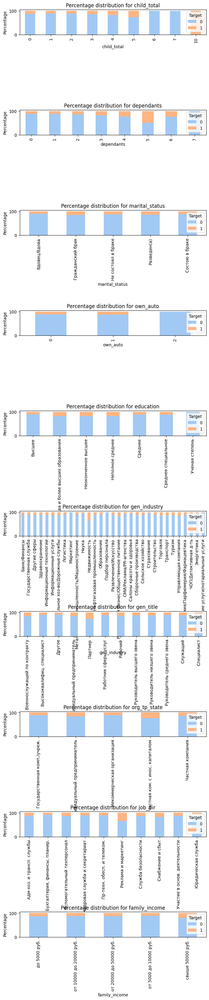

In [ ]:
# цветовая палитры
colors = sns.color_palette('pastel')
fig, axes = plt.subplots(nrows=10, ncols=1, figsize=(8, 40))
fig.subplots_adjust(hspace=3)

for i, col in enumerate(select_categor_select):
    data = df.groupby([col, 'target']).size().unstack()
    data_percentage = data.div(data.sum(axis=1), axis=0) * 100

    # Построение столбчатой диаграммы
    ax = axes[i]
    data_percentage.plot(kind='bar', stacked=True, color=colors, ax=ax)

    # Добавление названия признака и меток
    ax.set_title(f'Percentage distribution for {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Percentage')
    ax.legend(title='Target', loc='upper right', labels=['0', '1'])

plt.show()

#### сделать выводы о влиянии признаков на целевой признак.

1. Возраст: средний возраст клиентов которые отреагировали на маркетинговую кампанию значительно меньше (36 лет), чем у клиентов, которым реклама была не интересна (39 лет).

 ✅*Таким образом, можно сказать, что более молодые клиенты более склонны реагировать на маркетинговую кампанию.*

 <br>

2. Время работы: среднее время работы в месяцах у наши клиентов, которые отреагировали на маркетинговую кампанию значительно меньше (63.00), по сравнению с клиентами, которым компания не была интересна (83.00)

 ✅*Таким образом, время работы оказывает влияние на вероятность клиента откликнуться на маркетинговую кампанию. Клиенты с более коротким временем работы более склонны к положительному отклику. Это может свидетельствовать о том, что клиенты в начальных этапах карьеры или с более динамичной трудовой деятельностью могут быть более открытыми к маркетинговым предложениям*

  <br>
  
3. Личный доход: средний личный доход клиентов которые отреагировали на маркетинговую кампанию выше (14,807.00), чем у клиентов, которым реклама была не интересна (13,457.00)

 ✅*Личный доход оказывает влияние на вероятность клиента откликнуться на маркетинговую кампанию. Клиенты с более высоким личным доходом имеют большую вероятность положительного отклика на предложения.*

<br>

4. Сроки кредита: в среднем, клиенты, которые реагируют на нашу маркетинговую кампанию имеют более длительные сроки кредитов (9), чем те, которые не откликнулись на наше предложение (8)

 ✅ *Клиенты, реагирующие на предложения, предпочитают кредиты с более продолжительным сроком.*

<br>

5. Некоторое значение может оказать социальный статус нашего клиента, который готов откликнутся на нашу маркетинговую компанию.

 ✅ *В основном на комерческую кампанию откликаются работающие клиенты, граждане, в чьей собственности есть жилое помещение. Люди из рекламы и маркетинга, партнёры, деятели науки, имеющие около четырёх детей чуть больше склонны откликаться, нежели иные сферы деятельности Пенсионеры реже подвержены интересу маркетинговой кампании. Наличие автомобиля, котеджа и земельного участка дают небольшой положительный эффект, но не сильно влияют на выбор клиентов.*

<br>

